In [118]:
import numpy as np
import astropy.io.fits as fits
import astropy.io.ascii
import astropy.units as u
from astropy.nddata import NDData, VarianceUncertainty, InverseVariance, StdDevUncertainty
from sedpy.observate import air2vac
from prospect import utils
from scipy.interpolate import interp1d
import pandas as pd
import glob
from specutils.analysis import centroid
from specutils import Spectrum1D, SpectralRegion
from specutils.manipulation import FluxConservingResampler, LinearInterpolatedResampler, SplineInterpolatedResampler
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.cm as cm
from astropy.modeling import models
from specutils.manipulation import extract_region
from specutils.fitting import fit_lines
import scipy.optimize as op
from scipy.stats import chisquare
from read_alf import Alf
from scipy.stats import median_abs_deviation
from uncertainties import ufloat
import uncertainties.umath as umath
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from matplotlib.colors import LogNorm
from scipy.optimize import curve_fit
from scipy.stats import media

font = {'family':'serif',
        'weight':'normal',
        'size':20
}
plt.rc('font',**font)

%matplotlib inline

from IPython.core.display import display, HTML
display(HTML('<style>.container { width:100% !important; }<\style>'))

ImportError: cannot import name 'media' from 'scipy.stats' (/Applications/anaconda3/lib/python3.8/site-packages/scipy/stats/__init__.py)

In [44]:
class alf_processing(Alf):
        
    def __init__(self, path, wave_ranges, filetype):
        self.path = path
        self.wave_ranges = wave_ranges
        if filetype == 53:
            self.labels = ['velz', 'sigma', 'logage', 'zH', 'FeH', 'aH', 'CH', 'NH', 'NaH', 'MgH', 'SiH', 'KH', 'CaH', 'TiH', 'VH',
             'CrH', 'MnH', 'CoH', 'NiH', 'CuH', 'SrH', 'BaH', 'EuH', 'MgFe', 'Teff', 'IMF1', 'IMF2', 'logfy',
              'sigma2', 'velz2', 'hotteff', 'logm7g', 'loghot', 'fy_logage', 'logemline_h', 'logemline_oii', 
              'logemline_oiii', 'logemline_sii', 'logemline_ni', 'logemline_nii', 'logtrans', 'jitter', 'logsky', 
             'IMF3', 'IMF4', 'h3', 'h4', 'ML_v', 'MW_v', 'alpha', 'SiFe', 'CaFe', 'TiFe', 'ML_k']
        elif filetype == 50:
            self.labels = ['velz', 'sigma', 'logage', 'zH', 'FeH', 'aH', 'CH', 'NH', 'NaH', 'MgH', 'SiH', 'KH', 'CaH', 'TiH', 'VH',
             'CrH', 'MnH', 'CoH', 'NiH', 'CuH', 'SrH', 'BaH', 'EuH', 'MgFe', 'Teff', 'IMF1', 'IMF2', 'logfy',
              'sigma2', 'velz2', 'hotteff', 'logm7g', 'loghot', 'fy_logage', 'logemline_h', 
              'logemline_oiii', 'logemline_sii', 'logemline_ni', 'logemline_nii', 'logtrans', 'jitter', 'logsky', 
             'IMF3', 'IMF4', 'ML_v', 'MW_v', 'alpha', 'SiFe', 'CaFe', 'TiFe', 'ML_k']
        
        self.alf_result = None
        self.waves = None
        self.data_flux = None
        self.model_flux = None
        self.residuals = None
        self.unc = None
        self.lo_err = np.zeros(len(self.labels))
        self.hi_err = np.zeros(len(self.labels))
        self.fit_params = None
        
    def get_correct_alf_data(self, filetype):
        """Return the normalized and abundance-corrected alf fit results.

        Parameters
        ----------
        path : str
            Path to alf fit result files for a particular object (no extension)

        Returns
        -------
        alf_result : read_alf.Alf object
            alf fit results, normalized and abundance-corrected
        """

        self.alf_result = Alf(self.path, read_mcmc=True)
        self.alf_result.normalize_spectra()
        self.alf_result.get_total_met()
        self.alf_result.abundance_correct(m11=True)
        if filetype == 50:
            self.alf_result.model_info['Nsample'] = 1
        return self.alf_result

    def data_split(self, wave_range, alf_result):
        """Return the alf fit data, split by wavelength chunks.

        Parameters
        ----------
        wave_range : list
            Start and end of wavelength chunk
        alf_result : read_alf.Alf object
            alf fit results, normalized and abundance-corrected 

        Returns
        -------
        waves : tuple
            Wavelengths in wavelength chunk
        data_flux : tuple
            Flux of data in wavelength chunk
        model_flux : tuple
            Flux of model (fit) in wavelength chunk
        residuals : tuple
            Residuals between data and model in wavelength chunk
        unc : tuple
            Spectral uncertainty in wavelength chunk
        """

        self.waves = alf_result.spectra['wave'][(alf_result.spectra['wave'] > wave_range[0]) & (alf_result.spectra['wave'] \
                                           < wave_range[-1])]
        self.data_flux = alf_result.spectra['d_flux_norm'][(alf_result.spectra['wave'] > wave_range[0]) & \
                                                      (alf_result.spectra['wave'] < wave_range[-1])]
        self.model_flux = alf_result.spectra['m_flux_norm'][(alf_result.spectra['wave'] > wave_range[0]) & \
                                                      (alf_result.spectra['wave'] < wave_range[-1])]
        self.residuals = alf_result.spectra['residual'][(alf_result.spectra['wave'] > wave_range[0]) & \
                                                   (alf_result.spectra['wave'] < wave_range[-1])]
        self.unc = alf_result.spectra['unc'][(alf_result.spectra['wave'] > wave_range[0]) &  (alf_result.spectra['wave'] \
                                        < wave_range[-1])]
        return self.waves, self.data_flux, self.model_flux, self.residuals, self.unc

    def alf_preprocessing(self, filetype):
        """Pre-process the alf fit results.  Essentially just calls the two functions above.

        Parameters
        ----------
        path : str
            Path to alf fit result files for a particular object (no extension)
        wave_ranges : tuple
            List of list of wavelength chunks

        Returns
        -------
        alf_result : read_alf.Alf object
            alf fit results, normalized and abundance-corrected 
        waves : tuple
            Wavelengths in all wavelength chunks
        data_flux : tuple
            Flux of data in all wavelength chunks
        model_flux : tuple
            Flux of model (fit) in all wavelength chunks
        residuals : tuple
            Residuals between data and model in all wavelength chunks
        unc : tuple
            Spectral uncertainty in all wavelength chunks
        """

        #Read alf fit results
        self.alf_result = alf_processing.get_correct_alf_data(self, filetype)

        #Split the data into wavelength chunks
        split_data = []
        for i in range(len(self.wave_ranges)):
            split_data.append(alf_processing.data_split(self, self.wave_ranges[i], self.alf_result))
        split_data = np.array(split_data, dtype=object)

        self.waves = split_data[:,0]
        self.data_flux = split_data[:,1]
        self.model_flux = split_data[:,2]
        self.residuals = split_data[:,3]
        self.unc = split_data[:,4]
        
    def plot_3chunks(self, title_str):
        fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 5), gridspec_kw={'height_ratios': [3, 1]})
        fig.set_tight_layout(True)
        fig.suptitle(title_str, fontsize=20, y=1.01)
        for i in range(len(self.waves)):
            ax[0,i].plot(self.waves[i], self.data_flux[i], color='dimgrey', lw=3)
            ax[0,i].plot(self.waves[i], self.model_flux[i], color='dodgerblue', alpha=0.7, lw=3)

            ax[1,i].plot(self.waves[i], self.residuals[i], color='dodgerblue', lw=2, alpha=0.7)
            ax[1,i].fill_between(self.waves[i], -(self.unc[i])*1e2, +(self.unc[i])*1e2, color='grey')

            ax[0,i].tick_params(length=6, width=2, labelsize=15)
            ax[1,i].tick_params(length=6, width=2, labelsize=15)
            ax[1,i].set_xlabel('Wavelength ($\AA$)', fontsize=15)
        ax[0,0].set_ylabel('Normalized Flux \n(Arb.)', fontsize=15)
        ax[1,0].set_ylabel('Residuals \n(%)', fontsize=15)
        
    def plot_5chunks(self, title_str):
        fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 10), gridspec_kw={'height_ratios':[3,1,3,1]})
        fig.set_tight_layout(True)
        fig.suptitle(title_str, fontsize=20, y=1.01)
        for i in range(0, 3):
            ax[0,i].plot(self.waves[i], self.data_flux[i], color='dimgrey', lw=3)
            ax[0,i].plot(self.waves[i], self.model_flux[i], color='r', alpha=0.7, lw=3)

            ax[1,i].plot(self.waves[i], self.residuals[i], color='r', lw=2, alpha=0.7)
            ax[1,i].fill_between(self.waves[i], -(self.unc[i])*1e2, +(self.unc[i])*1e2, color='grey')
            
            ax[0,i].tick_params(length=6, width=2, labelsize=15)
            ax[1,i].tick_params(length=6, width=2, labelsize=15)
        
        for i in range(0, 2):
            ax[2,i].plot(self.waves[i+3], self.data_flux[i+3], color='dimgrey', lw=3)
            ax[2,i].plot(self.waves[i+3], self.model_flux[i+3], color='r', alpha=0.7, lw=3)

            ax[3,i].plot(self.waves[i+3], self.residuals[i+3], color='r', lw=2, alpha=0.7)
            ax[3,i].fill_between(self.waves[i+3], -(self.unc[i+3])*1e2, +(self.unc[i+3])*1e2, color='grey')
            
            ax[2,i].tick_params(length=6, width=2, labelsize=15)
            ax[3,i].tick_params(length=6, width=2, labelsize=15)
            
        ax[2,2].axis('off')
        ax[3,2].axis('off')
        ax[0,0].set_ylabel('Normalized Flux \n(Arb.)', fontsize=15)
        ax[1,0].set_ylabel('Residuals \n(%)', fontsize=15)
        ax[2,0].set_ylabel('Normalized Flux \n(Arb.)', fontsize=15)
        ax[3,0].set_ylabel('Residuals \n(%)', fontsize=15)

    def calculate_param_errs(self):
        for i in range(len(self.labels)):
            if self.labels[i] == 'FeH':
                self.lo_err[i] = self.alf_result.tmet['cl50'] - self.alf_result.tmet['cl16']
                self.hi_err[i] = self.alf_result.tmet['cl84'] - self.alf_result.tmet['cl50']
            elif 'H' in self.labels[i] and 'z' not in self.labels[i] and 'Fe' not in self.labels[i]:
                self.lo_err[i] = self.alf_result.xH[self.labels[i][:-1]][5] - self.alf_result.xH[self.labels[i][:-1]][4]
                self.hi_err[i] = self.alf_result.xH[self.labels[i][:-1]][6] - self.alf_result.xH[self.labels[i][:-1]][5]
            elif self.labels[i][2:] == 'Fe':
                self.lo_err[i] = self.alf_result.xFe[self.labels[i][:-2]]['cl50'] - self.alf_result.xFe[self.labels[i][:-2]]['cl16']
                self.hi_err[i] = self.alf_result.xFe[self.labels[i][:-2]]['cl84'] - self.alf_result.xFe[self.labels[i][:-2]]['cl50']
            elif self.labels[i] == 'alpha':
                ML_v = np.where(self.alf_result.labels == 'ML_v')
                MW_v = np.where(self.alf_result.labels == 'MW_v')
                alpha_IMF_chain = np.sort(np.squeeze(self.alf_result.mcmc[:, ML_v]/self.alf_result.mcmc[:, MW_v]))
                num = self.alf_result.model_info['Nwalkers']*self.alf_result.model_info['Nchain']\
                /self.alf_result.model_info['Nsample']
                lower = alpha_IMF_chain[int(0.160*num)]
                median = alpha_IMF_chain[int(0.500*num)]
                upper = alpha_IMF_chain[int(0.840*num)]
                cl95 = alpha_IMF_chain[int(0.950*num)]
                std = np.std(alpha_IMF_chain)
                self.lo_err[i] = median - lower
                self.hi_err[i] = upper - median
            else:
                self.lo_err[i] = self.alf_result.results[self.labels[i]][5] - self.alf_result.results[self.labels[i]][4]
                self.hi_err[i] = self.alf_result.results[self.labels[i]][6] - self.alf_result.results[self.labels[i]][5]

    def get_fitted_params(self):
        inds = ['median', 'lo_err', 'hi_err']
        
        alf_processing.calculate_param_errs(self)

        col_vals = []
        for i in range(len(self.labels)):
            if self.labels[i] == 'FeH':
                col_vals.append([self.alf_result.tmet['cl50'], self.lo_err[i], self.hi_err[i]])
            elif 'H' in self.labels[i] and 'z' not in self.labels[i] and 'Fe' not in self.labels[i]:
                col_vals.append([self.alf_result.xH[self.labels[i][:-1]][5], self.lo_err[i], self.hi_err[i]])
            elif self.labels[i][2:] == 'Fe':
                col_vals.append([self.alf_result.xFe[self.labels[i][:-2]]['cl50'], self.lo_err[i], self.hi_err[i]])
            elif self.labels[i] == 'alpha':
                ML_v = np.where(self.alf_result.labels == 'ML_v')
                MW_v = np.where(self.alf_result.labels == 'MW_v')
                alpha_IMF_chain = np.sort(np.squeeze(self.alf_result.mcmc[:, ML_v]/self.alf_result.mcmc[:, MW_v]))
                num = self.alf_result.model_info['Nwalkers']*self.alf_result.model_info['Nchain']\
                /self.alf_result.model_info['Nsample']
                median = alpha_IMF_chain[int(0.500*num)]
                col_vals.append([median, self.lo_err[i], self.hi_err[i]])
            else:
                col_vals.append([self.alf_result.results[self.labels[i]][5], self.lo_err[i], self.hi_err[i]])
        col_vals = np.array(col_vals).T

        self.fit_params = pd.DataFrame(data=col_vals, columns=self.labels, index=inds)
        
    def fig3_plot(objects, obj_names, vel_disps, title_str, savestr):
        cmap = plt.cm.viridis
        nums = np.linspace(0, 1, len(objects))
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=True)
        fig.set_tight_layout(True)
        fig.suptitle(title_str, fontsize=20, y=1.01)

        for i in range(len(objects)):
            ax[0].errorbar(objects[i].fit_params['FeH']['median'], objects[i].fit_params['alpha']['median'], 
                           xerr=[[objects[i].fit_params['FeH']['lo_err']], [objects[i].fit_params['FeH']['hi_err']]],
                          yerr=[[objects[i].fit_params['alpha']['lo_err']], [objects[i].fit_params['alpha']['hi_err']]], 
                          linestyle='None', marker='.', markersize=20, color=cmap(nums[i]), label=obj_names[i])
            ax[1].errorbar(objects[i].fit_params['MgFe']['median'], objects[i].fit_params['alpha']['median'], 
                           xerr=[[objects[i].fit_params['MgFe']['lo_err']], [objects[i].fit_params['MgFe']['hi_err']]],
                          yerr=[[objects[i].fit_params['alpha']['lo_err']], [objects[i].fit_params['alpha']['hi_err']]], 
                          linestyle='None', marker='.', markersize=20, color=cmap(nums[i]))
            ax[2].errorbar(vel_disps[i], objects[i].fit_params['alpha']['median'], 
                           yerr=[[objects[i].fit_params['alpha']['lo_err']], [objects[i].fit_params['alpha']['hi_err']]], 
                           linestyle='None', marker='.', markersize=20, color=cmap(nums[i]))
        for i in range(len(ax)):
            ax[i].axhline(1, linestyle='dashed', color='k')
            ax[i].tick_params(length=6, width=2, labelsize=12)

        ax[0].set_xlabel('[Fe/H]', fontsize=15)
        ax[0].set_ylabel('$ɑ_{IMF} = (M/L)/(M/L)_{MW}$', fontsize=15)
        ax[0].legend(fontsize=12, loc='lower right', bbox_to_anchor= (-0.2,0))

        ax[1].set_xlabel('[Mg/Fe]', fontsize=15)

        ax[2].set_xlabel('$\sigma$', fontsize=15)
        plt.savefig(savestr, bbox_inches='tight')

# Prep data

In [45]:
#Wavelength chunks
wave_range1 = [4000, 4700]
wave_range2 = [4700, 6000]
wave_range3 = [6000, 6700]
wave_range4 = [8004, 8920]
wave_range5 = [9630, 10150]
blue_wave_ranges = [wave_range1, wave_range2, wave_range3]
all_wave_ranges = [wave_range1, wave_range2, wave_range3, wave_range4, wave_range5]

#GCs
#alf pre-processing for blue sides (simple fit)
b058_new_blue = alf_processing('/Users/chloecheng/packages/alf/results/B058_new_vIK_b', blue_wave_ranges, 53)
b058_new_blue.alf_preprocessing(53)

b058_old_blue = alf_processing('/Users/chloecheng/packages/alf/results/B058_old_vIK_b', 
                               blue_wave_ranges, 53)
b058_old_blue.alf_preprocessing(53)

b163_blue = alf_processing('/Users/chloecheng/packages/alf/results/B163_vIK_b', 
                           blue_wave_ranges, 53)
b163_blue.alf_preprocessing(53)

b193_blue = alf_processing('/Users/chloecheng/packages/alf/results/B193_vIK_b', 
                           blue_wave_ranges, 53)
b193_blue.alf_preprocessing(53)

b067_blue = alf_processing('/Users/chloecheng/packages/alf/results/B067_vIK_b', blue_wave_ranges, 53)
b067_blue.alf_preprocessing(53)

b225_blue = alf_processing('/Users/chloecheng/packages/alf/results/B225_vIK_b', blue_wave_ranges, 53)
b225_blue.alf_preprocessing(53)

b012_blue = alf_processing('/Users/chloecheng/packages/alf/results/B012_vIK_b', blue_wave_ranges, 53)
b012_blue.alf_preprocessing(53)

b107_blue = alf_processing('/Users/chloecheng/packages/alf/results/B107_vIK_b', blue_wave_ranges, 53)
b107_blue.alf_preprocessing(53)

g001_blue = alf_processing('/Users/chloecheng/packages/alf/results/G001_vIK_b', blue_wave_ranges, 53)
g001_blue.alf_preprocessing(53)

b074_blue = alf_processing('/Users/chloecheng/packages/alf/results/B074_vIK_b', blue_wave_ranges, 53)
b074_blue.alf_preprocessing(53)

b338_blue = alf_processing('/Users/chloecheng/packages/alf/results/B338_vIK_b', blue_wave_ranges, 53)
b338_blue.alf_preprocessing(53)

b405_blue = alf_processing('/Users/chloecheng/packages/alf/results/B405_vIK_b', blue_wave_ranges, 53)
b405_blue.alf_preprocessing(53)

#alf pre-processing for full fits - GCs
b058_new = alf_processing('/Users/chloecheng/packages/alf/results/B058_new_vIK', all_wave_ranges, 53)
b058_new.alf_preprocessing(53)

b058_old = alf_processing('/Users/chloecheng/packages/alf/results/B058_old_vIK', all_wave_ranges, 53)
b058_old.alf_preprocessing(53)

b193 = alf_processing('/Users/chloecheng/packages/alf/results/B193_vIK', all_wave_ranges, 53)
b193.alf_preprocessing(53)

b163 = alf_processing('/Users/chloecheng/packages/alf/results/B163_vIK', all_wave_ranges, 53)
b163.alf_preprocessing(53)

b067 = alf_processing('/Users/chloecheng/packages/alf/results/B067_vIK', all_wave_ranges, 53)
b067.alf_preprocessing(53)

b225 = alf_processing('/Users/chloecheng/packages/alf/results/B225_vIK', all_wave_ranges, 53)
b225.alf_preprocessing(53)

b012 = alf_processing('/Users/chloecheng/packages/alf/results/B012_vIK', all_wave_ranges, 53)
b012.alf_preprocessing(53)

b107 = alf_processing('/Users/chloecheng/packages/alf/results/B107_vIK', all_wave_ranges, 53)
b107.alf_preprocessing(53)

g001 = alf_processing('/Users/chloecheng/packages/alf/results/G001_vIK', all_wave_ranges, 53)
g001.alf_preprocessing(53)

b074 = alf_processing('/Users/chloecheng/packages/alf/results/B074_vIK', all_wave_ranges, 53)
b074.alf_preprocessing(53)

b338 = alf_processing('/Users/chloecheng/packages/alf/results/B338_vIK', all_wave_ranges, 53)
b338.alf_preprocessing(53)

b405 = alf_processing('/Users/chloecheng/packages/alf/results/B405_vIK', all_wave_ranges, 53)
b405.alf_preprocessing(53)

#alf pre-processing for original data
b193_orig = alf_processing('/Users/chloecheng/packages/alf/results/m31_b193_broad_by200', all_wave_ranges, 53)
b193_orig.alf_preprocessing(53)

b163_orig = alf_processing('/Users/chloecheng/packages/alf/results/m31_b163_broad_by200', all_wave_ranges, 53)
b163_orig.alf_preprocessing(53)

b058_orig = alf_processing('/Users/chloecheng/packages/alf/results/m31_b058_broad_by200', all_wave_ranges, 53)
b058_orig.alf_preprocessing(53)

m59_orig = alf_processing('/Users/chloecheng/packages/alf/results/m59_ucd3_broad_by200_lris', all_wave_ranges, 53)
m59_orig.alf_preprocessing(53)

#alf pre-processing for UCDs
VUCD3 = alf_processing('/Users/chloecheng/packages/alf/results/VUCD3_vIK', all_wave_ranges, 53)
VUCD3.alf_preprocessing(53)

VUCD4 = alf_processing('/Users/chloecheng/packages/alf/results/VUCD4_vIK', all_wave_ranges, 53)
VUCD4.alf_preprocessing(53)

VUCD7 = alf_processing('/Users/chloecheng/packages/alf/results/VUCD7_vIK', all_wave_ranges, 53)
VUCD7.alf_preprocessing(53)

NGC4889 = alf_processing('/Users/chloecheng/packages/alf/results/NGC4889_vIK', all_wave_ranges, 53)
NGC4889.alf_preprocessing(53)

NGC4874 = alf_processing('/Users/chloecheng/packages/alf/results/NGC4874_vIK', all_wave_ranges, 53)
NGC4874.alf_preprocessing(53)

NGC4889_r = alf_processing('/Users/chloecheng/packages/alf/results/NGC4889_rIK', all_wave_ranges, 53)
NGC4889_r.alf_preprocessing(53)

NGC4874_r = alf_processing('/Users/chloecheng/packages/alf/results/NGC4874_rIK', all_wave_ranges, 53)
NGC4874_r.alf_preprocessing(53)

M59 = alf_processing('/Users/chloecheng/packages/alf/results/M59_UCD3_vIK', all_wave_ranges, 53)
M59.alf_preprocessing(53)

In [46]:
#Read ETGs
etg_files = list(set(glob.glob('/Users/chloecheng/packages/alf/results/OriginalFits/*.sum'))) #Set for duplicates
etg_names = []
for i in range(len(etg_files)):
    etg_names.append(etg_files[i][:-4])

all_etgs = []
for i in range(len(etg_names)):
    all_etgs.append(alf_processing(etg_names[i], all_wave_ranges, 50))
for i in range(len(all_etgs)):
    all_etgs[i].alf_preprocessing(50)

#NGC 1407
NGC1407_files = list(set(glob.glob('/Users/chloecheng/packages/alf/results/OriginalFits/n1407*.sum')))
NGC1407_inds = []
NGC1407_names = []
for i in range(len(NGC1407_files)):
    NGC1407_inds.append(NGC1407_files[i][61:-20])
    NGC1407_names.append(NGC1407_files[i][:-4])

NGC1407_results = []
for i in range(len(NGC1407_names)):
    NGC1407_results.append(alf_processing(NGC1407_names[i], all_wave_ranges, 50))
for i in range(len(NGC1407_results)):
    NGC1407_results[i].alf_preprocessing(50)
    
#NGC 1600
NGC1600_files = list(set(glob.glob('/Users/chloecheng/packages/alf/results/OriginalFits/n1600*.sum')))
NGC1600_inds = []
NGC1600_names = []
for i in range(len(NGC1600_files)):
    NGC1600_inds.append(NGC1600_files[i][61:-20])
    NGC1600_names.append(NGC1600_files[i][:-4])

NGC1600_results = []
for i in range(len(NGC1600_names)):
    NGC1600_results.append(alf_processing(NGC1600_names[i], all_wave_ranges, 50))
for i in range(len(NGC1600_results)):
    NGC1600_results[i].alf_preprocessing(50)
    
#NGC 2695
NGC2695_files = list(set(glob.glob('/Users/chloecheng/packages/alf/results/OriginalFits/n2695*.sum')))
NGC2695_inds = []
NGC2695_names = []
for i in range(len(NGC2695_files)):
    NGC2695_inds.append(NGC2695_files[i][61:-20])
    NGC2695_names.append(NGC2695_files[i][:-4])

NGC2695_results = []
for i in range(len(NGC2695_names)):
    NGC2695_results.append(alf_processing(NGC2695_names[i], all_wave_ranges, 50))
for i in range(len(NGC2695_results)):
    NGC2695_results[i].alf_preprocessing(50)
    
#NGC 3414
NGC3414_files = list(set(glob.glob('/Users/chloecheng/packages/alf/results/OriginalFits/n3414*.sum')))
NGC3414_inds = []
NGC3414_names = []
for i in range(len(NGC3414_files)):
    NGC3414_inds.append(NGC3414_files[i][61:-20])
    NGC3414_names.append(NGC3414_files[i][:-4])

NGC3414_results = []
for i in range(len(NGC3414_names)):
    NGC3414_results.append(alf_processing(NGC3414_names[i], all_wave_ranges, 50))
for i in range(len(NGC3414_results)):
    NGC3414_results[i].alf_preprocessing(50)
    
#NGC 4552
NGC4552_files = list(set(glob.glob('/Users/chloecheng/packages/alf/results/OriginalFits/n4552*.sum')))
NGC4552_inds = []
NGC4552_names = []
for i in range(len(NGC4552_files)):
    NGC4552_inds.append(NGC4552_files[i][61:-20])
    NGC4552_names.append(NGC4552_files[i][:-4])

NGC4552_results = []
for i in range(len(NGC4552_names)):
    NGC4552_results.append(alf_processing(NGC4552_names[i], all_wave_ranges, 50))
for i in range(len(NGC4552_results)):
    NGC4552_results[i].alf_preprocessing(50)
    
#NGC 4564
NGC4564_files = list(set(glob.glob('/Users/chloecheng/packages/alf/results/OriginalFits/n4564*.sum')))
NGC4564_inds = []
NGC4564_names = []
for i in range(len(NGC4564_files)):
    NGC4564_inds.append(NGC4564_files[i][61:-20])
    NGC4564_names.append(NGC4564_files[i][:-4])

NGC4564_results = []
for i in range(len(NGC4564_names)):
    NGC4564_results.append(alf_processing(NGC4564_names[i], all_wave_ranges, 50))
for i in range(len(NGC4564_results)):
    NGC4564_results[i].alf_preprocessing(50)

/Users/chloecheng/Documents/Research/IMF/read_alf.py:165: RuntimeWarning: divide by zero encountered in true_divide
  data['unc'] = 1/m[:,3]


In [47]:
#Get rid of 0's in front of indices
NGC1407_inds_simple = []
for i in range(len(NGC1407_inds)):
    if NGC1407_inds[i][0] == '0':
        NGC1407_inds_simple.append(int(NGC1407_inds[i].replace('0', '')))
    else:
        NGC1407_inds_simple.append(int(NGC1407_inds[i]))
        
NGC1600_inds_simple = []
for i in range(len(NGC1600_inds)):
    if NGC1600_inds[i][0] == '0':
        NGC1600_inds_simple.append(int(NGC1600_inds[i].replace('0', '')))
    else:
        NGC1600_inds_simple.append(int(NGC1600_inds[i]))
        
NGC2695_inds_simple = []
for i in range(len(NGC2695_inds)):
    if NGC2695_inds[i][0] == '0':
        NGC2695_inds_simple.append(int(NGC2695_inds[i].replace('0', '')))
    else:
        NGC2695_inds_simple.append(int(NGC2695_inds[i]))
        
NGC3414_inds_simple = []
for i in range(len(NGC3414_inds)):
    if NGC3414_inds[i][0] == '0':
        NGC3414_inds_simple.append(int(NGC3414_inds[i].replace('0', '')))
    else:
        NGC3414_inds_simple.append(int(NGC3414_inds[i]))
        
NGC4552_inds_simple = []
for i in range(len(NGC4552_inds)):
    if NGC4552_inds[i][0] == '0':
        NGC4552_inds_simple.append(int(NGC4552_inds[i].replace('0', '')))
    else:
        NGC4552_inds_simple.append(int(NGC4552_inds[i]))

NGC4564_inds_simple = []
for i in range(len(NGC4564_inds)):
    if NGC4564_inds[i][0] == '0':
        NGC4564_inds_simple.append(int(NGC4564_inds[i].replace('0', '')))
    else:
        NGC4564_inds_simple.append(int(NGC4564_inds[i]))

In [48]:
#Get fitted parameters
#GCs
#Blue sides only
b058_new_blue.get_fitted_params()
b058_old_blue.get_fitted_params()
b163_blue.get_fitted_params()
b193_blue.get_fitted_params()
b067_blue.get_fitted_params()
b225_blue.get_fitted_params()
b012_blue.get_fitted_params()
b107_blue.get_fitted_params()
g001_blue.get_fitted_params()
b074_blue.get_fitted_params()
b338_blue.get_fitted_params()
b405_blue.get_fitted_params()

#Full fits 
b058_new.get_fitted_params()
b058_old.get_fitted_params()
b163.get_fitted_params()
b193.get_fitted_params()
b067.get_fitted_params()
b225.get_fitted_params()
b012.get_fitted_params()
b107.get_fitted_params()
g001.get_fitted_params()
b074.get_fitted_params()
b338.get_fitted_params()
b405.get_fitted_params()
M59.get_fitted_params()

#UCDS
VUCD3.get_fitted_params()
VUCD4.get_fitted_params()
VUCD7.get_fitted_params()
NGC4889.get_fitted_params()
NGC4874.get_fitted_params()
NGC4889_r.get_fitted_params()
NGC4874_r.get_fitted_params()
M59.get_fitted_params()

#Original fits
b058_orig.get_fitted_params()
b163_orig.get_fitted_params()
b193_orig.get_fitted_params()
m59_orig.get_fitted_params()

for i in range(len(all_etgs)):
    all_etgs[i].get_fitted_params()

#ETGs
for i in range(len(NGC1407_results)):
    NGC1407_results[i].get_fitted_params()
    
for i in range(len(NGC1600_results)):
    NGC1600_results[i].get_fitted_params()
    
for i in range(len(NGC2695_results)):
    NGC2695_results[i].get_fitted_params()
    
for i in range(len(NGC3414_results)):
    NGC3414_results[i].get_fitted_params()

for i in range(len(NGC4552_results)):
    NGC4552_results[i].get_fitted_params()
    
for i in range(len(NGC4564_results)):
    NGC4564_results[i].get_fitted_params()

In [49]:
#Alexa's results from her paper
#B058
#FeH
b058_orig_feh = -0.96
b058_orig_feh_perr = 0.01
b058_orig_feh_merr = 0.01

#MgFe
b058_orig_mgfe = 0.37
b058_orig_mgfe_perr = 0.02
b058_orig_mgfe_merr = 0.02

#M/L
b058_orig_ML = 1.38
b058_orig_ML_perr = 0.07
b058_orig_ML_merr = 0.08

#MW
b058_orig_MW = 1.54
b058_orig_MW_perr = 0.01
b058_orig_MW_merr = 0.01

#alpha
b058_orig_alpha = b058_orig_ML/b058_orig_MW
b058_orig_alpha_perr = b058_orig_alpha*np.sqrt((b058_orig_ML_perr/b058_orig_ML)**2 + \
                                               (b058_orig_MW_perr/b058_orig_MW))**2
b058_orig_alpha_merr = b058_orig_alpha*np.sqrt((b058_orig_ML_merr/b058_orig_ML)**2 + \
                                               (b058_orig_MW_merr/b058_orig_MW))**2

#B163
#FeH
b163_orig_feh = -0.18
b163_orig_feh_perr = 0.01
b163_orig_feh_merr = 0.01

#MgFe
b163_orig_mgfe = 0.21
b163_orig_mgfe_perr = 0.01
b163_orig_mgfe_merr = 0.01

#M/L
b163_orig_ML = 3.61
b163_orig_ML_perr = 0.59
b163_orig_ML_merr = 0.49

#MW
b163_orig_MW = 3.34
b163_orig_MW_perr = 0.12
b163_orig_MW_merr = 0.11

#alpha
b163_orig_alpha = b163_orig_ML/b163_orig_MW
b163_orig_alpha_perr = b163_orig_alpha*np.sqrt((b163_orig_ML_perr/b163_orig_ML)**2 + \
                                               (b163_orig_MW_perr/b163_orig_MW))**2
b163_orig_alpha_merr = b163_orig_alpha*np.sqrt((b163_orig_ML_merr/b163_orig_ML)**2 + \
                                               (b163_orig_MW_merr/b163_orig_MW))**2

#B193
#FeH
b193_orig_feh = -0.11
b193_orig_feh_perr = 0.01
b193_orig_feh_merr = 0.01

#MgFe
b193_orig_mgfe = 0.24
b193_orig_mgfe_perr = 0.01
b193_orig_mgfe_merr = 0.01

#M/L
b193_orig_ML = 2.69
b193_orig_ML_perr = 0.43
b193_orig_ML_merr = 0.2

#MW
b193_orig_MW = 3.16
b193_orig_MW_perr = 0.09
b193_orig_MW_merr = 0.1

#alpha
b193_orig_alpha = b193_orig_ML/b193_orig_MW
b193_orig_alpha_perr = b193_orig_alpha*np.sqrt((b193_orig_ML_perr/b193_orig_ML)**2 + \
                                               (b193_orig_MW_perr/b193_orig_MW))**2
b193_orig_alpha_merr = b193_orig_alpha*np.sqrt((b193_orig_ML_merr/b193_orig_ML)**2 + \
                                               (b193_orig_MW_merr/b193_orig_MW))**2

#M59
#FeH
M59_orig_feh = 0.01
M59_orig_feh_perr = 0.01
M59_orig_feh_merr = 0.01

#MgFe
M59_orig_mgfe = 0.18
M59_orig_mgfe_perr = 0.01
M59_orig_mgfe_merr = 0.01

#M/L
M59_orig_ML = 5.1
M59_orig_ML_perr = 0.87
M59_orig_ML_merr = 1.17

#MW
M59_orig_MW = 2.98
M59_orig_MW_perr = 0.11
M59_orig_MW_merr = 0.1

#alpha
M59_orig_alpha = M59_orig_ML/M59_orig_MW
M59_orig_alpha_perr = M59_orig_alpha*np.sqrt((M59_orig_ML_perr/M59_orig_ML)**2 + \
                                               (M59_orig_MW_perr/M59_orig_MW))**2
M59_orig_alpha_merr = M59_orig_alpha*np.sqrt((M59_orig_ML_merr/M59_orig_ML)**2 + \
                                               (M59_orig_MW_merr/M59_orig_MW))**2

#Put into dataframes
cols = ['FeH', 'MgFe', 'alpha']
inds = ['median', 'lo_err', 'hi_err']

#B058
b058_orig_medians = [b058_orig_feh, b058_orig_mgfe, b058_orig_alpha]
b058_orig_merr = [b058_orig_feh_merr, b058_orig_mgfe_merr, b058_orig_alpha_merr]
b058_orig_perr = [b058_orig_feh_perr, b058_orig_mgfe_merr, b058_orig_alpha_merr]
b058_paper_params = pd.DataFrame([b058_orig_medians, b058_orig_merr, b058_orig_perr], columns=cols, index=inds)

#B163
b163_orig_medians = [b163_orig_feh, b163_orig_mgfe, b163_orig_alpha]
b163_orig_merr = [b163_orig_feh_merr, b163_orig_mgfe_merr, b163_orig_alpha_merr]
b163_orig_perr = [b163_orig_feh_perr, b163_orig_mgfe_merr, b163_orig_alpha_merr]
b163_paper_params = pd.DataFrame([b163_orig_medians, b163_orig_merr, b163_orig_perr], columns=cols, index=inds)

#B193
b193_orig_medians = [b193_orig_feh, b193_orig_mgfe, b193_orig_alpha]
b193_orig_merr = [b193_orig_feh_merr, b193_orig_mgfe_merr, b193_orig_alpha_merr]
b193_orig_perr = [b193_orig_feh_perr, b193_orig_mgfe_merr, b193_orig_alpha_merr]
b193_paper_params = pd.DataFrame([b193_orig_medians, b193_orig_merr, b193_orig_perr], columns=cols, index=inds)

#M59
M59_orig_medians = [M59_orig_feh, M59_orig_mgfe, M59_orig_alpha]
M59_orig_merr = [M59_orig_feh_merr, M59_orig_mgfe_merr, M59_orig_alpha_merr]
M59_orig_perr = [M59_orig_feh_perr, M59_orig_mgfe_merr, M59_orig_alpha_merr]
M59_paper_params = pd.DataFrame([M59_orig_medians, M59_orig_merr, M59_orig_perr], columns=cols, index=inds)

In [50]:
#Put these DFs into the class objects
b058_orig.paper_params = b058_paper_params
b163_orig.paper_params = b163_paper_params
b193_orig.paper_params = b193_paper_params
m59_orig.paper_params = M59_paper_params

# Calculate stellar masses

In [51]:
#Functions to compute stellar mass from fitted params
def absolute_mag(m, dm, d, dd):
    """Use the distance modulus to return the absolute magnitude of an object.
    
    Parameters
    ----------
    m : float
        SDSS r-band apparent magnitude 
    dm : float
        Uncertainty in apparent magnitude
    d : float
        Distance to object
    dd : float
        Uncertainty in distance
    
    Returns
    -------
    -5*np.log10(d*1000000/10) + m : float
        Absolute r-band magnitude and uncertainty
    """
    
    #If no recorded uncertainties, set to 0 
    if dm == np.nan:
        dm = 0
    if dd == np.nan:
        dd = 0
        
    apparent_mag = ufloat(m, dm)
    distance = ufloat(d, dd)
    
    return -5*umath.log10(d*1000000/10) + m

def luminosity(abs_mag):
    """Return the luminosity of an object in units of L_sun.
    
    Parameters
    ----------
    abs_mag : float
        Absolute magnitude
    dM : float
        Uncertainty in absolute magnitude
    
    Returns
    -------
    10**((absolute_magnitude - Msun)/-2.5) : float
        Luminosity (L_sun) and uncertainty
    """
    
    Msun = 4.74
    return 10**((abs_mag - Msun)/-2.5)

def stellar_mass(m, dm, d, dd, ML, dmML, dpML):
    """Return the fitted stellar mass in units of log(M/M_sun)
    
    Parameters
    ----------
    m : float
        SDSS r-band apparent magnitude 
    dm : float
        Uncertainty in apparent magnitude
    d : float
        Distance to object
    d : float
        Uncertainty in distance
    ML : float
        Fitted M/L (r-band)
    dpML : float
        Upper uncertainty in M/L
    dmML : float
        Lower uncertainty in M/L
        
    Returns
    -------
    mass_pos.n : float
        Fitted stellar mass (log(M/M_sun))
    mass_pos.s : float
        Upper uncertainty in stellar mass
    mass_neg.s : float
        Lower uncertainty in stellar mass
    """
    
    abs_mag = absolute_mag(m, dm, d, dd)
    L = luminosity(abs_mag)
    
    #Calculate twice so we can get the lower and upper uncertainties
    mass_to_light_pos = ufloat(ML, dpML)
    mass_to_light_neg = ufloat(ML, dmML)
    mass_pos = umath.log10(mass_to_light_pos*L)
    mass_neg = umath.log10(mass_to_light_neg*L)
    
    return mass_pos.n, mass_neg.s, mass_pos.s

In [52]:
#Stellar masses
mass_data = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/mass_data.csv', index_col=0)

fitted_ML_GC = {'Object': mass_data.index.to_list()[:11], 'ML': [], 'ML_merr': [], 'ML_perr': [], 'alpha': [], 
            'alpha_merr': [], 'alpha_perr': []}
fitted_ML_UCD = {'Object': mass_data.index.to_list()[11:], 'ML': [], 'ML_merr': [], 'ML_perr': [], 'alpha': [], 
            'alpha_merr': [], 'alpha_perr': []}
GC_objects = [b058_new, b163, b193, b067, b225, b012, b107, g001, b074, b338, b405]
UCD_objects = [VUCD3, VUCD4, VUCD7, NGC4889, NGC4874, M59]

#Get alphas and M/L ratios
for i in range(len(GC_objects)):
    fitted_ML_GC['ML'].append(GC_objects[i].fit_params['ML_v']['median'])
    fitted_ML_GC['ML_merr'].append(GC_objects[i].fit_params['ML_v']['lo_err'])
    fitted_ML_GC['ML_perr'].append(GC_objects[i].fit_params['ML_v']['hi_err'])
    fitted_ML_GC['alpha'].append(GC_objects[i].fit_params['alpha']['median'])
    fitted_ML_GC['alpha_merr'].append(GC_objects[i].fit_params['alpha']['lo_err'])
    fitted_ML_GC['alpha_perr'].append(GC_objects[i].fit_params['alpha']['hi_err'])
    
for i in range(len(UCD_objects)):
    fitted_ML_UCD['ML'].append(UCD_objects[i].fit_params['ML_v']['median'])
    fitted_ML_UCD['ML_merr'].append(UCD_objects[i].fit_params['ML_v']['lo_err'])
    fitted_ML_UCD['ML_perr'].append(UCD_objects[i].fit_params['ML_v']['hi_err'])
    fitted_ML_UCD['alpha'].append(UCD_objects[i].fit_params['alpha']['median'])
    fitted_ML_UCD['alpha_merr'].append(UCD_objects[i].fit_params['alpha']['lo_err'])
    fitted_ML_UCD['alpha_perr'].append(UCD_objects[i].fit_params['alpha']['hi_err'])
    
#Compute stellar masses
fitted_mass_GC = {'Object': mass_data.index.to_list()[:11], 'Mass': [], 'Mass_merr': [], 'Mass_perr': []}
for i in range(len(GC_objects)):
    fitted_mass_GC['Mass'].append(stellar_mass(mass_data['mr'][mass_data.index[i]],  
                                               mass_data['mr_err'][mass_data.index[i]], 
                                               mass_data['Distance '][mass_data.index[i]],
                                               mass_data['Distance_err'][mass_data.index[i]],
                                               fitted_ML_GC['ML'][i], fitted_ML_GC['ML_merr'][i], 
                                               fitted_ML_GC['ML_perr'][i])[0])
    fitted_mass_GC['Mass_merr'].append(stellar_mass(mass_data['mr'][mass_data.index[i]],  
                                               mass_data['mr_err'][mass_data.index[i]], 
                                               mass_data['Distance '][mass_data.index[i]],
                                               mass_data['Distance_err'][mass_data.index[i]],
                                               fitted_ML_GC['ML'][i], fitted_ML_GC['ML_merr'][i], 
                                               fitted_ML_GC['ML_perr'][i])[1])
    fitted_mass_GC['Mass_perr'].append(stellar_mass(mass_data['mr'][mass_data.index[i]],  
                                               mass_data['mr_err'][mass_data.index[i]], 
                                               mass_data['Distance '][mass_data.index[i]],
                                               mass_data['Distance_err'][mass_data.index[i]],
                                               fitted_ML_GC['ML'][i], fitted_ML_GC['ML_merr'][i], 
                                               fitted_ML_GC['ML_perr'][i])[2])
    
fitted_mass_UCD = {'Object': mass_data.index.to_list()[11:], 'Mass': [], 'Mass_merr': [], 'Mass_perr': []}
for i in range(len(UCD_objects)):
    fitted_mass_UCD['Mass'].append(stellar_mass(mass_data['mr'][mass_data.index[i+11]],  
                                               mass_data['mr_err'][mass_data.index[i+11]], 
                                               mass_data['Distance '][mass_data.index[i+11]],
                                               mass_data['Distance_err'][mass_data.index[i+11]],
                                               fitted_ML_UCD['ML'][i], fitted_ML_UCD['ML_merr'][i], 
                                               fitted_ML_UCD['ML_perr'][i])[0])
    fitted_mass_UCD['Mass_merr'].append(stellar_mass(mass_data['mr'][mass_data.index[i+11]],  
                                               mass_data['mr_err'][mass_data.index[i+11]], 
                                               mass_data['Distance '][mass_data.index[i+11]],
                                               mass_data['Distance_err'][mass_data.index[i+11]],
                                               fitted_ML_UCD['ML'][i], fitted_ML_UCD['ML_merr'][i], 
                                               fitted_ML_UCD['ML_perr'][i])[1])
    fitted_mass_UCD['Mass_perr'].append(stellar_mass(mass_data['mr'][mass_data.index[i+11]],  
                                               mass_data['mr_err'][mass_data.index[i+11]], 
                                               mass_data['Distance '][mass_data.index[i+11]],
                                               mass_data['Distance_err'][mass_data.index[i+11]],
                                               fitted_ML_UCD['ML'][i], fitted_ML_UCD['ML_merr'][i], 
                                               fitted_ML_UCD['ML_perr'][i])[2])
    
b058_old_mass, b058_old_mass_perr, b058_old_mass_merr = stellar_mass(mass_data['mr']['B058'], 
                                                                     mass_data['mr_err']['B058'],
                                                                     mass_data['Distance ']['B058'],
                                                                     mass_data['Distance_err']['B058'],
                                                                     b058_old.fit_params['ML_v']['median'],
                                                                    b058_old.fit_params['ML_v']['lo_err'],
                                                                    b058_old.fit_params['ML_v']['hi_err'])

#Add masses to alf objects
#GCs
for i in range(len(GC_objects)):
    GC_objects[i].fit_params['Mass'] = [fitted_mass_GC['Mass'][i], fitted_mass_GC['Mass_merr'][i],
                                        fitted_mass_GC['Mass_perr'][i]]
    GC_objects[i].labels.append('Mass')
b058_old.fit_params['Mass'] = [b058_old_mass, b058_old_mass_merr, b058_old_mass_perr]
b058_old.labels.append('Mass')

#UCDs
for i in range(len(UCD_objects)):
    UCD_objects[i].fit_params['Mass'] = [fitted_mass_UCD['Mass'][i], fitted_mass_UCD['Mass_merr'][i],
                                        fitted_mass_UCD['Mass_perr'][i]]
    UCD_objects[i].labels.append('Mass')
    
#Alexa's objects
alexa_b163_mass, alexa_b163_mass_merr, alexa_b163_mass_perr = stellar_mass(mass_data['mr']['B163'], 
                                                                           mass_data['mr_err']['B163'],
                                                                           mass_data['Distance ']['B163'], 
                                                                           mass_data['Distance_err']['B163'], 
                                                                           b163_orig_ML, b163_orig_ML_merr, 
                                                                           b163_orig_ML_perr)
alexa_b193_mass, alexa_b193_mass_merr, alexa_b193_mass_perr = stellar_mass(mass_data['mr']['B193'], 
                                                                           mass_data['mr_err']['B193'],
                                                                           mass_data['Distance ']['B193'], 
                                                                           mass_data['Distance_err']['B193'], 
                                                                           b193_orig_ML, b193_orig_ML_merr, 
                                                                           b193_orig_ML_perr)
alexa_b058_mass, alexa_b058_mass_merr, alexa_b058_mass_perr = stellar_mass(mass_data['mr']['B058'], 
                                                                           mass_data['mr_err']['B058'],
                                                                           mass_data['Distance ']['B058'],
                                                                           mass_data['Distance_err']['B058'], 
                                                                           b058_orig_ML, b058_orig_ML_merr, 
                                                                           b058_orig_ML_perr)
alexa_M59_mass, alexa_M59_mass_merr, alexa_M59_mass_perr = stellar_mass(mass_data['mr']['M59-UCD3'], 
                                                                        mass_data['mr_err']['M59-UCD3'],
                                                                        mass_data['Distance ']['M59-UCD3'], 
                                                                        mass_data['Distance_err']['M59-UCD3'], 
                                                                        M59_orig_ML, M59_orig_ML_merr, 
                                                                        M59_orig_ML_perr)

alexa_GC_masses = [alexa_b058_mass, alexa_b163_mass, alexa_b193_mass]
alexa_GC_alphas = [b058_orig_alpha, b163_orig_alpha, b193_orig_alpha]
alexa_GC_mass_merrs = [alexa_b058_mass_merr, alexa_b163_mass_merr, alexa_b193_mass_merr]
alexa_GC_mass_perrs = [alexa_b058_mass_perr, alexa_b163_mass_perr, alexa_b193_mass_perr]
alexa_GC_alpha_merrs = [b058_orig_alpha_merr, b163_orig_alpha_merr, b193_orig_alpha_merr]
alexa_GC_alpha_perrs = [b058_orig_alpha_perr, b163_orig_alpha_perr, b193_orig_alpha_perr]

#Add them to alf objects
b058_orig.paper_params['Mass'] = [alexa_b058_mass, alexa_b058_mass_merr, alexa_b058_mass_perr]
b163_orig.paper_params['Mass'] = [alexa_b163_mass, alexa_b163_mass_merr, alexa_b163_mass_perr]
b193_orig.paper_params['Mass'] = [alexa_b193_mass, alexa_b193_mass_merr, alexa_b193_mass_perr]
m59_orig.paper_params['Mass'] = [alexa_M59_mass, alexa_M59_mass_merr, alexa_M59_mass_perr]

# Blue vs. full fit comparison

In [53]:
#Put params into lists for blue side vs. full fit comparison
alexa_obj_names = ['B058', 'B163', 'B193', 'M59-UCD3']
alexa_objects = [b058_orig, b163_orig, b193_orig, m59_orig]
alexa_vel_disps = [23, 21, 19, 70]

GC_obj_names = ['New B058', 'Old B058', 'B163', 'B193', 'B067', 'B225', 'B012', 'B107', 'G001', 'B074', 'B338', 'B405']
GC_vel_disps = [23, 23, 21, 19, 8.2, 32, 20.4, 19.1, 25.8, 7.4, 22.2, 13.0]
GC_objects = [b058_new, b058_old, b163, b193, b067, b225, b012, b107, g001, b074, b338, b405]
GC_objects_blue = [b058_new_blue, b058_old_blue, b163_blue, b193_blue, b067_blue, b225_blue, b012_blue, b107_blue,
                   g001_blue, b074_blue, b338_blue, b405_blue]

UCD_obj_names = ['VUCD3', 'VUCD4', 'VUCD7', 'NGC4889', 'NGC4874', 'M59-UCD3'] 
UCD_vel_disps = [55.2, 28.1, 45.1, 275, 258, 70]
UCD_objects = [VUCD3, VUCD4, VUCD7, NGC4889, NGC4874, M59]

fitted_ages = []
fitted_feh = []
fitted_mgfe = []
fitted_sife = []
fitted_cafe = []
fitted_tife = []
for i in range(len(GC_objects)):
    fitted_ages.append(10**GC_objects[i].fit_params['logage']['median'])
    fitted_ages.append(10**GC_objects_blue[i].fit_params['logage']['median'])
    fitted_feh.append(GC_objects[i].fit_params['FeH']['median'])
    fitted_feh.append(GC_objects_blue[i].fit_params['FeH']['median'])
    fitted_mgfe.append(GC_objects[i].fit_params['MgFe']['median'])
    fitted_mgfe.append(GC_objects_blue[i].fit_params['MgFe']['median'])
    fitted_sife.append(GC_objects[i].fit_params['SiFe']['median'])
    fitted_sife.append(GC_objects_blue[i].fit_params['SiFe']['median'])
    fitted_cafe.append(GC_objects[i].fit_params['CaFe']['median'])
    fitted_cafe.append(GC_objects_blue[i].fit_params['CaFe']['median'])
    fitted_tife.append(GC_objects[i].fit_params['TiFe']['median'])
    fitted_tife.append(GC_objects_blue[i].fit_params['TiFe']['median'])

/Applications/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


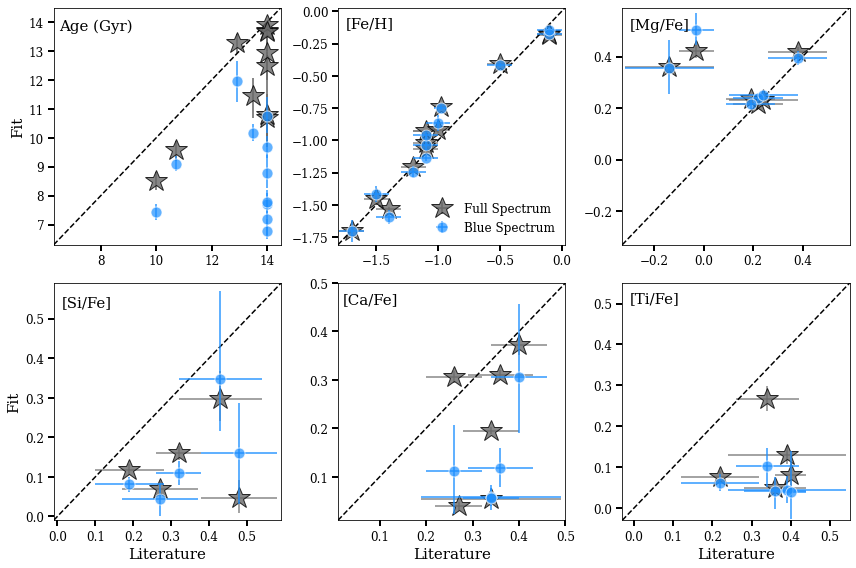

In [54]:
#Literature vs. fit comparison
lit_params = pd.read_csv('GC_literature_values.csv', index_col=0)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))
fig.set_tight_layout(True)
for i in range(len(GC_objects)):
    if i == 0: #Labels for legend only once
        ax[0,1].errorbar(lit_params['FeH'][i], GC_objects[i].fit_params['FeH']['median'], xerr=lit_params['FeH Err'][i], 
               yerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]], 
              linestyle='None', marker='*', markersize=23, color='dimgrey', alpha=0.8, label='Full Spectrum', 
                        mec='k', mew=1, elinewidth=2)
        ax[0,1].errorbar(lit_params['FeH'][i], GC_objects_blue[i].fit_params['FeH']['median'], xerr=lit_params['FeH Err'][i], 
               yerr=[[GC_objects_blue[i].fit_params['FeH']['lo_err']], [GC_objects_blue[i].fit_params['FeH']['hi_err']]], 
              linestyle='None', marker='.', markersize=22, color='dodgerblue', alpha=0.7, label='Blue Spectrum',
                        mec='w', mew=1, elinewidth=2, zorder=3)
    else:
        #Full fit points
        ax[0,0].errorbar(lit_params['Age'][i], 10**GC_objects[i].fit_params['logage']['median'], xerr=None, 
                   yerr=[[np.log(10)*GC_objects[i].fit_params['logage']['lo_err']*10**GC_objects[i].fit_params['logage']['median']],
                         [np.log(10)*GC_objects[i].fit_params['logage']['hi_err']*10**GC_objects[i].fit_params['logage']['median']]], 
                  linestyle='None', marker='*', markersize=23, color='dimgrey', alpha=0.8, mec='k', mew=1, 
                         elinewidth=2)
        ax[0,1].errorbar(lit_params['FeH'][i], GC_objects[i].fit_params['FeH']['median'], xerr=lit_params['FeH Err'][i], 
                   yerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]], 
                  linestyle='None', marker='*', markersize=23, color='dimgrey', alpha=0.8, mec='k', mew=1, 
                         )
        ax[0,2].errorbar(lit_params['MgFe'][i], GC_objects[i].fit_params['MgFe']['median'], xerr=lit_params['MgFe Err'][i], 
                   yerr=[[GC_objects[i].fit_params['MgFe']['lo_err']], [GC_objects[i].fit_params['MgFe']['hi_err']]], 
                  linestyle='None', marker='*', markersize=23, color='dimgrey', alpha=0.8, mec='k', mew=1, 
                         )
        ax[1,0].errorbar(lit_params['SiFe'][i], GC_objects[i].fit_params['SiFe']['median'], xerr=lit_params['SiFe Err'][i], 
                   yerr=[[GC_objects[i].fit_params['SiFe']['lo_err']], [GC_objects[i].fit_params['SiFe']['hi_err']]], 
                  linestyle='None', marker='*', markersize=23, color='dimgrey', alpha=0.8, mec='k', mew=1, 
                         )
        ax[1,1].errorbar(lit_params['CaFe'][i], GC_objects[i].fit_params['CaFe']['median'], xerr=lit_params['CaFe Err'][i], 
                   yerr=[[GC_objects[i].fit_params['CaFe']['lo_err']], [GC_objects[i].fit_params['CaFe']['hi_err']]], 
                  linestyle='None', marker='*', markersize=23, color='dimgrey', alpha=0.8, mec='k', mew=1, 
                         )
        ax[1,2].errorbar(lit_params['TiFe'][i], GC_objects[i].fit_params['TiFe']['median'], xerr=lit_params['TiFe Err'][i], 
                   yerr=[[GC_objects[i].fit_params['TiFe']['lo_err']], [GC_objects[i].fit_params['TiFe']['hi_err']]], 
                  linestyle='None', marker='*', markersize=23, color='dimgrey', alpha=0.8, mec='k', mew=1, 
                         )

        #Blue side points
        ax[0,0].errorbar(lit_params['Age'][i], 10**GC_objects_blue[i].fit_params['logage']['median'], xerr=None, 
               yerr=[[np.log(10)*GC_objects_blue[i].fit_params['logage']['lo_err']*10**GC_objects_blue[i].fit_params['logage']['median']],
                     [np.log(10)*GC_objects_blue[i].fit_params['logage']['hi_err']*10**GC_objects_blue[i].fit_params['logage']['median']]], 
              linestyle='None', marker='.', markersize=22, color='dodgerblue', alpha=0.7, mec='w', mew=1, 
                         elinewidth=2, zorder=3)
        ax[0,1].errorbar(lit_params['FeH'][i], GC_objects_blue[i].fit_params['FeH']['median'], xerr=lit_params['FeH Err'][i], 
                   yerr=[[GC_objects_blue[i].fit_params['FeH']['lo_err']], [GC_objects_blue[i].fit_params['FeH']['hi_err']]], 
                  linestyle='None', marker='.', markersize=22, color='dodgerblue', alpha=0.7, mec='w', mew=1, 
                         elinewidth=2, zorder=3)
        ax[0,2].errorbar(lit_params['MgFe'][i], GC_objects_blue[i].fit_params['MgFe']['median'], xerr=lit_params['MgFe Err'][i], 
                   yerr=[[GC_objects_blue[i].fit_params['MgFe']['lo_err']], [GC_objects_blue[i].fit_params['MgFe']['hi_err']]], 
                  linestyle='None', marker='.', markersize=22, color='dodgerblue', alpha=0.7, mec='w', mew=1, 
                         elinewidth=2, zorder=3)
        ax[1,0].errorbar(lit_params['SiFe'][i], GC_objects_blue[i].fit_params['SiFe']['median'], xerr=lit_params['SiFe Err'][i], 
                   yerr=[[GC_objects_blue[i].fit_params['SiFe']['lo_err']], [GC_objects_blue[i].fit_params['SiFe']['hi_err']]], 
                  linestyle='None', marker='.', markersize=22, color='dodgerblue', alpha=0.7, mec='w', mew=1, 
                         elinewidth=2, zorder=3)
        ax[1,1].errorbar(lit_params['CaFe'][i], GC_objects_blue[i].fit_params['CaFe']['median'], xerr=lit_params['CaFe Err'][i], 
                   yerr=[[GC_objects_blue[i].fit_params['CaFe']['lo_err']], [GC_objects_blue[i].fit_params['CaFe']['hi_err']]], 
                  linestyle='None', marker='.', markersize=22, color='dodgerblue', alpha=0.7, mec='w', mew=1, 
                         elinewidth=2, zorder=3)
        ax[1,2].errorbar(lit_params['TiFe'][i], GC_objects_blue[i].fit_params['TiFe']['median'], xerr=lit_params['TiFe Err'][i], 
                   yerr=[[GC_objects_blue[i].fit_params['TiFe']['lo_err']], [GC_objects_blue[i].fit_params['TiFe']['hi_err']]], 
                  linestyle='None', marker='.', markersize=22, color='dodgerblue', alpha=0.7, mec='w', mew=1, 
                         elinewidth=2, zorder=3)    

ax[0,0].set_xlim(6.3, 14.5)
ax[0,1].set_xlim(-1.81, 0.03)
ax[0,2].set_xlim(-0.33, 0.59)
ax[1,0].set_xlim(-0.01, 0.59)  
ax[1,1].set_xlim(0.01, 0.5)
ax[1,2].set_xlim(-0.03, 0.55)

ax[0,0].set_ylim(6.3, 14.5)
ax[0,1].set_ylim(-1.81, 0.03)
ax[0,2].set_ylim(-0.33, 0.59)
ax[1,0].set_ylim(-0.01, 0.59)  
ax[1,1].set_ylim(0.01, 0.5)
ax[1,2].set_ylim(-0.03, 0.55)

ax[0,0].plot([6.3,14.5], [6.3,14.5], color='k',  linestyle='dashed')
ax[0,1].plot([-1.81, 0.03], [-1.81, 0.03], color='k', linestyle='dashed')
ax[0,2].plot([-0.33, 0.59], [-0.33, 0.59], color='k', linestyle='dashed')
ax[1,0].plot([-0.01, 0.59], [-0.01, 0.59], color='k', linestyle='dashed')
ax[1,1].plot([0.01, 0.5], [0.01, 0.5], color='k', linestyle='dashed')
ax[1,2].plot([-0.03, 0.55], [-0.03, 0.55], color='k',  linestyle='dashed')

ax[0,0].text(6.5, 14.1, 'Age (Gyr)', fontsize=15, ha='left', va='top')
ax[0,1].text(-1.75, -0.04, '[Fe/H]', fontsize=15, ha='left', va='top')
ax[0,2].text(-0.3, 0.55, '[Mg/Fe]', fontsize=15, ha='left', va='top')
ax[1,0].text(0.01, 0.56, '[Si/Fe]', fontsize=15, ha='left', va='top')
ax[1,1].text(0.02, 0.48, '[Ca/Fe]', fontsize=15, ha='left', va='top')
ax[1,2].text(-0.01, 0.53, '[Ti/Fe]', fontsize=15, ha='left', va='top')

ax[0,1].legend(fontsize=12, loc=4, framealpha=0)
ax[0,0].set_ylabel('Fit', fontsize=15)
ax[1,0].set_ylabel('Fit', fontsize=15)
ax[1,0].set_xlabel('Literature', fontsize=15)
ax[1,1].set_xlabel('Literature', fontsize=15)
ax[1,2].set_xlabel('Literature', fontsize=15)

ax[0,0].tick_params(length=6, width=2, labelsize=12)
ax[0,1].tick_params(length=6, width=2, labelsize=12)
ax[0,2].tick_params(length=6, width=2, labelsize=12)
ax[1,0].tick_params(length=6, width=2, labelsize=12)
ax[1,1].tick_params(length=6, width=2, labelsize=12)
ax[1,2].tick_params(length=6, width=2, labelsize=12)
plt.savefig('paper_lit_fit_compare.pdf', bbox_inches='tight')
#plt.savefig('paper_lit_fit_compare.png', bbox_inches='tight')

# Literature parameter plot (main result)

In [55]:
#Get radii of ETG measurements
NGC1407_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC1407_b_aper.lis', sep='\t|\s+')
NGC1600_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC1600_b_aper.lis', sep='\t|\s+')
NGC2695_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC2695_b_aper.lis', sep='\t|\s+')
NGC3414_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC3414_b_aper.lis', sep='\t|\s+')
NGC4552_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC4552_b_aper.lis', sep='\t|\s+')
NGC4564_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC4564_b_aper.lis', sep='\t|\s+')

from astropy.cosmology import LambdaCDM
def physical_size(z, r):
    cosmo = LambdaCDM(H0=67.7, Om0=0.307, Ode0=0.693)
    d_A = cosmo.angular_diameter_distance(z)
    angular_size = r*u.arcsec
    physical_size = (angular_size * d_A).to(u.kpc, u.dimensionless_angles())
    return physical_size

#Calculate Re
NGC1407_Re = physical_size(0.005952, 1.26*60)
NGC1600_Re = physical_size(0.015824, 1.12*60)
NGC2695_Re = physical_size(0.006114, 0.42*60)
NGC3414_Re = physical_size(0.004879, 0.49*60)
NGC4552_Re = physical_size(0.000914, 0.52*60)
NGC4564_Re = physical_size(0.003779, 0.24*60)

#Negative radii = opposite direction
NGC1407_sizes = np.abs(physical_size(0.005952, NGC1407_radii['arcsec_mean'].to_numpy()))/NGC1407_Re
NGC1600_sizes = np.abs(physical_size(0.015824, NGC1600_radii['arcsec_mean'].to_numpy()))/NGC1600_Re
NGC2695_sizes = np.abs(physical_size(0.006114, NGC2695_radii['arcsec_mean'].to_numpy()))/NGC2695_Re
NGC3414_sizes = np.abs(physical_size(0.004879, NGC3414_radii['arcsec_mean'].to_numpy()))/NGC3414_Re
NGC4552_sizes = np.abs(physical_size(0.000914, NGC4552_radii['arcsec_mean'].to_numpy()))/NGC4552_Re
NGC4564_sizes = np.abs(physical_size(0.003779, NGC4564_radii['arcsec_mean'].to_numpy()))/NGC4564_Re

#Add to dataframes
NGC1407_radii['size'] = NGC1407_sizes
NGC1600_radii['size'] = NGC1600_sizes
NGC2695_radii['size'] = NGC2695_sizes
NGC3414_radii['size'] = NGC3414_sizes
NGC4552_radii['size'] = NGC4552_sizes
NGC4564_radii['size'] = NGC4564_sizes

<ipython-input-55-af252cebfeb1>:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  NGC1407_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC1407_b_aper.lis', sep='\t|\s+')
<ipython-input-55-af252cebfeb1>:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  NGC1600_radii = pd.read_csv('/Users/chloecheng/Documents/Research/IMF/aper/NGC1600_b_aper.lis', sep='\t|\s+')
<ipython-input-55-af252cebfeb1>:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoi

In [56]:
#Re-index sizes
NGC1407_dummy_frame = pd.DataFrame(NGC1407_inds_simple).reset_index()
NGC1407_dummy_frame.columns = ['dummy_idx', 'index']
NGC1407_df = pd.merge(NGC1407_dummy_frame, NGC1407_radii.loc[NGC1407_radii['index'].isin(NGC1407_inds_simple)], on='index')

NGC1600_dummy_frame = pd.DataFrame(NGC1600_inds_simple).reset_index()
NGC1600_dummy_frame.columns = ['dummy_idx', 'index']
NGC1600_df = pd.merge(NGC1600_dummy_frame, NGC1600_radii.loc[NGC1600_radii['index'].isin(NGC1600_inds_simple)], on='index')

NGC2695_dummy_frame = pd.DataFrame(NGC2695_inds_simple).reset_index()
NGC2695_dummy_frame.columns = ['dummy_idx', 'index']
NGC2695_df = pd.merge(NGC2695_dummy_frame, NGC2695_radii.loc[NGC2695_radii['index'].isin(NGC2695_inds_simple)], on='index')

NGC3414_dummy_frame = pd.DataFrame(NGC3414_inds_simple).reset_index()
NGC3414_dummy_frame.columns = ['dummy_idx', 'index']
NGC3414_df = pd.merge(NGC3414_dummy_frame, NGC3414_radii.loc[NGC3414_radii['index'].isin(NGC3414_inds_simple)], on='index')

NGC4552_dummy_frame = pd.DataFrame(NGC4552_inds_simple).reset_index()
NGC4552_dummy_frame.columns = ['dummy_idx', 'index']
NGC4552_df = pd.merge(NGC4552_dummy_frame, NGC4552_radii.loc[NGC4552_radii['index'].isin(NGC4552_inds_simple)], on='index')

NGC4564_dummy_frame = pd.DataFrame(NGC4564_inds_simple).reset_index()
NGC4564_dummy_frame.columns = ['dummy_idx', 'index']
NGC4564_df = pd.merge(NGC4564_dummy_frame, NGC4564_radii.loc[NGC4564_radii['index'].isin(NGC4564_inds_simple)], on='index')

In [57]:
#Put ETG data into lists for ease of scatterplotting
NGC1407_FeH = []
NGC1407_FeH_merr = []
NGC1407_FeH_perr = []
NGC1407_MgFe = []
NGC1407_MgFe_merr = []
NGC1407_MgFe_perr = []
NGC1407_sigma = []
NGC1407_sigma_merr = []
NGC1407_sigma_perr = []
NGC1407_alpha = []
NGC1407_alpha_merr = []
NGC1407_alpha_perr = []
NGC1407_IMF1 = []
NGC1407_IMF1_merr = []
NGC1407_IMF1_perr = []
NGC1407_IMF2 = []
NGC1407_IMF2_merr = []
NGC1407_IMF2_perr = []
for i in range(len(NGC1407_results)):
    NGC1407_FeH.append(NGC1407_results[i].fit_params['FeH']['median'])
    NGC1407_FeH_merr.append(NGC1407_results[i].fit_params['FeH']['lo_err'])
    NGC1407_FeH_perr.append(NGC1407_results[i].fit_params['FeH']['hi_err'])
    NGC1407_MgFe.append(NGC1407_results[i].fit_params['MgFe']['median'])
    NGC1407_MgFe_merr.append(NGC1407_results[i].fit_params['MgFe']['lo_err'])
    NGC1407_MgFe_perr.append(NGC1407_results[i].fit_params['MgFe']['hi_err'])
    NGC1407_sigma.append(NGC1407_results[i].fit_params['sigma']['median'])
    NGC1407_sigma_merr.append(NGC1407_results[i].fit_params['sigma']['lo_err'])
    NGC1407_sigma_perr.append(NGC1407_results[i].fit_params['sigma']['hi_err'])
    NGC1407_alpha.append(NGC1407_results[i].fit_params['alpha']['median'])
    NGC1407_alpha_merr.append(NGC1407_results[i].fit_params['alpha']['lo_err'])
    NGC1407_alpha_perr.append(NGC1407_results[i].fit_params['alpha']['hi_err'])
    NGC1407_IMF1.append(NGC1407_results[i].fit_params['IMF1']['median'])
    NGC1407_IMF1_merr.append(NGC1407_results[i].fit_params['IMF1']['lo_err'])
    NGC1407_IMF1_perr.append(NGC1407_results[i].fit_params['IMF1']['hi_err'])
    NGC1407_IMF2.append(NGC1407_results[i].fit_params['IMF2']['median'])
    NGC1407_IMF2_merr.append(NGC1407_results[i].fit_params['IMF2']['lo_err'])
    NGC1407_IMF2_perr.append(NGC1407_results[i].fit_params['IMF2']['hi_err'])
    
NGC1600_FeH = []
NGC1600_FeH_merr = []
NGC1600_FeH_perr = []
NGC1600_MgFe = []
NGC1600_MgFe_merr = []
NGC1600_MgFe_perr = []
NGC1600_sigma = []
NGC1600_sigma_merr = []
NGC1600_sigma_perr = []
NGC1600_alpha = []
NGC1600_alpha_merr = []
NGC1600_alpha_perr = []
NGC1600_IMF1 = []
NGC1600_IMF1_merr = []
NGC1600_IMF1_perr = []
NGC1600_IMF2 = []
NGC1600_IMF2_merr = []
NGC1600_IMF2_perr = []
for i in range(len(NGC1600_results)):
    NGC1600_FeH.append(NGC1600_results[i].fit_params['FeH']['median'])
    NGC1600_FeH_merr.append(NGC1600_results[i].fit_params['FeH']['lo_err'])
    NGC1600_FeH_perr.append(NGC1600_results[i].fit_params['FeH']['hi_err'])
    NGC1600_MgFe.append(NGC1600_results[i].fit_params['MgFe']['median'])
    NGC1600_MgFe_merr.append(NGC1600_results[i].fit_params['MgFe']['lo_err'])
    NGC1600_MgFe_perr.append(NGC1600_results[i].fit_params['MgFe']['hi_err'])
    NGC1600_sigma.append(NGC1600_results[i].fit_params['sigma']['median'])
    NGC1600_sigma_merr.append(NGC1600_results[i].fit_params['sigma']['lo_err'])
    NGC1600_sigma_perr.append(NGC1600_results[i].fit_params['sigma']['hi_err'])
    NGC1600_alpha.append(NGC1600_results[i].fit_params['alpha']['median'])
    NGC1600_alpha_merr.append(NGC1600_results[i].fit_params['alpha']['lo_err'])
    NGC1600_alpha_perr.append(NGC1600_results[i].fit_params['alpha']['hi_err'])
    NGC1600_IMF1.append(NGC1600_results[i].fit_params['IMF1']['median'])
    NGC1600_IMF1_merr.append(NGC1600_results[i].fit_params['IMF1']['lo_err'])
    NGC1600_IMF1_perr.append(NGC1600_results[i].fit_params['IMF1']['hi_err'])
    NGC1600_IMF2.append(NGC1600_results[i].fit_params['IMF2']['median'])
    NGC1600_IMF2_merr.append(NGC1600_results[i].fit_params['IMF2']['lo_err'])
    NGC1600_IMF2_perr.append(NGC1600_results[i].fit_params['IMF2']['hi_err'])
    
NGC2695_FeH = []
NGC2695_FeH_merr = []
NGC2695_FeH_perr = []
NGC2695_MgFe = []
NGC2695_MgFe_merr = []
NGC2695_MgFe_perr = []
NGC2695_sigma = []
NGC2695_sigma_merr = []
NGC2695_sigma_perr = []
NGC2695_alpha = []
NGC2695_alpha_merr = []
NGC2695_alpha_perr = []
NGC2695_IMF1 = []
NGC2695_IMF1_merr = []
NGC2695_IMF1_perr = []
NGC2695_IMF2 = []
NGC2695_IMF2_merr = []
NGC2695_IMF2_perr = []
for i in range(len(NGC2695_results)):
    NGC2695_FeH.append(NGC2695_results[i].fit_params['FeH']['median'])
    NGC2695_FeH_merr.append(NGC2695_results[i].fit_params['FeH']['lo_err'])
    NGC2695_FeH_perr.append(NGC2695_results[i].fit_params['FeH']['hi_err'])
    NGC2695_MgFe.append(NGC2695_results[i].fit_params['MgFe']['median'])
    NGC2695_MgFe_merr.append(NGC2695_results[i].fit_params['MgFe']['lo_err'])
    NGC2695_MgFe_perr.append(NGC2695_results[i].fit_params['MgFe']['hi_err'])
    NGC2695_sigma.append(NGC2695_results[i].fit_params['sigma']['median'])
    NGC2695_sigma_merr.append(NGC2695_results[i].fit_params['sigma']['lo_err'])
    NGC2695_sigma_perr.append(NGC2695_results[i].fit_params['sigma']['hi_err'])
    NGC2695_alpha.append(NGC2695_results[i].fit_params['alpha']['median'])
    NGC2695_alpha_merr.append(NGC2695_results[i].fit_params['alpha']['lo_err'])
    NGC2695_alpha_perr.append(NGC2695_results[i].fit_params['alpha']['hi_err'])
    NGC2695_IMF1.append(NGC2695_results[i].fit_params['IMF1']['median'])
    NGC2695_IMF1_merr.append(NGC2695_results[i].fit_params['IMF1']['lo_err'])
    NGC2695_IMF1_perr.append(NGC2695_results[i].fit_params['IMF1']['hi_err'])
    NGC2695_IMF2.append(NGC2695_results[i].fit_params['IMF2']['median'])
    NGC2695_IMF2_merr.append(NGC2695_results[i].fit_params['IMF2']['lo_err'])
    NGC2695_IMF2_perr.append(NGC2695_results[i].fit_params['IMF2']['hi_err'])
    
NGC3414_FeH = []
NGC3414_FeH_merr = []
NGC3414_FeH_perr = []
NGC3414_MgFe = []
NGC3414_MgFe_merr = []
NGC3414_MgFe_perr = []
NGC3414_sigma = []
NGC3414_sigma_merr = []
NGC3414_sigma_perr = []
NGC3414_alpha = []
NGC3414_alpha_merr = []
NGC3414_alpha_perr = []
NGC3414_IMF1 = []
NGC3414_IMF1_merr = []
NGC3414_IMF1_perr = []
NGC3414_IMF2 = []
NGC3414_IMF2_merr = []
NGC3414_IMF2_perr = []
for i in range(len(NGC3414_results)):
    NGC3414_FeH.append(NGC3414_results[i].fit_params['FeH']['median'])
    NGC3414_FeH_merr.append(NGC3414_results[i].fit_params['FeH']['lo_err'])
    NGC3414_FeH_perr.append(NGC3414_results[i].fit_params['FeH']['hi_err'])
    NGC3414_MgFe.append(NGC3414_results[i].fit_params['MgFe']['median'])
    NGC3414_MgFe_merr.append(NGC3414_results[i].fit_params['MgFe']['lo_err'])
    NGC3414_MgFe_perr.append(NGC3414_results[i].fit_params['MgFe']['hi_err'])
    NGC3414_sigma.append(NGC3414_results[i].fit_params['sigma']['median'])
    NGC3414_sigma_merr.append(NGC3414_results[i].fit_params['sigma']['lo_err'])
    NGC3414_sigma_perr.append(NGC3414_results[i].fit_params['sigma']['hi_err'])
    NGC3414_alpha.append(NGC3414_results[i].fit_params['alpha']['median'])
    NGC3414_alpha_merr.append(NGC3414_results[i].fit_params['alpha']['lo_err'])
    NGC3414_alpha_perr.append(NGC3414_results[i].fit_params['alpha']['hi_err'])
    NGC3414_IMF1.append(NGC3414_results[i].fit_params['IMF1']['median'])
    NGC3414_IMF1_merr.append(NGC3414_results[i].fit_params['IMF1']['lo_err'])
    NGC3414_IMF1_perr.append(NGC3414_results[i].fit_params['IMF1']['hi_err'])
    NGC3414_IMF2.append(NGC3414_results[i].fit_params['IMF2']['median'])
    NGC3414_IMF2_merr.append(NGC3414_results[i].fit_params['IMF2']['lo_err'])
    NGC3414_IMF2_perr.append(NGC3414_results[i].fit_params['IMF2']['hi_err'])
    
NGC4552_FeH = []
NGC4552_FeH_merr = []
NGC4552_FeH_perr = []
NGC4552_MgFe = []
NGC4552_MgFe_merr = []
NGC4552_MgFe_perr = []
NGC4552_sigma = []
NGC4552_sigma_merr = []
NGC4552_sigma_perr = []
NGC4552_alpha = []
NGC4552_alpha_merr = []
NGC4552_alpha_perr = []
NGC4552_IMF1 = []
NGC4552_IMF1_merr = []
NGC4552_IMF1_perr = []
NGC4552_IMF2 = []
NGC4552_IMF2_merr = []
NGC4552_IMF2_perr = []
for i in range(len(NGC4552_results)):
    NGC4552_FeH.append(NGC4552_results[i].fit_params['FeH']['median'])
    NGC4552_FeH_merr.append(NGC4552_results[i].fit_params['FeH']['lo_err'])
    NGC4552_FeH_perr.append(NGC4552_results[i].fit_params['FeH']['hi_err'])
    NGC4552_MgFe.append(NGC4552_results[i].fit_params['MgFe']['median'])
    NGC4552_MgFe_merr.append(NGC4552_results[i].fit_params['MgFe']['lo_err'])
    NGC4552_MgFe_perr.append(NGC4552_results[i].fit_params['MgFe']['hi_err'])
    NGC4552_sigma.append(NGC4552_results[i].fit_params['sigma']['median'])
    NGC4552_sigma_merr.append(NGC4552_results[i].fit_params['sigma']['lo_err'])
    NGC4552_sigma_perr.append(NGC4552_results[i].fit_params['sigma']['hi_err'])
    NGC4552_alpha.append(NGC4552_results[i].fit_params['alpha']['median'])
    NGC4552_alpha_merr.append(NGC4552_results[i].fit_params['alpha']['lo_err'])
    NGC4552_alpha_perr.append(NGC4552_results[i].fit_params['alpha']['hi_err'])
    NGC4552_IMF1.append(NGC4552_results[i].fit_params['IMF1']['median'])
    NGC4552_IMF1_merr.append(NGC4552_results[i].fit_params['IMF1']['lo_err'])
    NGC4552_IMF1_perr.append(NGC4552_results[i].fit_params['IMF1']['hi_err'])
    NGC4552_IMF2.append(NGC4552_results[i].fit_params['IMF2']['median'])
    NGC4552_IMF2_merr.append(NGC4552_results[i].fit_params['IMF2']['lo_err'])
    NGC4552_IMF2_perr.append(NGC4552_results[i].fit_params['IMF2']['hi_err'])
    
NGC4564_FeH = []
NGC4564_FeH_merr = []
NGC4564_FeH_perr = []
NGC4564_MgFe = []
NGC4564_MgFe_merr = []
NGC4564_MgFe_perr = []
NGC4564_sigma = []
NGC4564_sigma_merr = []
NGC4564_sigma_perr = []
NGC4564_alpha = []
NGC4564_alpha_merr = []
NGC4564_alpha_perr = []
NGC4564_IMF1 = []
NGC4564_IMF1_merr = []
NGC4564_IMF1_perr = []
NGC4564_IMF2 = []
NGC4564_IMF2_merr = []
NGC4564_IMF2_perr = []
for i in range(len(NGC4564_results)):
    NGC4564_FeH.append(NGC4564_results[i].fit_params['FeH']['median'])
    NGC4564_FeH_merr.append(NGC4564_results[i].fit_params['FeH']['lo_err'])
    NGC4564_FeH_perr.append(NGC4564_results[i].fit_params['FeH']['hi_err'])
    NGC4564_MgFe.append(NGC4564_results[i].fit_params['MgFe']['median'])
    NGC4564_MgFe_merr.append(NGC4564_results[i].fit_params['MgFe']['lo_err'])
    NGC4564_MgFe_perr.append(NGC4564_results[i].fit_params['MgFe']['hi_err'])
    NGC4564_sigma.append(NGC4564_results[i].fit_params['sigma']['median'])
    NGC4564_sigma_merr.append(NGC4564_results[i].fit_params['sigma']['lo_err'])
    NGC4564_sigma_perr.append(NGC4564_results[i].fit_params['sigma']['hi_err'])
    NGC4564_alpha.append(NGC4564_results[i].fit_params['alpha']['median'])
    NGC4564_alpha_merr.append(NGC4564_results[i].fit_params['alpha']['lo_err'])
    NGC4564_alpha_perr.append(NGC4564_results[i].fit_params['alpha']['hi_err'])
    NGC4564_IMF1.append(NGC1407_results[i].fit_params['IMF1']['median'])
    NGC4564_IMF1_merr.append(NGC1407_results[i].fit_params['IMF1']['lo_err'])
    NGC4564_IMF1_perr.append(NGC1407_results[i].fit_params['IMF1']['hi_err'])
    NGC4564_IMF2.append(NGC1407_results[i].fit_params['IMF2']['median'])
    NGC4564_IMF2_merr.append(NGC1407_results[i].fit_params['IMF2']['lo_err'])
    NGC4564_IMF2_perr.append(NGC1407_results[i].fit_params['IMF2']['hi_err'])

In [58]:
#Concatenate all ETG data
all_etg_sizes = np.concatenate((NGC1407_df['size'], NGC1600_df['size'], NGC2695_df['size'], NGC3414_df['size'], 
                                NGC4552_df['size'], NGC4564_df['size']))

all_etg_FeH = np.concatenate((NGC1407_FeH, NGC1600_FeH, NGC2695_FeH, NGC3414_FeH, NGC4552_FeH, NGC4564_FeH))
all_etg_FeH_merr = np.concatenate((NGC1407_FeH_merr, NGC1600_FeH_merr, NGC2695_FeH_merr, NGC3414_FeH_merr, NGC4552_FeH_merr, 
                                   NGC4564_FeH_merr))
all_etg_FeH_perr = np.concatenate((NGC1407_FeH_perr, NGC1600_FeH_perr, NGC2695_FeH_perr, NGC3414_FeH_perr, NGC4552_FeH_perr, 
                                   NGC4564_FeH_perr))

all_etg_MgFe = np.concatenate((NGC1407_MgFe, NGC1600_MgFe, NGC2695_MgFe, NGC3414_MgFe, NGC4552_MgFe, NGC4564_MgFe))
all_etg_MgFe_merr = np.concatenate((NGC1407_MgFe_merr, NGC1600_MgFe_merr, NGC2695_MgFe_merr, NGC3414_MgFe_merr, NGC4552_MgFe_merr, 
                                   NGC4564_MgFe_merr))
all_etg_MgFe_perr = np.concatenate((NGC1407_MgFe_perr, NGC1600_MgFe_perr, NGC2695_MgFe_perr, NGC3414_MgFe_perr, NGC4552_MgFe_perr, 
                                   NGC4564_MgFe_perr))

all_etg_sigma = np.concatenate((NGC1407_sigma, NGC1600_sigma, NGC2695_sigma, NGC3414_sigma, NGC4552_sigma, NGC4564_sigma))
all_etg_sigma_merr = np.concatenate((NGC1407_sigma_merr, NGC1600_sigma_merr, NGC2695_sigma_merr, NGC3414_sigma_merr, NGC4552_sigma_merr, 
                                   NGC4564_sigma_merr))
all_etg_sigma_perr = np.concatenate((NGC1407_sigma_perr, NGC1600_sigma_perr, NGC2695_sigma_perr, NGC3414_sigma_perr, NGC4552_sigma_perr, 
                                   NGC4564_sigma_perr))

all_etg_alpha = np.concatenate((NGC1407_alpha, NGC1600_alpha, NGC2695_alpha, NGC3414_alpha, NGC4552_alpha, NGC4564_alpha))
all_etg_alpha_merr = np.concatenate((NGC1407_alpha_merr, NGC1600_alpha_merr, NGC2695_alpha_merr, NGC3414_alpha_merr, NGC4552_alpha_merr, 
                                   NGC4564_alpha_merr))
all_etg_alpha_perr = np.concatenate((NGC1407_alpha_perr, NGC1600_alpha_perr, NGC2695_alpha_perr, NGC3414_alpha_perr, NGC4552_alpha_perr, 
                                   NGC4564_alpha_perr))

all_etg_IMF1 = np.concatenate((NGC1407_IMF1, NGC1600_IMF1, NGC2695_IMF1, NGC3414_IMF1, NGC4552_IMF1, NGC4564_IMF1))
all_etg_IMF1_merr = np.concatenate((NGC1407_IMF1_merr, NGC1600_IMF1_merr, NGC2695_IMF1_merr, NGC3414_IMF1_merr, NGC4552_IMF1_merr, 
                                   NGC4564_IMF1_merr))
all_etg_IMF1_perr = np.concatenate((NGC1407_IMF1_perr, NGC1600_IMF1_perr, NGC2695_IMF1_perr, NGC3414_IMF1_perr, NGC4552_IMF1_perr, 
                                   NGC4564_IMF1_perr))

all_etg_IMF2 = np.concatenate((NGC1407_IMF2, NGC1600_IMF2, NGC2695_IMF2, NGC3414_IMF2, NGC4552_IMF2, NGC4564_IMF2))
all_etg_IMF2_merr = np.concatenate((NGC1407_IMF2_merr, NGC1600_IMF2_merr, NGC2695_IMF2_merr, NGC3414_IMF2_merr, NGC4552_IMF2_merr, 
                                   NGC4564_IMF2_merr))
all_etg_IMF2_perr = np.concatenate((NGC1407_IMF2_perr, NGC1600_IMF2_perr, NGC2695_IMF2_perr, NGC3414_IMF2_perr, NGC4552_IMF2_perr, 
                                   NGC4564_IMF2_perr))

<ipython-input-59-d348ec1b5edc>:245: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig('paper_fig3.pdf', bbox_inches='tight')
<ipython-input-59-d348ec1b5edc>:245: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig('paper_fig3.pdf', bbox_inches='tight')
/Applications/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


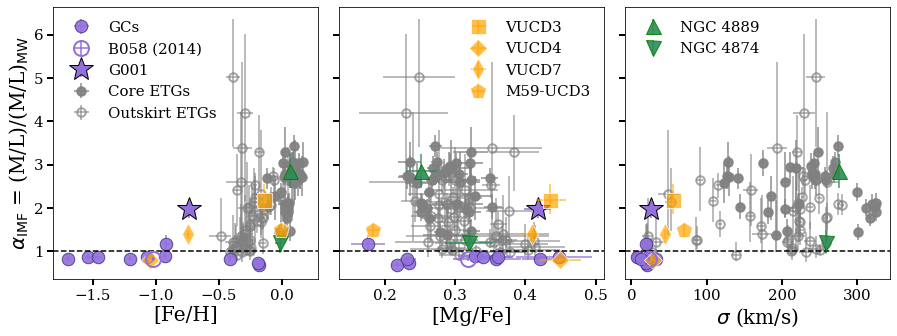

In [59]:
#Main result figure (currently Figure 11)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=True, gridspec_kw={'wspace': 0.08})
fig.set_tight_layout(True)

#Plot GCs
for i in range(len(GC_objects)):
    if i == GC_obj_names.index('G001'):
        ax[0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['alpha']['median'], 
                   xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                  yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                  linestyle='None', marker='*', markersize=25, color='mediumpurple', label=GC_obj_names[i],
                      mec='k', mew=1, zorder=0)
        ax[1].errorbar(GC_objects[i].fit_params['MgFe']['median'], GC_objects[i].fit_params['alpha']['median'], 
                       xerr=[[GC_objects[i].fit_params['MgFe']['lo_err']], [GC_objects[i].fit_params['MgFe']['hi_err']]],
                      yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                      linestyle='None', marker='*', markersize=25, color='mediumpurple', mec='k', mew=1, zorder=0)
        ax[2].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['alpha']['median'], 
                       yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                       linestyle='None', marker='*', markersize=25, color='mediumpurple', mec='k', mew=1, zorder=0)
    elif i == GC_obj_names.index('Old B058'):
        ax[0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['alpha']['median'], 
                   xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                  yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                  linestyle='None', marker='.', markersize=30, color='mediumpurple', label='B058 (2014)', 
                       mfc='None', mew=2, zorder=10)
        ax[1].errorbar(GC_objects[i].fit_params['MgFe']['median'], GC_objects[i].fit_params['alpha']['median'], 
                       xerr=[[GC_objects[i].fit_params['MgFe']['lo_err']], [GC_objects[i].fit_params['MgFe']['hi_err']]],
                      yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                      linestyle='None', marker='.', markersize=30, color='mediumpurple', mfc='None', mew=2, zorder=10)
        ax[2].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['alpha']['median'], 
                       yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                       linestyle='None', marker='.', markersize=30, color='mediumpurple', mfc='None', mew=2, zorder=10)
    elif i == 0:
        ax[0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['alpha']['median'], 
                   xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                  yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                  linestyle='None', marker='.', markersize=25, color='mediumpurple', label='GCs', 
                       mec='darkslateblue', mew=1, alpha=0.9, zorder=0)
        ax[1].errorbar(GC_objects[i].fit_params['MgFe']['median'], GC_objects[i].fit_params['alpha']['median'], 
                       xerr=[[GC_objects[i].fit_params['MgFe']['lo_err']], [GC_objects[i].fit_params['MgFe']['hi_err']]],
                      yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                      linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1,
                      alpha=0.9, zorder=0)
        ax[2].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['alpha']['median'], 
                       yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1,
                      alpha=0.9, zorder=0)
    else:
        ax[0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['alpha']['median'], 
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                      yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                      linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1,
                      alpha=0.9, zorder=0)
        ax[1].errorbar(GC_objects[i].fit_params['MgFe']['median'], GC_objects[i].fit_params['alpha']['median'], 
                       xerr=[[GC_objects[i].fit_params['MgFe']['lo_err']], [GC_objects[i].fit_params['MgFe']['hi_err']]],
                      yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                      linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1,
                      alpha=0.9, zorder=0)
        ax[2].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['alpha']['median'], 
                       yerr=[[GC_objects[i].fit_params['alpha']['lo_err']], [GC_objects[i].fit_params['alpha']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1,
                      alpha=0.9, zorder=0)
        
#UCDs
for i in range(len(UCD_objects)):
    if i == UCD_obj_names.index('VUCD3'):
        ax[0].errorbar(UCD_objects[i].fit_params['FeH']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], 
                             [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='s', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1].errorbar(UCD_objects[i].fit_params['MgFe']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['MgFe']['lo_err']], 
                             [UCD_objects[i].fit_params['MgFe']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='s', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, label='VUCD3')
        ax[2].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['alpha']['median'], 
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='s', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
    elif i == UCD_obj_names.index('VUCD4'):
        ax[0].errorbar(UCD_objects[i].fit_params['FeH']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], 
                             [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='D', markersize=13, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1].errorbar(UCD_objects[i].fit_params['MgFe']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['MgFe']['lo_err']], 
                             [UCD_objects[i].fit_params['MgFe']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='D', markersize=13, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, label='VUCD4')
        ax[2].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['alpha']['median'], 
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='D', markersize=13, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
    elif i == UCD_obj_names.index('VUCD7'):
        ax[0].errorbar(UCD_objects[i].fit_params['FeH']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], 
                             [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='d', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1].errorbar(UCD_objects[i].fit_params['MgFe']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['MgFe']['lo_err']], 
                             [UCD_objects[i].fit_params['MgFe']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='d', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, label='VUCD7')
        ax[2].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['alpha']['median'], 
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='d', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
    elif i == UCD_obj_names.index('M59-UCD3'):
        ax[0].errorbar(UCD_objects[i].fit_params['FeH']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], 
                             [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='p', markersize=17, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1].errorbar(UCD_objects[i].fit_params['MgFe']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['MgFe']['lo_err']], 
                             [UCD_objects[i].fit_params['MgFe']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='p', markersize=17, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, label='M59-UCD3')
        ax[2].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['alpha']['median'], 
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='p', markersize=17, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
    #BCGs
    elif i == UCD_obj_names.index('NGC4889'):
        ax[0].errorbar(UCD_objects[i].fit_params['FeH']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], 
                             [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='^', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[1].errorbar(UCD_objects[i].fit_params['MgFe']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['MgFe']['lo_err']], 
                             [UCD_objects[i].fit_params['MgFe']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='^', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[2].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['alpha']['median'], 
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='^', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2, label='NGC 4889')
    elif i == UCD_obj_names.index('NGC4874'):
        ax[0].errorbar(UCD_objects[i].fit_params['FeH']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], 
                             [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='v', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[1].errorbar(UCD_objects[i].fit_params['MgFe']['median'], 
                       UCD_objects[i].fit_params['alpha']['median'], 
                       xerr=[[UCD_objects[i].fit_params['MgFe']['lo_err']], 
                             [UCD_objects[i].fit_params['MgFe']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='v', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[2].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['alpha']['median'], 
                       yerr=[[UCD_objects[i].fit_params['alpha']['lo_err']], 
                             [UCD_objects[i].fit_params['alpha']['hi_err']]], linestyle='None', 
                       marker='v', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2, label='NGC 4874')

#ETGs
if_catch_1 = 0
if_catch_2 = 0
for i in range(len(all_etg_alpha)):
    if all_etg_sizes[i] <= 0.1: #Re fraction of BCGs
        if if_catch_1 == 0:
            ax[0].errorbar(all_etg_FeH[i], all_etg_alpha[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, label='Core ETGs')
            ax[1].errorbar(all_etg_MgFe[i], all_etg_alpha[i], xerr=[[all_etg_MgFe_merr[i]], [all_etg_MgFe_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[2].errorbar(all_etg_sigma[i], all_etg_alpha[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            if_catch_1 += 1
        else:
            ax[0].errorbar(all_etg_FeH[i], all_etg_alpha[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                       yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                       color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[1].errorbar(all_etg_MgFe[i], all_etg_alpha[i], xerr=[[all_etg_MgFe_merr[i]], [all_etg_MgFe_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[2].errorbar(all_etg_sigma[i], all_etg_alpha[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            
    else:
        if if_catch_2 == 0:
            ax[0].errorbar(all_etg_FeH[i], all_etg_alpha[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mfc='None', mew=2, zorder=-1, alpha=0.7, label='Outskirt ETGs')
            ax[1].errorbar(all_etg_MgFe[i], all_etg_alpha[i], xerr=[[all_etg_MgFe_merr[i]], [all_etg_MgFe_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mfc='None', mew=2, zorder=-1, alpha=0.7)
            ax[2].errorbar(all_etg_sigma[i], all_etg_alpha[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mfc='None', mew=2, zorder=-1, alpha=0.7)
            if_catch_2 += 1
        else:
            ax[0].errorbar(all_etg_FeH[i], all_etg_alpha[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mfc='None', mew=2, zorder=-1, alpha=0.7)
            ax[1].errorbar(all_etg_MgFe[i], all_etg_alpha[i], xerr=[[all_etg_MgFe_merr[i]], [all_etg_MgFe_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mfc='None', mew=2, zorder=-1, alpha=0.7)
            ax[2].errorbar(all_etg_sigma[i], all_etg_alpha[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_alpha_merr[i]], [all_etg_alpha_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mfc='None', mew=2, zorder=-1, alpha=0.7)
        

        
for i in range(len(ax)):
    ax[i].axhline(1, linestyle='dashed', color='k')
    ax[i].tick_params(length=6, width=2, labelsize=15)

ax[0].set_xlabel('[Fe/H]', fontsize=20)
ax[0].set_ylabel(r'$\alpha_{\mathrm{IMF}}$ = (M/L)/(M/L)$_{\mathrm{MW}}$', fontsize=20)
ax[0].legend(fontsize=15, framealpha=0, frameon=False)
ax[1].set_xlabel('[Mg/Fe]', fontsize=20)
ax[2].set_xlabel('$\sigma$ (km/s)', fontsize=20)
ax[1].legend(fontsize=15, frameon=False, framealpha=0)
ax[2].legend(fontsize=15, frameon=False, framealpha=0, loc=2)
plt.savefig('paper_fig3.pdf', bbox_inches='tight')

# Metallicity-dependence comparisons

<ipython-input-60-fd59c04f7278>:328: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig('paper_metallicity_trends.pdf', bbox_inches='tight')
<ipython-input-60-fd59c04f7278>:328: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig('paper_metallicity_trends.pdf', bbox_inches='tight')
/Applications/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


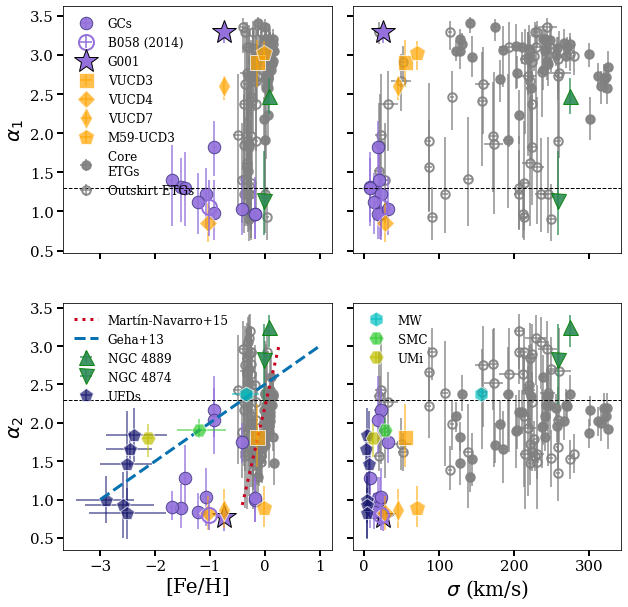

In [60]:
#Results from Gennaro+2018
UFD_obj_names = ['Boo I', 'CVn II', 'Com Ber', 'Hercules', 'Leo IV', 'UMa I']
UFD_imfs = np.abs(np.array((-1.84, -1.00, -1.66, -0.93, -0.82, -1.46))) #uniform average
UFD_imf_68CI = np.abs(np.array((-2.19, -1.31, -1.89, -1.36, -1.15, -2.15))) #68% CI
UFD_imf_errs = np.abs(UFD_imfs - UFD_imf_68CI) #I think this should be right?

#The following parameters and errors are estimated from Fig. 5 (they don't have MgFe)
#FeH
UFD_FeH = np.array([-2.38, -2.90, -2.45, -2.59, -2.51, -2.52]) #In Gennaro+2018, calculated from MDFs in Brown+2014
UFD_FeH_perr_CI = np.array([-1.79, -2.38, -2.05, -2.02, -1.80, -2.05])
UFD_FeH_merr_CI = np.array([-2.90, -3.45, -2.89, -3.28, -3.20, -3.00])
UFD_FeH_perr = np.abs(UFD_FeH - UFD_FeH_perr_CI)
UFD_FeH_merr = UFD_FeH - UFD_FeH_merr_CI

#sigma
UFD_sigma = np.array([4.3, 3.85, 2.3, 3.7, 3.5, 7.2])
UFD_sigma_perr_CI = np.array([5.1, 4.4, 2.95, 4.3, 4.4, 8.6])
UFD_sigma_merr_CI = np.array([3.8, 2.9, 1.8, 2.75, 2.2, 5.95])
UFD_sigma_perr = np.abs(UFD_sigma - UFD_sigma_perr_CI)
UFD_sigma_merr = UFD_sigma - UFD_sigma_merr_CI

#Other objects in Fig. 5 Geha+2013
other_names = ['MW', 'SMC', 'UMi', 'ETGs']
other_imfs = [2.38, 1.9, 1.8, 3.2]
other_imfs_merrs = [0.05, 0.1, 0.25, 0.5]
other_imfs_perrs = [0.05, 0.15, 0.18, 0.5]
other_feh = [-0.35, -1.2, -2.13, -0.01]
other_feh_merr = [0.25, 0.4, 0.1, 0]
other_feh_perr = [0.25, 0.5, 0.1, 0]
other_sigma = [220/np.sqrt(2), 27.6, 11.5, 200]
other_sigma_merr = [0, 0.5, 0.6, 0]
other_sigma_perr = [0, 0.5, 0.6, 0]

#Linear relationships (Geha one is Kroupa plus zero-point shift)
MN_feh = np.linspace(-0.41, 0.27, 100)
MN_imf = np.linspace(0.46, 3.4, 100)
MN_linear_fit = 2.2 + 3.1*MN_feh

Geha_feh = np.linspace(-3, 1, 100)
Geha_imf = np.linspace(0, 4, 100)
Geha_linear_fit = 2.5 + 0.5*Geha_feh

#Plot
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), sharex='col', sharey='row', gridspec_kw={'wspace': 0.08})
fig.set_tight_layout(True)

for i in range(len(GC_objects)):
    if i == GC_obj_names.index('G001'):
        ax[0,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF1']['median'],
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='*', markersize=25, color='mediumpurple', mec='k', mew=1, zorder=0, 
                         label='G001')
        ax[0,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='*', markersize=25, color='mediumpurple', mec='k', mew=1, zorder=0)
        ax[1,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF2']['median'],
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='*', markersize=25, color='mediumpurple', mec='k', mew=1, zorder=0)
        ax[1,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='*', markersize=25, color='mediumpurple', mec='k', mew=1, zorder=0)
    elif i == GC_obj_names.index('Old B058'):
        ax[0,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF1']['median'],
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='.', markersize=30, color='mediumpurple', mfc='None', mew=2, zorder=10, 
                         label='B058 (2014)')
        ax[0,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='.', markersize=30, color='mediumpurple', mfc='None', mew=2, zorder=10)
        ax[1,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF2']['median'],
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='.', markersize=30, color='mediumpurple', mfc='None', mew=2, zorder=10)
        ax[1,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='.', markersize=30, color='mediumpurple', mfc='None', mew=2, zorder=10)
    elif i == 0:
        ax[0,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF1']['median'],
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1, 
                         alpha=0.9, zorder=0, label='GCs')
        ax[0,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1, 
                       alpha=0.9, zorder=0)
        ax[1,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF2']['median'],
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1, 
                         alpha=0.9, zorder=0)
        ax[1,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1, 
                       alpha=0.9, zorder=0)
    else:
        ax[0,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF1']['median'], 
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1, 
                       alpha=0.9, zorder=0)
        ax[0,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF1']['median'],
                       yerr=[[GC_objects[i].fit_params['IMF1']['lo_err']], [GC_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1,
                       alpha=0.9, zorder=0)
        ax[1,0].errorbar(GC_objects[i].fit_params['FeH']['median'], GC_objects[i].fit_params['IMF2']['median'], 
                       xerr=[[GC_objects[i].fit_params['FeH']['lo_err']], [GC_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1, 
                       alpha=0.9, zorder=0)
        ax[1,1].errorbar(GC_vel_disps[i], GC_objects[i].fit_params['IMF2']['median'],
                       yerr=[[GC_objects[i].fit_params['IMF2']['lo_err']], [GC_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='.', markersize=25, color='mediumpurple', mec='darkslateblue', mew=1,
                       alpha=0.9, zorder=0)

for i in range(len(UCD_objects)):
    if i == UCD_obj_names.index('VUCD3'):
        ax[0,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF1']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='s', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, 
                       label='VUCD3')
        ax[0,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='s', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF2']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='s', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='s', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
    elif i == UCD_obj_names.index('VUCD4'):
        ax[0,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF1']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='D', markersize=13, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, 
                       label='VUCD4')
        ax[0,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='D', markersize=13, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF2']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='D', markersize=13, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='D', markersize=13, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
    elif i == UCD_obj_names.index('VUCD7'):
        ax[0,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF1']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='d', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, 
                       label='VUCD7')
        ax[0,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='d', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF2']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='d', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='d', markersize=15, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
    elif i == UCD_obj_names.index('M59-UCD3'):
        ax[0,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF1']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='p', markersize=17, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, 
                       label='M59-UCD3')
        ax[0,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='p', markersize=17, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF2']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='p', markersize=17, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='p', markersize=17, color='orange', alpha=0.7, mec='w', mew=1, zorder=2)
       
    #BCGs
    elif i == UCD_obj_names.index('NGC4889'):
        ax[0,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF1']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='^', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[0,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='^', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[1,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF2']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='^', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2, 
                       label='NGC 4889')
        ax[1,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='^', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
    elif i == UCD_obj_names.index('NGC4874'):
        ax[0,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF1']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='v', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[0,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF1']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF1']['lo_err']], [UCD_objects[i].fit_params['IMF1']['hi_err']]], 
                       linestyle='None', marker='v', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        ax[1,0].errorbar(UCD_objects[i].fit_params['FeH']['median'], UCD_objects[i].fit_params['IMF2']['median'],
                       xerr=[[UCD_objects[i].fit_params['FeH']['lo_err']], [UCD_objects[i].fit_params['FeH']['hi_err']]],
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='v', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2, 
                       label='NGC 4874')
        ax[1,1].errorbar(UCD_vel_disps[i], UCD_objects[i].fit_params['IMF2']['median'], 
                       yerr=[[UCD_objects[i].fit_params['IMF2']['lo_err']], [UCD_objects[i].fit_params['IMF2']['hi_err']]], 
                       linestyle='None', marker='v', markersize=15, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2)
        
#ETGs
if_catch_1 = 0
if_catch_2 = 0
for i in range(len(all_etg_alpha)):
    if all_etg_sizes[i] <= 0.1: #Re fraction of BCGs
        if if_catch_1 == 0:
            ax[0,0].errorbar(all_etg_FeH[i], all_etg_IMF1[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, label='Core \nETGs')
            ax[0,1].errorbar(all_etg_sigma[i], all_etg_IMF1[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[1,0].errorbar(all_etg_FeH[i], all_etg_IMF2[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[1,1].errorbar(all_etg_sigma[i], all_etg_IMF2[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            if_catch_1 += 1
        else:
            ax[0,0].errorbar(all_etg_FeH[i], all_etg_IMF1[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[0,1].errorbar(all_etg_sigma[i], all_etg_IMF1[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[1,0].errorbar(all_etg_FeH[i], all_etg_IMF2[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            ax[1,1].errorbar(all_etg_sigma[i], all_etg_IMF2[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9)
            
    else:
        if if_catch_2 == 0:
            ax[0,0].errorbar(all_etg_FeH[i], all_etg_IMF1[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None', label='Outskirt ETGs')
            ax[0,1].errorbar(all_etg_sigma[i], all_etg_IMF1[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None')
            ax[1,0].errorbar(all_etg_FeH[i], all_etg_IMF2[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None')
            ax[1,1].errorbar(all_etg_sigma[i], all_etg_IMF2[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None')
            if_catch_2 += 1
        else:
            ax[0,0].errorbar(all_etg_FeH[i], all_etg_IMF1[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None')
            ax[0,1].errorbar(all_etg_sigma[i], all_etg_IMF1[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF1_merr[i]], [all_etg_IMF1_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None')
            ax[1,0].errorbar(all_etg_FeH[i], all_etg_IMF2[i], xerr=[[all_etg_FeH_merr[i]], [all_etg_FeH_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None')
            ax[1,1].errorbar(all_etg_sigma[i], all_etg_IMF2[i], xerr=[[all_etg_sigma_merr[i]], [all_etg_sigma_perr[i]]], 
                           yerr=[[all_etg_IMF2_merr[i]], [all_etg_IMF2_perr[i]]], linestyle='None', marker='.', markersize=17, 
                           color='grey', mew=2, zorder=-1, alpha=0.9, mfc='None')

ax[1,0].errorbar(UFD_FeH, UFD_imfs, xerr=[UFD_FeH_merr, UFD_FeH_perr], yerr=UFD_imf_errs, linestyle='None', marker='p', 
               markersize=15, color='midnightblue', alpha=0.7, mec='w', mew=1, zorder=1, label='UFDs')
ax[1,1].errorbar(UFD_sigma, UFD_imfs, xerr=[UFD_sigma_merr, UFD_sigma_perr], yerr=UFD_imf_errs, linestyle='None', marker='p', 
               markersize=15, color='midnightblue', alpha=0.7, mec='w', mew=1, zorder=1)

for i in range(len(other_names)):
    if i == 0:
        ax[1,0].errorbar(other_feh[i], other_imfs[i], xerr=[[other_feh_merr[i]], [other_feh_perr[i]]],
                       yerr=[[other_imfs_merrs[i]], [other_imfs_perrs[i]]], linestyle='None', 
                       marker='h', markersize=15, color='c', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,1].errorbar(other_sigma[i], other_imfs[i], xerr=[[other_sigma_merr[i]], [other_sigma_perr[i]]],
                       yerr=[[other_imfs_merrs[i]], [other_imfs_perrs[i]]], linestyle='None',
                       marker='h', markersize=15, color='c', alpha=0.7, mec='w', mew=1, zorder=2, label='MW')
    elif i == 1:
        ax[1,0].errorbar(other_feh[i], other_imfs[i], xerr=[[other_feh_merr[i]], [other_feh_perr[i]]],
                       yerr=[[other_imfs_merrs[i]], [other_imfs_perrs[i]]], linestyle='None', 
                       marker='H', markersize=15, color='limegreen', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,1].errorbar(other_sigma[i], other_imfs[i], xerr=[[other_sigma_merr[i]], [other_sigma_perr[i]]],
                       yerr=[[other_imfs_merrs[i]], [other_imfs_perrs[i]]], linestyle='None',
                       marker='H', markersize=15, color='limegreen', alpha=0.7, mec='w', mew=1, zorder=2, label='SMC')
    elif i == 2:
        ax[1,0].errorbar(other_feh[i], other_imfs[i], xerr=[[other_feh_merr[i]], [other_feh_perr[i]]],
                       yerr=[[other_imfs_merrs[i]], [other_imfs_perrs[i]]], linestyle='None', 
                       marker='H', markersize=15, color='y', alpha=0.7, mec='w', mew=1, zorder=2)
        ax[1,1].errorbar(other_sigma[i], other_imfs[i], xerr=[[other_sigma_merr[i]], [other_sigma_perr[i]]],
                       yerr=[[other_imfs_merrs[i]], [other_imfs_perrs[i]]], linestyle='None',
                       marker='H', markersize=15, color='y', alpha=0.7, mec='w', mew=1, zorder=2, label='UMi')
    else:
        continue #Skip the CvD12 point because we have the vD17 points

ax[1,0].plot(MN_feh, MN_linear_fit, color='#ca0020', linestyle='dotted', lw=3, label='Martín-Navarro+15')
ax[1,0].plot(Geha_feh, Geha_linear_fit, color='#0571b0', linestyle='dashed', lw=3, label='Geha+13')
        
for i in range(len(ax)):
    ax[0,i].axhline(1.3, linestyle='dashed', color='k', lw=1)
    ax[0,i].tick_params(length=6, width=2, labelsize=15)
    ax[1,i].axhline(2.3, linestyle='dashed', color='k', lw=1)
    ax[1,i].tick_params(length=6, width=2, labelsize=15)

ax[0,0].set_ylabel(r'$\alpha_1$', fontsize=20)
ax[1,0].set_xlabel('[Fe/H]', fontsize=20)
ax[1,0].set_ylabel(r'$\alpha_2$', fontsize=20)
ax[0,0].legend(fontsize=12, framealpha=0, frameon=False)
#ax[0,1].legend(fontsize=12, framealpha=0, frameon=False)
ax[1,0].legend(fontsize=12, framealpha=0, frameon=False)
ax[1,1].legend(fontsize=12, framealpha=0, frameon=False)
ax[1,1].set_xlabel('$\sigma$ (km/s)', fontsize=20)
plt.savefig('paper_metallicity_trends.pdf', bbox_inches='tight')

# Literature comparisons

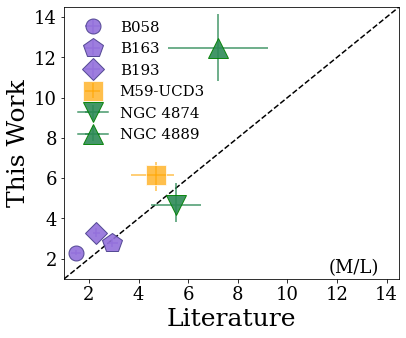

In [61]:
#Literature comparison plot (V17 and Z17)
alexa_new_objects = [b058_old, b163, b193, M59]
Z17_new_objects = [NGC4874_r, NGC4889_r]
Z17_obj_names = ['NGC4874', 'NGC4889']
Z17_ML = np.array([5.5, 7.2]) 
Z17_ML_err = np.array([1.0, 2.0])

plt.figure(figsize=(6, 5))
for i in range(len(alexa_objects)):
    if i == alexa_obj_names.index('M59-UCD3'):
        plt.errorbar(alexa_objects[i].fit_params['ML_v']['median'], alexa_new_objects[i].fit_params['ML_v']['median'], 
                       xerr=[[alexa_objects[i].fit_params['ML_v']['lo_err']], [alexa_objects[i].fit_params['ML_v']['hi_err']]],
                      yerr=[[alexa_new_objects[i].fit_params['ML_v']['lo_err']], [alexa_new_objects[i].fit_params['ML_v']['hi_err']]], linestyle='None', 
                      marker='s', markersize=20, color='orange', alpha=0.7, mec='w', mew=1, zorder=2, label='M59-UCD3')
    elif i == alexa_obj_names.index('B058'):
        plt.errorbar(alexa_objects[i].fit_params['ML_v']['median'], alexa_new_objects[i].fit_params['ML_v']['median'], 
                       xerr=[[alexa_objects[i].fit_params['ML_v']['lo_err']], [alexa_objects[i].fit_params['ML_v']['hi_err']]],
                      yerr=[[alexa_new_objects[i].fit_params['ML_v']['lo_err']], [alexa_new_objects[i].fit_params['ML_v']['hi_err']]], linestyle='None', 
                      marker='.', markersize=30, color='mediumpurple', alpha=0.9, mec='darkslateblue', mew=1, zorder=1, 
                     label='B058')
    elif i == alexa_obj_names.index('B163'):
        plt.errorbar(alexa_objects[i].fit_params['ML_v']['median'], alexa_new_objects[i].fit_params['ML_v']['median'], 
                       xerr=[[alexa_objects[i].fit_params['ML_v']['lo_err']], [alexa_objects[i].fit_params['ML_v']['hi_err']]],
                      yerr=[[alexa_new_objects[i].fit_params['ML_v']['lo_err']], [alexa_new_objects[i].fit_params['ML_v']['hi_err']]], linestyle='None', 
                      marker='p', markersize=20, color='mediumpurple', alpha=0.9, mec='darkslateblue', mew=1, zorder=1, 
                     label='B163')
    elif i == alexa_obj_names.index('B193'):
        plt.errorbar(alexa_objects[i].fit_params['ML_v']['median'], alexa_new_objects[i].fit_params['ML_v']['median'], 
                       xerr=[[alexa_objects[i].fit_params['ML_v']['lo_err']], [alexa_objects[i].fit_params['ML_v']['hi_err']]],
                      yerr=[[alexa_new_objects[i].fit_params['ML_v']['lo_err']], [alexa_new_objects[i].fit_params['ML_v']['hi_err']]], linestyle='None', 
                      marker='D', markersize=15, color='mediumpurple', alpha=0.9, mec='darkslateblue', mew=1, zorder=1, 
                     label='B193')

for i in range(len(Z17_new_objects)):
    if i == Z17_obj_names.index('NGC4874'):
        plt.errorbar(Z17_ML[i], Z17_new_objects[i].fit_params['ML_v']['median'], xerr=Z17_ML_err[i], 
                    yerr=[[Z17_new_objects[i].fit_params['ML_v']['lo_err']], [Z17_new_objects[i].fit_params['ML_v']['hi_err']]],
                    marker='v', markersize=20, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2, label='NGC 4874')
    else:
        plt.errorbar(Z17_ML[i], Z17_new_objects[i].fit_params['ML_v']['median'], xerr=Z17_ML_err[i], 
                    yerr=[[Z17_new_objects[i].fit_params['ML_v']['lo_err']], [Z17_new_objects[i].fit_params['ML_v']['hi_err']]],
                    marker='^', markersize=20, color='seagreen', alpha=0.9, mec='g', mew=1, zorder=2, label='NGC 4889')

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(fontsize=15, framealpha=0, frameon=False, loc=2)
plt.text(13.7, 1.1, '(M/L)', fontsize=18, ha='right', va='bottom')
plt.ylabel('This Work', fontsize=25)
plt.xlabel('Literature', fontsize=25)

plt.xlim(1, 14.5)
plt.ylim(1, 14.5)

plt.plot((1, 14.5), (1, 14.5), linestyle='dashed', color='k', zorder=0)
plt.savefig('paper_V17_compare.pdf', bbox_inches='tight')

# Dynamical comparisons

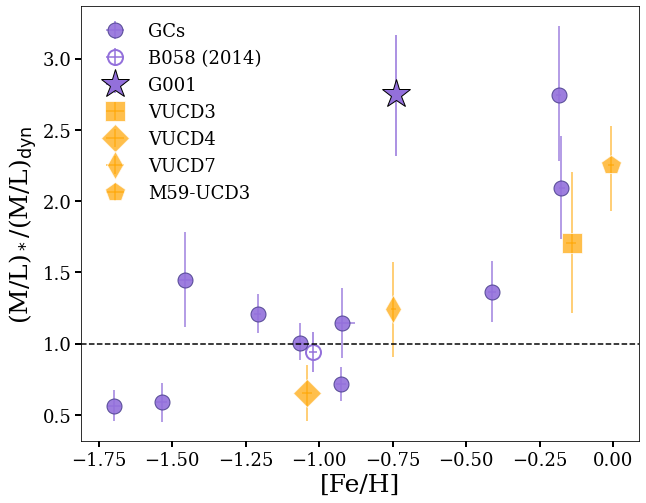

In [62]:
#M/L comparisons
#GCs
GC_lit_params = pd.read_csv('GC_literature_values.csv', index_col=0)
GC_obj_names = ['New B058', 'Old B058', 'B163', 'B193', 'B067', 'B225', 'B012', 'B107', 'G001', 'B074', 'B338', 'B405']
GC_objects = [b058_new, b058_old, b163, b193, b067, b225, 
           b012, b107, g001, b074, b338, b405]

fitted_GC_ML = []
for i in range(len(GC_objects)):
    fitted_GC_ML.append(GC_objects[i].fit_params['ML_v']['median'])
    
#UCDs
UCD_lit_params = pd.read_csv('UCD_literature_values.csv', index_col=0)
UCD_obj_names = ['VUCD3', 'VUCD4', 'VUCD7', 'NGC4889', 'NGC4874', 'M59-UCD3']
UCD_objects = [VUCD3, VUCD4, VUCD7, NGC4889, NGC4874, M59]

fitted_UCD_ML = []
for i in range(len(UCD_objects)):
    fitted_UCD_ML.append(UCD_objects[i].fit_params['ML_v']['median'])
    
#M/L ratios and FEH
GC_ratios = []
GC_ratios_merr = []
GC_ratios_perr = []
GC_feh = []
GC_feh_merr = []
GC_feh_perr = []
for i in range(len(GC_obj_names)):
    GC_ratios.append(GC_objects[i].fit_params['ML_v']['median']/GC_lit_params['ML_v_dyn'][i])
    GC_ratios_merr.append(GC_ratios[i]*np.sqrt((GC_lit_params['ML_v_dyn_err'][i]/GC_lit_params['ML_v_dyn'][i])**2 + \
                                        (GC_objects[i].fit_params['ML_v']['lo_err']/\
                                         GC_objects[i].fit_params['ML_v']['median'])**2))
    GC_ratios_perr.append(GC_ratios[i]*np.sqrt((GC_lit_params['ML_v_dyn_err'][i]/GC_lit_params['ML_v_dyn'][i])**2 + \
                                        (GC_objects[i].fit_params['ML_v']['hi_err']/\
                                         GC_objects[i].fit_params['ML_v']['median'])**2))
    
    GC_feh.append(GC_objects[i].fit_params['FeH']['median'])
    GC_feh_merr.append(GC_objects[i].fit_params['FeH']['lo_err'])
    GC_feh_perr.append(GC_objects[i].fit_params['FeH']['hi_err'])

UCD_ratios = []
UCD_ratios_merr = []
UCD_ratios_perr = []
UCD_feh = []
UCD_feh_merr = []
UCD_feh_perr = []
for i in range(len(UCD_obj_names)):
    UCD_ratios.append(UCD_objects[i].fit_params['ML_v']['median']/UCD_lit_params['ML_dyn'][i])
    UCD_ratios_merr.append(UCD_ratios[i]*np.sqrt((UCD_lit_params['ML_dyn_err'][i]/UCD_lit_params['ML_dyn'][i])**2 + \
                                        (UCD_objects[i].fit_params['ML_v']['lo_err']/\
                                         UCD_objects[i].fit_params['ML_v']['median'])**2))
    UCD_ratios_perr.append(UCD_ratios[i]*np.sqrt((UCD_lit_params['ML_dyn_err'][i]/UCD_lit_params['ML_dyn'][i])**2 + \
                                        (UCD_objects[i].fit_params['ML_v']['hi_err']/\
                                         UCD_objects[i].fit_params['ML_v']['median'])**2))
    
    UCD_feh.append(UCD_objects[i].fit_params['FeH']['median'])
    UCD_feh_merr.append(UCD_objects[i].fit_params['FeH']['lo_err'])
    UCD_feh_perr.append(UCD_objects[i].fit_params['FeH']['hi_err'])
    
#Plot
plt.figure(figsize=(10, 8))                                                                                       
for i in range(len(GC_obj_names)):
    if i == GC_obj_names.index('G001'):
        plt.errorbar(GC_feh[i], GC_ratios[i], xerr=[[GC_feh_merr[i]], [GC_feh_perr[i]]], 
                   yerr=[[GC_ratios_merr[i]], [GC_ratios_perr[i]]], linestyle='None', marker='*', markersize=30, 
                   color='mediumpurple', label=GC_obj_names[i], mec='k', mew=1, zorder=0)
    elif i == GC_obj_names.index('Old B058'):
        plt.errorbar(GC_feh[i], GC_ratios[i], xerr=[[GC_feh_merr[i]], [GC_feh_perr[i]]], 
                   yerr=[[GC_ratios_merr[i]], [GC_ratios_perr[i]]], linestyle='None', marker='.', markersize=30, 
                       color='mediumpurple', label='B058 (2014)', mfc='None', mew=2, zorder=1)
    elif i == 0:
        plt.errorbar(GC_feh[i], GC_ratios[i], xerr=[[GC_feh_merr[i]], [GC_feh_perr[i]]], 
                       yerr=[[GC_ratios_merr[i]], [GC_ratios_perr[i]]], linestyle='None', marker='.', 
                      markersize=30, color='mediumpurple', mec='darkslateblue', mew=1, zorder=1, alpha=0.9, label='GCs')
    else:
        plt.errorbar(GC_feh[i], GC_ratios[i], xerr=[[GC_feh_merr[i]], [GC_feh_perr[i]]], 
                       yerr=[[GC_ratios_merr[i]], [GC_ratios_perr[i]]], linestyle='None', marker='.', 
                      markersize=30, color='mediumpurple', mec='darkslateblue', mew=1, zorder=1, alpha=0.9)
    
for i in range(len(UCD_obj_names)):
    if i == UCD_obj_names.index('VUCD3'):
        plt.errorbar(UCD_feh[i], UCD_ratios[i], xerr=[[UCD_feh_merr[i]], [UCD_feh_perr[i]]], 
                   yerr=[[UCD_ratios_merr[i]], [UCD_ratios_perr[i]]], linestyle='None', marker='s', markersize=20, 
                   color='orange', mec='w', mew=1, zorder=2, alpha=0.7, label='VUCD3')
    elif i == UCD_obj_names.index('VUCD4'):
        plt.errorbar(UCD_feh[i], UCD_ratios[i], xerr=[[UCD_feh_merr[i]], [UCD_feh_perr[i]]], 
                   yerr=[[UCD_ratios_merr[i]], [UCD_ratios_perr[i]]], linestyle='None', marker='D', markersize=20, 
                   color='orange', mec='w', mew=1, zorder=2, alpha=0.7, label='VUCD4')
    elif i == UCD_obj_names.index('VUCD7'):
        plt.errorbar(UCD_feh[i], UCD_ratios[i], xerr=[[UCD_feh_merr[i]], [UCD_feh_perr[i]]], 
                   yerr=[[UCD_ratios_merr[i]], [UCD_ratios_perr[i]]], linestyle='None', marker='d', markersize=20, 
                   color='orange', mec='w', mew=1, zorder=2, alpha=0.7, label='VUCD7')
    elif i == UCD_obj_names.index('M59-UCD3'):
        plt.errorbar(UCD_feh[i], UCD_ratios[i], xerr=[[UCD_feh_merr[i]], [UCD_feh_perr[i]]], 
                   yerr=[[UCD_ratios_merr[i]], [UCD_ratios_perr[i]]], linestyle='None', marker='p', markersize=20, 
                   color='orange', mec='w', mew=1, zorder=2, alpha=0.7, label='M59-UCD3')
    elif i == UCD_obj_names.index('NGC4889') or i == UCD_obj_names.index('NGC4874'):
        continue
        
plt.axhline(1, linestyle='dashed', color='k')
plt.xlabel('[Fe/H]', fontsize=25)
plt.ylabel('(M/L)$_*$/(M/L)$_{\mathrm{dyn}}$', fontsize=25)
plt.tick_params(length=6, width=2, labelsize=18)
plt.legend(fontsize=18, framealpha=0, frameon=False)
plt.savefig('paper_ML_lit_compare.pdf', bbox_inches='tight')

# Sample

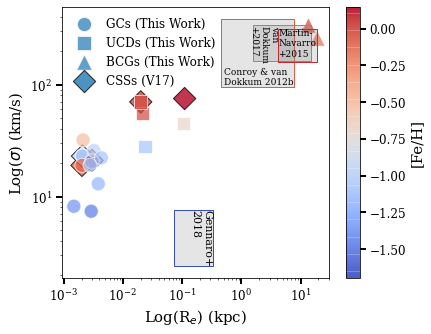

In [63]:
#Sample selection
import matplotlib.patches as patch
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

UCD_Rh = np.concatenate((UCD_lit_params['Rh'][0:3].values, [UCD_lit_params['Rh'][-1]]))
UCD_sigma = np.concatenate((UCD_lit_params['Velocity Dispersion'][0:3].values, 
                            [UCD_lit_params['Velocity Dispersion'][-1]]))
UCD_FeH = np.concatenate((UCD_lit_params['FeH'][0:3].values, [UCD_lit_params['FeH'][-1]]))

ETG_FeH = []
for i in range(len(all_etgs)):
    ETG_FeH.append(all_etgs[i].fit_params['FeH']['median'])
    
V17_params = pd.read_csv('Literature_Values_V17.csv', index_col=0)
CvD12b_params = pd.read_csv('Literature_Values_CvD12b.csv', index_col=0)
vDC17_params = pd.read_csv('Literature_Values_vDC17.csv', index_col=0)
Gennaro_params = pd.read_csv('Literature_Values_Gennaro+2018.csv', index_col=0)

vmin = np.min(np.concatenate((GC_lit_params['FeH'], UCD_lit_params['FeH'], V17_params['FeH'])))
vmax = np.max(np.concatenate((GC_lit_params['FeH'], UCD_lit_params['FeH'], V17_params['FeH'])))
norm = Normalize(vmin=vmin, vmax=vmax)
vDC17_colour = plt.cm.coolwarm(norm(np.mean(ETG_FeH)))
CvD12b_colour = plt.cm.coolwarm(norm(np.mean(CvD12b_params['FeH'])))
Gennaro_colour = plt.cm.coolwarm(norm(np.mean(Gennaro_params['FeH'])))
MN_colour = plt.cm.coolwarm(norm(0.08))

fig, ax = plt.subplots(figsize=(6, 5))
CvD12b_region = patch.Rectangle((np.min(CvD12b_params['Re (pc)']/1000), 
                                 np.min(CvD12b_params['Velocity Dispersion'])), 
                                width=np.max(CvD12b_params['Re (pc)']/1000) - \
                                np.min(CvD12b_params['Re (pc)']/1000),
                                height=np.max(CvD12b_params['Velocity Dispersion']) - \
                                np.min(CvD12b_params['Velocity Dispersion']), color='grey', alpha=0.2)
ax.add_patch(CvD12b_region)
CvD12b_metallicity = patch.Rectangle((np.min(CvD12b_params['Re (pc)']/1000), 
                                 np.min(CvD12b_params['Velocity Dispersion'])), 
                                width=np.max(CvD12b_params['Re (pc)']/1000) - \
                                np.min(CvD12b_params['Re (pc)']/1000),
                                height=np.max(CvD12b_params['Velocity Dispersion']) - \
                                np.min(CvD12b_params['Velocity Dispersion']), edgecolor=CvD12b_colour, facecolor='None')
ax.add_patch(CvD12b_metallicity)
vDC17_region = patch.Rectangle((np.min(vDC17_params['Re (pc)']/1000), 
                                 np.min(vDC17_params['Velocity Dispersion'])), 
                                width=np.max(vDC17_params['Re (pc)']/1000) - \
                                np.min(vDC17_params['Re (pc)']/1000),
                                height=np.max(vDC17_params['Velocity Dispersion']) - \
                                np.min(vDC17_params['Velocity Dispersion']), color='grey', alpha=0.2)
ax.add_patch(vDC17_region)
vDC17_metallicity = patch.Rectangle((np.min(vDC17_params['Re (pc)']/1000), np.min(vDC17_params['Velocity Dispersion'])), 
                                    width=np.max(vDC17_params['Re (pc)']/1000) - np.min(vDC17_params['Re (pc)']/1000), 
                                    height=np.max(vDC17_params['Velocity Dispersion']) - np.min(vDC17_params['Velocity Dispersion']), 
                                    edgecolor=vDC17_colour, facecolor='None')
ax.add_patch(vDC17_metallicity)
MN15_region = patch.Rectangle((4113/1000, 160), width=(19200-4113)/1000, height=310-160, color='grey', alpha=0.2)
ax.add_patch(MN15_region)
MN15_metallicity = patch.Rectangle((4113/1000, 160), width=(19200-4113)/1000, height=310-160, facecolor='None', edgecolor=MN_colour)
ax.add_patch(MN15_metallicity)
Gennaro_region = patch.Rectangle((np.min(Gennaro_params['Re']/1000), 
                                 np.min(Gennaro_params['Velocity Dispersion'])), 
                                width=np.max(Gennaro_params['Re']/1000) - \
                                np.min(Gennaro_params['Re']/1000),
                                height=np.max(Gennaro_params['Velocity Dispersion']) - \
                                np.min(Gennaro_params['Velocity Dispersion']), color='grey', alpha=0.2)
ax.add_patch(Gennaro_region)
Gennaro_metallicity = patch.Rectangle((np.min(Gennaro_params['Re']/1000), 
                                 np.min(Gennaro_params['Velocity Dispersion'])), 
                                width=np.max(Gennaro_params['Re']/1000) - \
                                np.min(Gennaro_params['Re']/1000),
                                height=np.max(Gennaro_params['Velocity Dispersion']) - \
                                np.min(Gennaro_params['Velocity Dispersion']), facecolor='None', edgecolor=Gennaro_colour)
ax.add_patch(Gennaro_metallicity)
sc_GC = ax.scatter(GC_lit_params['Rh (pc)']/1000, GC_lit_params['Velocity dispersion'], s=200, 
                   c=GC_lit_params['FeH'], cmap='coolwarm', vmin=vmin, vmax=vmax, alpha=0.7, edgecolors='w',
                  label='GCs (This Work)')
sc_UCD = ax.scatter(UCD_Rh/1000, UCD_sigma, s=175, c=UCD_FeH, cmap='coolwarm', marker='s', vmin=vmin, vmax=vmax,
                   alpha=0.7, edgecolors='w', label='UCDs (This Work)')
sc_BCG = ax.scatter(UCD_lit_params['Rh'][3:5]/1000, UCD_lit_params['Velocity Dispersion'][3:5], s=240, 
                     c=UCD_lit_params['FeH'][3:5], cmap='coolwarm', marker='^', vmin=vmin, vmax=vmax, alpha=0.7, 
                    edgecolors='w', label='BCGs (This Work)')
sc_V17 = ax.scatter(V17_params['Re']/1000, V17_params['Velocity Dispersion'], s=250, c=V17_params['FeH'],
                   cmap='coolwarm', marker='D', vmin=vmin, vmax=vmax, alpha=0.8, edgecolors='k', label='CSSs (V17)',
                   zorder=0)
ax.set_xscale('log')
ax.set_yscale('log')

ax.tick_params(length=6, width=2, labelsize=12)
ax.set_xlabel('Log(R$_e$) (kpc)', fontsize=15)
ax.set_ylabel('Log($\sigma$) (km/s)', fontsize=15)
cbar = plt.colorbar(sc_GC)
cbar.ax.tick_params(length=6, width=2, labelsize=12)
cbar.set_label('[Fe/H]', fontsize=15)
ax.legend(fontsize=12, framealpha=0, frameon=False)
ax.text(0.5, 100, 'Conroy & van\nDokkum 2012b', fontsize=9)
ax.text(1.35, 160, 'van \nDokkum\n+2017', fontsize=9, rotation=270)
ax.text(4.2, 180, 'Martín-\nNavarro\n+2015', fontsize=9)
ax.text(0.14, 2.5, 'Gennaro+\n2018', fontsize=11, rotation=270)
plt.savefig('paper_sample.pdf', bbox_inches='tight')

# Final fit results

In [64]:
#Stellar pops table
all_objects = [b012, b058_new, b058_old, b067, b074, b107, b163, b193, b225, b338, b405, g001, M59, VUCD3, VUCD4,
              VUCD7, NGC4874, NGC4889]
all_obj_names = ['B012-G064', 'B058-G119 (New)', 'B058-G119 (Old)', 'B067-G129', 'B074-G135', 'B107-G169', 
                'B163', 'B193', 'B225-G280', 'B338-G076', 'B405-G351', 'G001-MII', 'M59-UCD3', 'VUCD3', 'VUCD4',
                'VUCD7', 'NGC4874', 'NGC4889']
all_feh = []
all_feh_merr = []
all_feh_perr = []
all_age = []
all_age_merr = []
all_age_perr = []
all_mgfe = []
all_mgfe_merr = []
all_mgfe_perr = []
all_mass = []
all_mass_merr = []
all_mass_perr = []
all_ML = []
all_ML_merr = []
all_ML_perr = []
all_ML_MW = []
all_ML_MW_merr = []
all_ML_MW_perr = []
for i in range(len(all_objects)):
    all_feh.append(np.round(all_objects[i].fit_params['FeH']['median'], 2))
    all_feh_merr.append(np.round(all_objects[i].fit_params['FeH']['lo_err'], 2))
    all_feh_perr.append(np.round(all_objects[i].fit_params['FeH']['hi_err'], 2))
    all_age.append(np.round(10**all_objects[i].fit_params['logage']['median'], 2))
    all_age_merr.append(np.round(np.log(10)*all_objects[i].fit_params['logage']['lo_err']*10**all_objects[i].fit_params['logage']['median'], 2))
    all_age_perr.append(np.round(np.log(10)*all_objects[i].fit_params['logage']['hi_err']*10**all_objects[i].fit_params['logage']['median'], 2))
    all_mgfe.append(np.round(all_objects[i].fit_params['MgFe']['median'], 2))
    all_mgfe_merr.append(np.round(all_objects[i].fit_params['MgFe']['lo_err'], 2))
    all_mgfe_perr.append(np.round(all_objects[i].fit_params['MgFe']['hi_err'], 2))
    all_mass.append(np.round(all_objects[i].fit_params['Mass']['median'], 2))
    all_mass_merr.append(np.round(all_objects[i].fit_params['Mass']['lo_err'], 2))
    all_mass_perr.append(np.round(all_objects[i].fit_params['Mass']['hi_err'], 2))
    all_ML.append(np.round(all_objects[i].fit_params['ML_v']['median'], 2))
    all_ML_merr.append(np.round(all_objects[i].fit_params['ML_v']['lo_err'], 2))
    all_ML_perr.append(np.round(all_objects[i].fit_params['ML_v']['hi_err'], 2))
    all_ML_MW.append(np.round(all_objects[i].fit_params['MW_v']['median'], 2))
    all_ML_MW_merr.append(np.round(all_objects[i].fit_params['MW_v']['lo_err'], 2))
    all_ML_MW_perr.append(np.round(all_objects[i].fit_params['MW_v']['hi_err'], 2))

stellar_pops_dict = {'ID': all_obj_names, '[Fe/H]': all_feh, '[Fe/H] Lo Err': all_feh_merr, '[Fe/H] Hi Err': 
                    all_feh_perr, 'Age': all_age, 'Age Lo Err': all_age_merr, 'Age Hi Err': 
                    all_age_perr, '[Mg/Fe]': all_mgfe, '[Mg/Fe] Lo Err': all_mgfe_merr, '[Mg/Fe] Hi Err': 
                    all_mgfe_perr, 'Mass': all_mass, 'Mass Lo Err': all_mass_merr, 'Mass Hi Err': 
                    all_mass_perr, 'M/L': all_ML, 'M/L Lo Err': all_ML_merr, 'M/L Hi Err': 
                    all_ML_perr, 'MW': all_ML_MW, 'MW Lo Err': all_ML_MW_merr, 'MW Hi Err': 
                    all_ML_MW_perr}
stellar_pops_df = pd.DataFrame(stellar_pops_dict)
stellar_pops_df.to_csv('stellar_pops_df.csv', index=False)

# Fit and residual plots

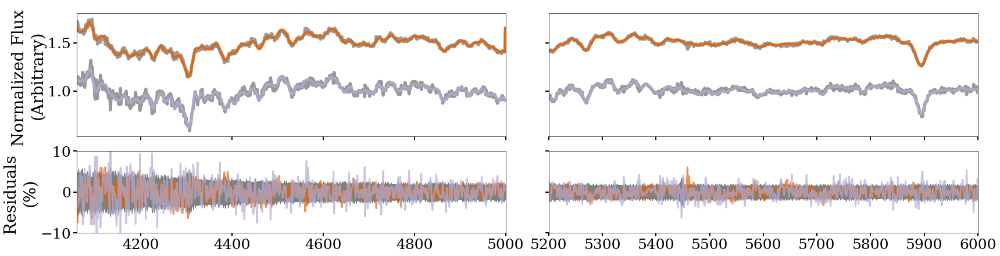

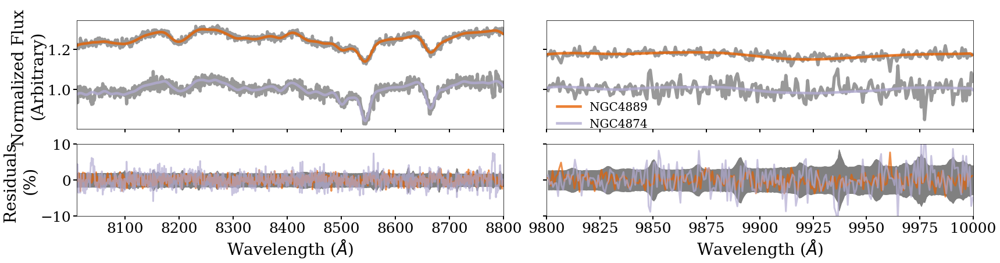

In [65]:
#Fit wavelength chunks
fit_wave_range = [[4060, 5000], [5200, 6000], [8010, 8800], [9800, 10000]]

#BCG fits
#Get data
NGC4889_fit = alf_processing('/Users/chloecheng/packages/alf/results/NGC4889_vIK', 
                         fit_wave_range, 53)
NGC4889_fit.alf_preprocessing(53)
NGC4874_fit = alf_processing('/Users/chloecheng/packages/alf/results/NGC4874_vIK', fit_wave_range, 53)
NGC4874_fit.alf_preprocessing(53)

BCG_fit_obj_names = ['NGC4889', 'NGC4874']
BCG_fit_objs = [NGC4889_fit, NGC4874_fit]
shifts1 = [0.5, 0]
shifts2 = [0.25, 0]
shifts3 = [0.17, 0]
c = ['#e66101', '#b2abd2']

#Plot - blue
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(24, 6), gridspec_kw={'height_ratios': [3, 2]}, sharey='row', sharex='col')
fig.set_tight_layout(True)

for i in range(len(BCG_fit_objs)):
    ax[0,0].plot(BCG_fit_objs[i].waves[0], BCG_fit_objs[i].data_flux[0]+shifts1[i], color='grey', alpha=0.8, lw=5.5)
    ax[0,0].plot(BCG_fit_objs[i].waves[0], BCG_fit_objs[i].model_flux[0]+shifts1[i], color=c[i],
                 alpha=0.8, lw=4.5)
    ax[0,1].plot(BCG_fit_objs[i].waves[1], BCG_fit_objs[i].data_flux[1]+shifts1[i], color='grey', alpha=0.8, 
                 lw=5.5)
    ax[0,1].plot(BCG_fit_objs[i].waves[1], BCG_fit_objs[i].model_flux[1]+shifts1[i], color=c[i],
                 alpha=0.8, lw=4.5)
    ax[1,0].plot(BCG_fit_objs[i].waves[0], BCG_fit_objs[i].residuals[0], color=c[i], lw=3, alpha=0.7)
    ax[1,0].fill_between(BCG_fit_objs[1].waves[0], -(BCG_fit_objs[1].unc[0])*1e2, +(BCG_fit_objs[1].unc[0]*1e2), color='grey')
    ax[1,1].plot(BCG_fit_objs[i].waves[1], BCG_fit_objs[i].residuals[1], color=c[i], lw=3, alpha=0.7)
    ax[1,1].fill_between(BCG_fit_objs[1].waves[1], -(BCG_fit_objs[1].unc[1])*1e2, +(BCG_fit_objs[1].unc[1]*1e2), color='grey')
    

ax[0,0].tick_params(length=6, width=2, labelsize=25)
ax[0,1].tick_params(length=6, width=2, labelsize=25)
ax[1,0].tick_params(length=6, width=2, labelsize=25)
ax[1,1].tick_params(length=6, width=2, labelsize=25)
ax[0,0].set_ylabel('Normalized Flux \n(Arbitrary)', fontsize=28)
ax[1,0].set_ylabel('Residuals \n(%)', fontsize=28)
ax[0,0].set_xlim(fit_wave_range[0][0], fit_wave_range[0][-1])
ax[0,1].set_xlim(fit_wave_range[1][0], fit_wave_range[1][-1])
ax[1,0].set_xlim(fit_wave_range[0][0], fit_wave_range[0][-1])
ax[1,1].set_xlim(fit_wave_range[1][0], fit_wave_range[1][-1])
ax[1,0].set_ylim(-10,10)
ax[1,1].set_ylim(-10,10)
plt.savefig('paper_fits_bcgs_1.pdf', bbox_inches='tight')

#Plot - red
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(24, 6), gridspec_kw={'height_ratios': [3, 2]}, sharey='row', sharex='col')
fig.set_tight_layout(True)

for i in range(len(BCG_fit_objs)):
    ax[0,0].plot(BCG_fit_objs[i].waves[2], BCG_fit_objs[i].data_flux[2]+shifts2[i], color='grey', alpha=0.8, lw=5.5)
    ax[0,0].plot(BCG_fit_objs[i].waves[2], BCG_fit_objs[i].model_flux[2]+shifts2[i], color=c[i],
                 alpha=0.8, lw=4.5)
    ax[0,1].plot(BCG_fit_objs[i].waves[3], BCG_fit_objs[i].data_flux[3]+shifts3[i], color='grey', alpha=0.8, 
                 lw=5.5)
    ax[0,1].plot(BCG_fit_objs[i].waves[3], BCG_fit_objs[i].model_flux[3]+shifts3[i], color=c[i],
                 alpha=0.8, lw=4.5, label=BCG_fit_obj_names[i])
    ax[1,0].plot(BCG_fit_objs[i].waves[2], BCG_fit_objs[i].residuals[2], color=c[i], lw=3, alpha=0.7)
    ax[1,0].fill_between(BCG_fit_objs[1].waves[2], -(BCG_fit_objs[1].unc[2])*1e2, +(BCG_fit_objs[1].unc[2])*1e2, color='grey')
    ax[1,1].plot(BCG_fit_objs[i].waves[3], BCG_fit_objs[i].residuals[3], color=c[i], lw=3, alpha=0.7)
    ax[1,1].fill_between(BCG_fit_objs[1].waves[3], -(BCG_fit_objs[1].unc[3])*1e2, +(BCG_fit_objs[1].unc[3])*1e2, color='grey')
    

ax[0,0].tick_params(length=6, width=2, labelsize=25)
ax[0,1].tick_params(length=6, width=2, labelsize=25)
ax[1,0].tick_params(length=6, width=2, labelsize=25)
ax[1,1].tick_params(length=6, width=2, labelsize=25)
ax[0,0].set_ylabel('Normalized Flux \n(Arbitrary)', fontsize=28)
ax[1,0].set_ylabel('Residuals \n(%)', fontsize=28)
ax[-1,0].set_xlabel('Wavelength ($\AA$)', fontsize=28)
ax[-1,1].set_xlabel('Wavelength ($\AA$)', fontsize=28)
ax[0,1].legend(fontsize=20, frameon=False, framealpha=0, loc='best', bbox_to_anchor=(0, -0.10, 0.5, 0.5))
ax[0,0].set_xlim(fit_wave_range[2][0], fit_wave_range[2][-1])
ax[0,1].set_xlim(fit_wave_range[3][0], fit_wave_range[3][-1])
ax[1,0].set_xlim(fit_wave_range[2][0], fit_wave_range[2][-1])
ax[1,1].set_xlim(fit_wave_range[3][0], fit_wave_range[3][-1])
ax[1,0].set_ylim(-10,10)
ax[1,1].set_ylim(-10,10)
plt.savefig('paper_fits_bcgs_2.pdf', bbox_inches='tight')

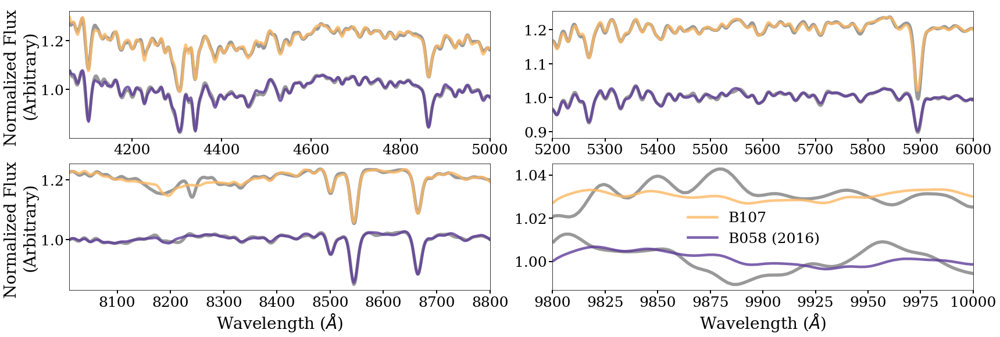

In [66]:
#GC fits
#Get data
B107_fit = alf_processing('/Users/chloecheng/packages/alf/results/B107_vIK', 
                         fit_wave_range, 53)
B107_fit.alf_preprocessing(53)
B058_new_fit = alf_processing('/Users/chloecheng/packages/alf/results/B058_new_vIK', fit_wave_range, 53)
B058_new_fit.alf_preprocessing(53)

GC_fit_obj_names = ['B107', 'B058 (2016)']
GC_fit_objs = [B107_fit, B058_new_fit]
shifts1 = [0.2, 0]
shifts2 = [0.2, 0]
shifts3 = [0.03, 0]
c = ['#fdb863', '#5e3c99']

#Plot
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(24, 8))
fig.set_tight_layout(True)

for i in range(len(GC_fit_objs)):
    ax[0,0].plot(GC_fit_objs[i].waves[0], GC_fit_objs[i].data_flux[0]+shifts1[i], color='grey', alpha=0.8, lw=5.5)
    ax[0,0].plot(GC_fit_objs[i].waves[0], GC_fit_objs[i].model_flux[0]+shifts1[i], color=c[i],
                 alpha=0.8, lw=4.5)
    ax[0,1].plot(GC_fit_objs[i].waves[1], GC_fit_objs[i].data_flux[1]+shifts1[i], color='grey', alpha=0.8, 
                 lw=5.5)
    ax[0,1].plot(GC_fit_objs[i].waves[1], GC_fit_objs[i].model_flux[1]+shifts1[i], color=c[i],
                 alpha=0.8, lw=4.5)
    ax[1,0].plot(GC_fit_objs[i].waves[2], GC_fit_objs[i].data_flux[2]+shifts2[i], color='grey', alpha=0.8, lw=5.5)
    ax[1,0].plot(GC_fit_objs[i].waves[2], GC_fit_objs[i].model_flux[2]+shifts2[i], color=c[i],
                 alpha=0.8, lw=4.5)
    ax[1,1].plot(GC_fit_objs[i].waves[3], GC_fit_objs[i].data_flux[3]+shifts3[i], color='grey', alpha=0.8, 
                 lw=5.5)
    ax[1,1].plot(GC_fit_objs[i].waves[3], GC_fit_objs[i].model_flux[3]+shifts3[i], color=c[i],
                 alpha=0.8, lw=4.5, label=GC_fit_obj_names[i])
    

ax[0,0].tick_params(length=6, width=2, labelsize=25)
ax[0,1].tick_params(length=6, width=2, labelsize=25)
ax[1,0].tick_params(length=6, width=2, labelsize=25)
ax[1,1].tick_params(length=6, width=2, labelsize=25)
ax[0,0].set_ylabel('Normalized Flux \n(Arbitrary)', fontsize=28)
ax[1,0].set_ylabel('Normalized Flux \n(Arbitrary)', fontsize=28)
ax[-1,0].set_xlabel('Wavelength ($\AA$)', fontsize=28)
ax[-1,1].set_xlabel('Wavelength ($\AA$)', fontsize=28)
ax[1,1].legend(fontsize=25, frameon=False, framealpha=0, loc='best', bbox_to_anchor=(0.29, 0.25, 0.5, 0.5))
ax[0,0].set_xlim(fit_wave_range[0][0], fit_wave_range[0][-1])
ax[0,1].set_xlim(fit_wave_range[1][0], fit_wave_range[1][-1])
ax[1,0].set_xlim(fit_wave_range[2][0], fit_wave_range[2][-1])
ax[1,1].set_xlim(fit_wave_range[3][0], fit_wave_range[3][-1])
plt.savefig('paper_fits_GCs.pdf', bbox_inches='tight')

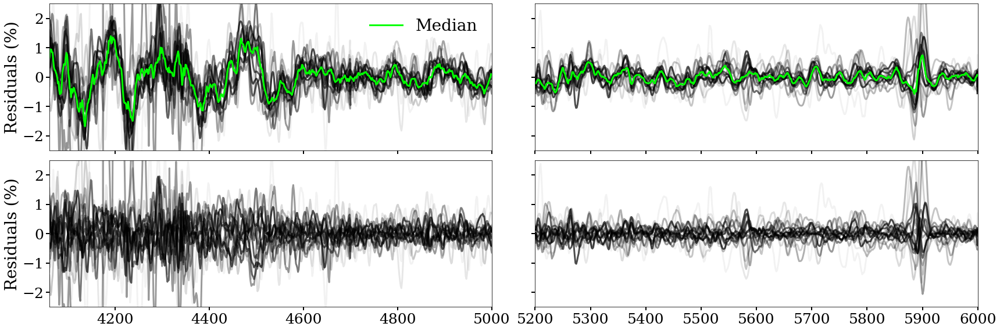

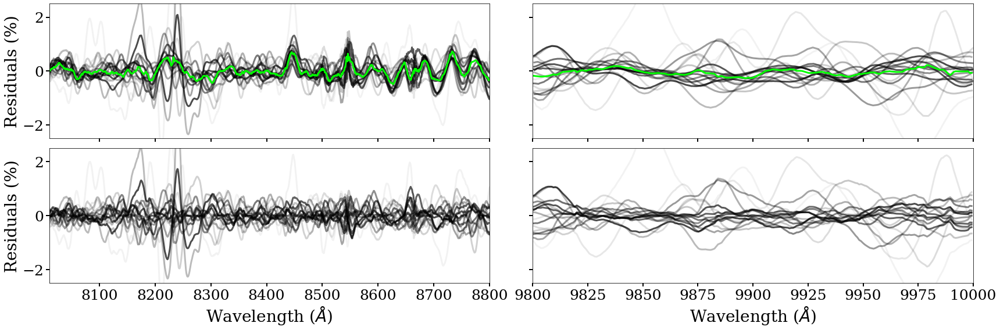

In [67]:
#Residuals
#Get data
b163_fit = alf_processing('/Users/chloecheng/packages/alf/results/B163_vIK', 
                         fit_wave_range, 53)
b163_fit.alf_preprocessing(53)

VUCD3_fit = alf_processing('/Users/chloecheng/packages/alf/results/VUCD3_vIK', fit_wave_range, 53)
VUCD3_fit.alf_preprocessing(53)

b338_fit = alf_processing('/Users/chloecheng/packages/alf/results/B338_vIK', fit_wave_range, 53)
b338_fit.alf_preprocessing(53)

VUCD4_fit = alf_processing('/Users/chloecheng/packages/alf/results/VUCD4_vIK', fit_wave_range, 53)
VUCD4_fit.alf_preprocessing(53)

b012_fit = alf_processing('/Users/chloecheng/packages/alf/results/B012_vIK', fit_wave_range, 53)
b012_fit.alf_preprocessing(53)

b193_fit = alf_processing('/Users/chloecheng/packages/alf/results/B193_vIK', 
                           fit_wave_range, 53)
b193_fit.alf_preprocessing(53)

VUCD7_fit = alf_processing('/Users/chloecheng/packages/alf/results/VUCD7_vIK', fit_wave_range, 53)
VUCD7_fit.alf_preprocessing(53)

NGC4889_fit = alf_processing('/Users/chloecheng/packages/alf/results/NGC4889_vIK', fit_wave_range, 53)
NGC4889_fit.alf_preprocessing(53)

b058_new_fit = alf_processing('/Users/chloecheng/packages/alf/results/B058_new_vIK', fit_wave_range, 53)
b058_new_fit.alf_preprocessing(53)

b058_old_fit = alf_processing('/Users/chloecheng/packages/alf/results/B058_old_vIK', fit_wave_range, 53)
b058_old_fit.alf_preprocessing(53)

b067_fit = alf_processing('/Users/chloecheng/packages/alf/results/B067_vIK', fit_wave_range, 53)
b067_fit.alf_preprocessing(53)

b225_fit = alf_processing('/Users/chloecheng/packages/alf/results/B225_vIK', fit_wave_range, 53)
b225_fit.alf_preprocessing(53)

b107_fit = alf_processing('/Users/chloecheng/packages/alf/results/B107_vIK', fit_wave_range, 53)
b107_fit.alf_preprocessing(53)

g001_fit = alf_processing('/Users/chloecheng/packages/alf/results/G001_vIK', fit_wave_range, 53)
g001_fit.alf_preprocessing(53)

b074_fit = alf_processing('/Users/chloecheng/packages/alf/results/B074_vIK', fit_wave_range, 53)
b074_fit.alf_preprocessing(53)

b405_fit = alf_processing('/Users/chloecheng/packages/alf/results/B405_vIK', fit_wave_range, 53)
b405_fit.alf_preprocessing(53)

NGC4874_fit = alf_processing('/Users/chloecheng/packages/alf/results/NGC4874_vIK', fit_wave_range, 53)
NGC4874_fit.alf_preprocessing(53)

M59_fit = alf_processing('/Users/chloecheng/packages/alf/results/M59_UCD3_vIK', fit_wave_range, 53)
M59_fit.alf_preprocessing(53)

#Remove BCGs
#Sort by S/N
blue_SN = [118., 246., 137., 145., 128., 108., 317., 143., 286., 243., 167., 293., 106.,  59., 80., 121.]
red_SN = [89., 208., 113., 106.,  95.,  98., 248., 123., 267., 203., 130., 288.,  97.,  60., 68., 101.]
sorted_blue_SN = np.argsort(blue_SN)
sorted_red_SN = np.argsort(red_SN)
all_fit_obj = [b012_fit, b058_old_fit, b058_new_fit, b067_fit, b074_fit, b107_fit, b163_fit, b193_fit, b225_fit,
              b338_fit, b405_fit, g001_fit, M59_fit, VUCD3_fit, VUCD4_fit, VUCD7_fit]
blue_fit_obj = [] 
red_fit_obj = [] 
for i in range(len(all_fit_obj)):
    blue_fit_obj.append(all_fit_obj[sorted_blue_SN[i]])
    red_fit_obj.append(all_fit_obj[sorted_red_SN[i]])
alphas_all = np.linspace(0.05, 0.7, len(all_fit_obj))

#Find medians
#Get max length fit to interpolate to
all_fit_wave_len_0 = []
all_fit_wave_len_1 = []
all_fit_wave_len_2 = []
all_fit_wave_len_3 = []
for i in range(len(all_fit_obj)):
    all_fit_wave_len_0.append(len(all_fit_obj[i].waves[0]))
    all_fit_wave_len_1.append(len(all_fit_obj[i].waves[1]))
    all_fit_wave_len_2.append(len(all_fit_obj[i].waves[2]))
    all_fit_wave_len_3.append(len(all_fit_obj[i].waves[3]))
all_fit_max_waves_0 = np.argmax(all_fit_wave_len_0)
all_fit_max_waves_1 = np.argmax(all_fit_wave_len_1)
all_fit_max_waves_2 = np.argmax(all_fit_wave_len_2)
all_fit_max_waves_3 = np.argmax(all_fit_wave_len_3)

#Get medians
all_residuals_fit_0 = []
all_residuals_fit_1 = []
all_residuals_fit_2 = []
all_residuals_fit_3 = []
for i in range(len(blue_fit_obj)):
    if i == all_fit_max_waves_0:
        all_residuals_fit_0.append(blue_fit_obj[i].residuals[0])
    else:
        all_residuals_fit_0.append(np.interp(blue_fit_obj[all_fit_max_waves_0].waves[0], 
                                              blue_fit_obj[i].waves[0], blue_fit_obj[i].residuals[0]))
for i in range(len(blue_fit_obj)):
    if i == all_fit_max_waves_1:
        all_residuals_fit_1.append(blue_fit_obj[i].residuals[1])
    else:
        all_residuals_fit_1.append(np.interp(blue_fit_obj[all_fit_max_waves_1].waves[1], 
                                              blue_fit_obj[i].waves[1], blue_fit_obj[i].residuals[1]))
for i in range(len(red_fit_obj)):
    if i == all_fit_max_waves_2:
        all_residuals_fit_2.append(red_fit_obj[i].residuals[2])
    else:
        all_residuals_fit_2.append(np.interp(red_fit_obj[all_fit_max_waves_2].waves[2], 
                                              red_fit_obj[i].waves[2], red_fit_obj[i].residuals[2]))
for i in range(len(red_fit_obj)):
    if i == all_fit_max_waves_3:
        all_residuals_fit_3.append(red_fit_obj[i].residuals[3])
    else:
        all_residuals_fit_3.append(np.interp(red_fit_obj[all_fit_max_waves_3].waves[3], 
                                              red_fit_obj[i].waves[3], red_fit_obj[i].residuals[3]))
all_median_res_fit_0 = np.median(all_residuals_fit_0, axis=0)
all_median_res_fit_1 = np.median(all_residuals_fit_1, axis=0)
all_median_res_fit_2 = np.median(all_residuals_fit_2, axis=0)
all_median_res_fit_3 = np.median(all_residuals_fit_3, axis=0)

#Plot (blue)
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(24, 8), sharey=True, sharex='col')
fig.set_tight_layout(True)

for i in range(len(all_fit_obj)):
    ax[0,0].plot(blue_fit_obj[i].waves[0], blue_fit_obj[i].residuals[0], color='k', 
                 lw=3, alpha=alphas_all[i])
    ax[0,1].plot(blue_fit_obj[i].waves[1], blue_fit_obj[i].residuals[1], color='k', 
                 lw=3, alpha=alphas_all[i])
    ax[1,0].plot(blue_fit_obj[all_fit_max_waves_0].waves[0], all_residuals_fit_0[i] - all_median_res_fit_0, color='k', 
                 lw=3, alpha=alphas_all[i])
    ax[1,1].plot(blue_fit_obj[all_fit_max_waves_1].waves[1], all_residuals_fit_1[i] - all_median_res_fit_1, color='k', 
                 lw=3, alpha=alphas_all[i])
ax[0,0].plot(blue_fit_obj[all_fit_max_waves_0].waves[0], all_median_res_fit_0, color='lime', lw=3, label='Median')
ax[0,1].plot(blue_fit_obj[all_fit_max_waves_1].waves[1], all_median_res_fit_1, color='lime', lw=3)
    

ax[0,0].tick_params(length=6, width=2, labelsize=25)
ax[0,1].tick_params(length=6, width=2, labelsize=25)
ax[0,0].legend(fontsize=28, frameon=False, framealpha=0)
ax[1,1].tick_params(length=6, width=2, labelsize=25)
ax[1,0].tick_params(length=6, width=2, labelsize=25)
ax[0,0].set_xlim(fit_wave_range[0][0], fit_wave_range[0][-1])
ax[0,1].set_xlim(fit_wave_range[1][0], fit_wave_range[1][-1])
ax[1,0].set_xlim(fit_wave_range[0][0], fit_wave_range[0][-1])
ax[1,1].set_xlim(fit_wave_range[1][0], fit_wave_range[1][-1])
ax[0,0].set_ylabel('Residuals (%)', fontsize=28)
ax[1,0].set_ylabel('Residuals (%)', fontsize=28)
ax[0,0].set_ylim(-2.5, 2.5)
plt.savefig('paper_residuals_1.pdf', bbox_inches='tight')

#Red
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(24, 8), sharey=True, sharex='col')
fig.set_tight_layout(True)

for i in range(len(all_fit_obj)):
    ax[0,0].plot(red_fit_obj[i].waves[2], red_fit_obj[i].residuals[2], color='k', 
                 lw=3, alpha=alphas_all[i])
    ax[0,1].plot(red_fit_obj[i].waves[3], red_fit_obj[i].residuals[3], color='k', 
                 lw=3, alpha=alphas_all[i])
    ax[1,0].plot(red_fit_obj[all_fit_max_waves_2].waves[2], all_residuals_fit_2[i] - all_median_res_fit_2, color='k', 
                 lw=3, alpha=alphas_all[i])
    ax[1,1].plot(red_fit_obj[all_fit_max_waves_3].waves[3], all_residuals_fit_3[i] - all_median_res_fit_3, color='k', 
                 lw=3, alpha=alphas_all[i])
ax[0,0].plot(red_fit_obj[all_fit_max_waves_2].waves[2], all_median_res_fit_2, color='lime', lw=3)
ax[0,1].plot(red_fit_obj[all_fit_max_waves_3].waves[3], all_median_res_fit_3, color='lime', lw=3)
    

ax[0,0].tick_params(length=6, width=2, labelsize=25)
ax[0,1].tick_params(length=6, width=2, labelsize=25)
ax[-1,0].set_xlabel('Wavelength ($\AA$)', fontsize=28)
ax[-1,1].set_xlabel('Wavelength ($\AA$)', fontsize=28)
ax[1,1].tick_params(length=6, width=2, labelsize=25)
ax[1,0].tick_params(length=6, width=2, labelsize=25)
ax[0,0].set_xlim(fit_wave_range[2][0], fit_wave_range[2][-1])
ax[0,1].set_xlim(fit_wave_range[3][0], fit_wave_range[3][-1])
ax[1,0].set_xlim(fit_wave_range[2][0], fit_wave_range[2][-1])
ax[1,1].set_xlim(fit_wave_range[3][0], fit_wave_range[3][-1])
ax[0,0].set_ylabel('Residuals (%)', fontsize=28)
ax[1,0].set_ylabel('Residuals (%)', fontsize=28)
ax[0,0].set_ylim(-2.5, 2.5)
plt.savefig('paper_residuals_2.pdf', bbox_inches='tight')

# Wing-Ford band plot

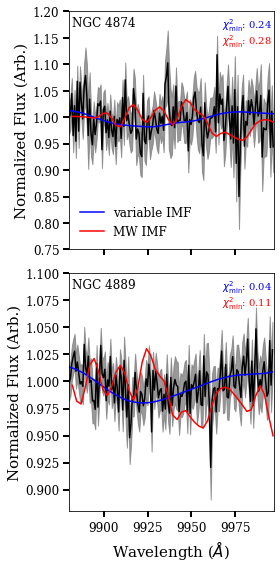

In [73]:
class alf_processing_bestspec(Alf):
        
    def __init__(self, path, wave_ranges, filetype):
        self.path = path
        self.wave_ranges = wave_ranges
        if filetype == 53:
            self.labels = ['velz', 'sigma', 'logage', 'zH', 'FeH', 'aH', 'CH', 'NH', 'NaH', 'MgH', 'SiH', 'KH', 'CaH', 'TiH', 'VH',
             'CrH', 'MnH', 'CoH', 'NiH', 'CuH', 'SrH', 'BaH', 'EuH', 'MgFe', 'Teff', 'IMF1', 'IMF2', 'logfy',
              'sigma2', 'velz2', 'hotteff', 'logm7g', 'loghot', 'fy_logage', 'logemline_h', 'logemline_oii', 
              'logemline_oiii', 'logemline_sii', 'logemline_ni', 'logemline_nii', 'logtrans', 'jitter', 'logsky', 
             'IMF3', 'IMF4', 'h3', 'h4', 'ML_v', 'MW_v', 'alpha', 'SiFe', 'CaFe', 'TiFe', 'ML_k']
        elif filetype == 50:
            self.labels = ['velz', 'sigma', 'logage', 'zH', 'FeH', 'aH', 'CH', 'NH', 'NaH', 'MgH', 'SiH', 'KH', 'CaH', 'TiH', 'VH',
             'CrH', 'MnH', 'CoH', 'NiH', 'CuH', 'SrH', 'BaH', 'EuH', 'MgFe', 'Teff', 'IMF1', 'IMF2', 'logfy',
              'sigma2', 'velz2', 'hotteff', 'logm7g', 'loghot', 'fy_logage', 'logemline_h', 
              'logemline_oiii', 'logemline_sii', 'logemline_ni', 'logemline_nii', 'logtrans', 'jitter', 'logsky', 
             'IMF3', 'IMF4', 'ML_v', 'MW_v', 'alpha', 'SiFe', 'CaFe', 'TiFe', 'ML_k']
        
        self.alf_result = None
        self.waves = None
        self.data_flux = None
        self.model_flux = None
        self.residuals = None
        self.unc = None
        self.ext_model_wave = None
        self.ext_model_flux = None
        self.lo_err = np.zeros(len(self.labels))
        self.hi_err = np.zeros(len(self.labels))
        self.fit_params = None
        
    def get_correct_alf_data_bestspec(self, filetype):
        """Return the normalized and abundance-corrected alf fit results.

        Parameters
        ----------
        path : str
            Path to alf fit result files for a particular object (no extension)

        Returns
        -------
        alf_result : read_alf.Alf object
            alf fit results, normalized and abundance-corrected
        """

        self.alf_result = Alf(self.path, read_mcmc=True)
        self.alf_result.normalize_spectra()
        self.alf_result.get_total_met()
        self.alf_result.abundance_correct(m11=True)
        if filetype == 50:
            self.alf_result.model_info['Nsample'] = 1
        return self.alf_result

    def data_split_bestspec(self, wave_range, alf_result):
        """Return the alf fit data, split by wavelength chunks.

        Parameters
        ----------
        wave_range : list
            Start and end of wavelength chunk
        alf_result : read_alf.Alf object
            alf fit results, normalized and abundance-corrected 

        Returns
        -------
        waves : tuple
            Wavelengths in wavelength chunk
        data_flux : tuple
            Flux of data in wavelength chunk
        model_flux : tuple
            Flux of model (fit) in wavelength chunk
        residuals : tuple
            Residuals between data and model in wavelength chunk
        unc : tuple
            Spectral uncertainty in wavelength chunk
        """

        self.waves = alf_result.spectra['wave'][(alf_result.spectra['wave'] > wave_range[0]) & (alf_result.spectra['wave'] \
                                           < wave_range[-1])]
        self.data_flux = alf_result.spectra['d_flux_norm'][(alf_result.spectra['wave'] > wave_range[0]) & \
                                                      (alf_result.spectra['wave'] < wave_range[-1])]
        self.model_flux = alf_result.spectra['m_flux_norm'][(alf_result.spectra['wave'] > wave_range[0]) & \
                                                      (alf_result.spectra['wave'] < wave_range[-1])]
        self.residuals = alf_result.spectra['residual'][(alf_result.spectra['wave'] > wave_range[0]) & \
                                                   (alf_result.spectra['wave'] < wave_range[-1])]
        self.unc = alf_result.spectra['unc'][(alf_result.spectra['wave'] > wave_range[0]) &  (alf_result.spectra['wave'] \
                                        < wave_range[-1])]
        self.ext_model_wave = alf_result.ext_model['wave'][(alf_result.ext_model['wave'] > wave_range[0]) &  \
                                                           (alf_result.ext_model['wave'] < wave_range[-1])]
        self.ext_model_flux = alf_result.ext_model['flux'][(alf_result.ext_model['wave'] > wave_range[0]) &  \
                                                           (alf_result.ext_model['wave'] < wave_range[-1])]
        return self.waves, self.data_flux, self.model_flux, self.residuals, self.unc, self.ext_model_wave, self.ext_model_flux

    def alf_preprocessing_bestspec(self, filetype):
        """Pre-process the alf fit results.  Essentially just calls the two functions above.

        Parameters
        ----------
        path : str
            Path to alf fit result files for a particular object (no extension)
        wave_ranges : tuple
            List of list of wavelength chunks

        Returns
        -------
        alf_result : read_alf.Alf object
            alf fit results, normalized and abundance-corrected 
        waves : tuple
            Wavelengths in all wavelength chunks
        data_flux : tuple
            Flux of data in all wavelength chunks
        model_flux : tuple
            Flux of model (fit) in all wavelength chunks
        residuals : tuple
            Residuals between data and model in all wavelength chunks
        unc : tuple
            Spectral uncertainty in all wavelength chunks
        """

        #Read alf fit results
        self.alf_result = alf_processing_bestspec.get_correct_alf_data_bestspec(self, filetype)

        #Split the data into wavelength chunks
        split_data = []
        for i in range(len(self.wave_ranges)):
            split_data.append(alf_processing_bestspec.data_split_bestspec(self, self.wave_ranges[i], self.alf_result))
        split_data = np.array(split_data, dtype=object)

        self.waves = split_data[:,0]
        self.data_flux = split_data[:,1]
        self.model_flux = split_data[:,2]
        self.residuals = split_data[:,3]
        self.unc = split_data[:,4]
        self.ext_model_wave = split_data[:,5]
        self.ext_model_flux = split_data[:,6]
        
    def plot_3chunks(self, title_str):
        fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 5), gridspec_kw={'height_ratios': [3, 1]})
        fig.set_tight_layout(True)
        fig.suptitle(title_str, fontsize=20, y=1.01)
        for i in range(len(self.waves)):
            ax[0,i].plot(self.waves[i], self.data_flux[i], color='dimgrey', lw=3)
            ax[0,i].plot(self.waves[i], self.model_flux[i], color='dodgerblue', alpha=0.7, lw=3)

            ax[1,i].plot(self.waves[i], self.residuals[i], color='dodgerblue', lw=2, alpha=0.7)
            ax[1,i].fill_between(self.waves[i], -(self.unc[i])*1e2, +(self.unc[i])*1e2, color='grey')

            ax[0,i].tick_params(length=6, width=2, labelsize=15)
            ax[1,i].tick_params(length=6, width=2, labelsize=15)
            ax[1,i].set_xlabel('Wavelength ($\AA$)', fontsize=15)
        ax[0,0].set_ylabel('Normalized Flux \n(Arb.)', fontsize=15)
        ax[1,0].set_ylabel('Residuals \n(%)', fontsize=15)
        
    def plot_5chunks(self, title_str):
        fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 10), gridspec_kw={'height_ratios':[3,1,3,1]})
        fig.set_tight_layout(True)
        fig.suptitle(title_str, fontsize=20, y=1.01)
        for i in range(0, 3):
            ax[0,i].plot(self.waves[i], self.data_flux[i], color='dimgrey', lw=3)
            ax[0,i].plot(self.waves[i], self.model_flux[i], color='r', alpha=0.7, lw=3)

            ax[1,i].plot(self.waves[i], self.residuals[i], color='r', lw=2, alpha=0.7)
            ax[1,i].fill_between(self.waves[i], -(self.unc[i])*1e2, +(self.unc[i])*1e2, color='grey')
            
            ax[0,i].tick_params(length=6, width=2, labelsize=15)
            ax[1,i].tick_params(length=6, width=2, labelsize=15)
        
        for i in range(0, 2):
            ax[2,i].plot(self.waves[i+3], self.data_flux[i+3], color='dimgrey', lw=3)
            ax[2,i].plot(self.waves[i+3], self.model_flux[i+3], color='r', alpha=0.7, lw=3)

            ax[3,i].plot(self.waves[i+3], self.residuals[i+3], color='r', lw=2, alpha=0.7)
            ax[3,i].fill_between(self.waves[i+3], -(self.unc[i+3])*1e2, +(self.unc[i+3])*1e2, color='grey')
            
            ax[2,i].tick_params(length=6, width=2, labelsize=15)
            ax[3,i].tick_params(length=6, width=2, labelsize=15)
            
        ax[2,2].axis('off')
        ax[3,2].axis('off')
        ax[0,0].set_ylabel('Normalized Flux \n(Arb.)', fontsize=15)
        ax[1,0].set_ylabel('Residuals \n(%)', fontsize=15)
        ax[2,0].set_ylabel('Normalized Flux \n(Arb.)', fontsize=15)
        ax[3,0].set_ylabel('Residuals \n(%)', fontsize=15)

    def calculate_param_errs(self):
        for i in range(len(self.labels)):
            if self.labels[i] == 'FeH':
                self.lo_err[i] = self.alf_result.tmet['cl50'] - self.alf_result.tmet['cl16']
                self.hi_err[i] = self.alf_result.tmet['cl84'] - self.alf_result.tmet['cl50']
            elif 'H' in self.labels[i] and 'z' not in self.labels[i] and 'Fe' not in self.labels[i]:
                self.lo_err[i] = self.alf_result.xH[self.labels[i][:-1]][5] - self.alf_result.xH[self.labels[i][:-1]][4]
                self.hi_err[i] = self.alf_result.xH[self.labels[i][:-1]][6] - self.alf_result.xH[self.labels[i][:-1]][5]
            elif self.labels[i][2:] == 'Fe':
                self.lo_err[i] = self.alf_result.xFe[self.labels[i][:-2]]['cl50'] - self.alf_result.xFe[self.labels[i][:-2]]['cl16']
                self.hi_err[i] = self.alf_result.xFe[self.labels[i][:-2]]['cl84'] - self.alf_result.xFe[self.labels[i][:-2]]['cl50']
            elif self.labels[i] == 'alpha':
                ML_v = np.where(self.alf_result.labels == 'ML_v')
                MW_v = np.where(self.alf_result.labels == 'MW_v')
                alpha_IMF_chain = np.sort(np.squeeze(self.alf_result.mcmc[:, ML_v]/self.alf_result.mcmc[:, MW_v]))
                num = self.alf_result.model_info['Nwalkers']*self.alf_result.model_info['Nchain']\
                /self.alf_result.model_info['Nsample']
                lower = alpha_IMF_chain[int(0.160*num)]
                median = alpha_IMF_chain[int(0.500*num)]
                upper = alpha_IMF_chain[int(0.840*num)]
                cl95 = alpha_IMF_chain[int(0.950*num)]
                std = np.std(alpha_IMF_chain)
                self.lo_err[i] = median - lower
                self.hi_err[i] = upper - median
            else:
                self.lo_err[i] = self.alf_result.results[self.labels[i]][5] - self.alf_result.results[self.labels[i]][4]
                self.hi_err[i] = self.alf_result.results[self.labels[i]][6] - self.alf_result.results[self.labels[i]][5]

    def get_fitted_params(self):
        inds = ['median', 'lo_err', 'hi_err']
        
        alf_processing_bestspec.calculate_param_errs(self)

        col_vals = []
        for i in range(len(self.labels)):
            if self.labels[i] == 'FeH':
                col_vals.append([self.alf_result.tmet['cl50'], self.lo_err[i], self.hi_err[i]])
            elif 'H' in self.labels[i] and 'z' not in self.labels[i] and 'Fe' not in self.labels[i]:
                col_vals.append([self.alf_result.xH[self.labels[i][:-1]][5], self.lo_err[i], self.hi_err[i]])
            elif self.labels[i][2:] == 'Fe':
                col_vals.append([self.alf_result.xFe[self.labels[i][:-2]]['cl50'], self.lo_err[i], self.hi_err[i]])
            elif self.labels[i] == 'alpha':
                ML_v = np.where(self.alf_result.labels == 'ML_v')
                MW_v = np.where(self.alf_result.labels == 'MW_v')
                alpha_IMF_chain = np.sort(np.squeeze(self.alf_result.mcmc[:, ML_v]/self.alf_result.mcmc[:, MW_v]))
                num = self.alf_result.model_info['Nwalkers']*self.alf_result.model_info['Nchain']\
                /self.alf_result.model_info['Nsample']
                median = alpha_IMF_chain[int(0.500*num)]
                col_vals.append([median, self.lo_err[i], self.hi_err[i]])
            else:
                col_vals.append([self.alf_result.results[self.labels[i]][5], self.lo_err[i], self.hi_err[i]])
        col_vals = np.array(col_vals).T

        self.fit_params = pd.DataFrame(data=col_vals, columns=self.labels, index=inds)
        
    def fig3_plot(objects, obj_names, vel_disps, title_str, savestr):
        cmap = plt.cm.viridis
        nums = np.linspace(0, 1, len(objects))
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=True)
        fig.set_tight_layout(True)
        fig.suptitle(title_str, fontsize=20, y=1.01)

        for i in range(len(objects)):
            ax[0].errorbar(objects[i].fit_params['FeH']['median'], objects[i].fit_params['alpha']['median'], 
                           xerr=[[objects[i].fit_params['FeH']['lo_err']], [objects[i].fit_params['FeH']['hi_err']]],
                          yerr=[[objects[i].fit_params['alpha']['lo_err']], [objects[i].fit_params['alpha']['hi_err']]], 
                          linestyle='None', marker='.', markersize=20, color=cmap(nums[i]), label=obj_names[i])
            ax[1].errorbar(objects[i].fit_params['MgFe']['median'], objects[i].fit_params['alpha']['median'], 
                           xerr=[[objects[i].fit_params['MgFe']['lo_err']], [objects[i].fit_params['MgFe']['hi_err']]],
                          yerr=[[objects[i].fit_params['alpha']['lo_err']], [objects[i].fit_params['alpha']['hi_err']]], 
                          linestyle='None', marker='.', markersize=20, color=cmap(nums[i]))
            ax[2].errorbar(vel_disps[i], objects[i].fit_params['alpha']['median'], 
                           yerr=[[objects[i].fit_params['alpha']['lo_err']], [objects[i].fit_params['alpha']['hi_err']]], 
                           linestyle='None', marker='.', markersize=20, color=cmap(nums[i]))
        for i in range(len(ax)):
            ax[i].axhline(1, linestyle='dashed', color='k')
            ax[i].tick_params(length=6, width=2, labelsize=12)

        ax[0].set_xlabel('[Fe/H]', fontsize=15)
        ax[0].set_ylabel('$ɑ_{IMF} = (M/L)/(M/L)_{MW}$', fontsize=15)
        ax[0].legend(fontsize=12, loc='lower right', bbox_to_anchor= (-0.2,0))

        ax[1].set_xlabel('[Mg/Fe]', fontsize=15)

        ax[2].set_xlabel('$\sigma$', fontsize=15)
        plt.savefig(savestr, bbox_inches='tight')

#Wavelength chunks
wave_range1 = [4000, 4700]
wave_range2 = [4700, 6000]
wave_range3 = [6000, 6700]
wave_range4 = [8004, 8920]
wave_range5 = [9880, 9997] #WF band
all_wave_ranges = [wave_range1, wave_range2, wave_range3, wave_range4, wave_range5]

#Import spectra
NGC4889 = alf_processing_bestspec('/Users/chloecheng/packages/alf/results/NGC4889_vIK', all_wave_ranges, 53)
NGC4889.alf_preprocessing_bestspec(53)
NGC4889.get_fitted_params()

NGC4874 = alf_processing_bestspec('/Users/chloecheng/packages/alf/results/NGC4874_vIK', all_wave_ranges, 53)
NGC4874.alf_preprocessing_bestspec(53)
NGC4874.get_fitted_params()

#Interpolate MW model to calculate chi2
NGC4889_interp_MW = np.interp(NGC4889.waves[-1], NGC4889.ext_model_wave[-1], NGC4889.ext_model_flux[-1])
NGC4874_interp_MW = np.interp(NGC4874.waves[-1], NGC4874.ext_model_wave[-1], NGC4874.ext_model_flux[-1])

#Calculate chi2 of each fit
chi2min_NGC4889_variable = chisquare(NGC4889.data_flux[-1], NGC4889.model_flux[-1])
chi2min_NGC4889_MW = chisquare(NGC4889.data_flux[-1], NGC4889_interp_MW)

chi2min_NGC4874_variable = chisquare(NGC4874.data_flux[-1], NGC4874.model_flux[-1])
chi2min_NGC4874_MW = chisquare(NGC4874.data_flux[-1], NGC4874_interp_MW)

#Plot
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(4, 8), sharex=True)
fig.set_tight_layout(True)

ax[0].fill_between(NGC4874.waves[-1], NGC4874.data_flux[-1]-(NGC4874.unc[-1]), NGC4874.data_flux[-1]+(NGC4874.unc[-1]), 
                   color='grey', alpha=0.8)
ax[0].plot(NGC4874.waves[-1], NGC4874.data_flux[-1], color='k')
ax[0].plot(NGC4874.waves[-1], NGC4874.model_flux[-1], color='b', label='variable IMF')
ax[0].plot(NGC4874.ext_model_wave[-1], NGC4874.ext_model_flux[-1], color='r', label='MW IMF')
ax[0].set_xlim(9880, 9997)
ax[0].set_ylim(0.75, 1.2)
ax[0].legend(fontsize=12, frameon=False, framealpha=0, loc=3)
ax[0].tick_params(length=6, width=2, labelsize=12)
ax[0].set_ylabel('Normalized Flux (Arb.)', fontsize=15)
ax[0].text(9882, 1.19, 'NGC 4874', ha='left', va='top', fontsize=12)
ax[0].text(9996, 1.19, '$\chi^2_{\mathrm{min}}$: %s' %np.round(chi2min_NGC4874_variable[0], 2), color='b', fontsize=10, 
          ha='right', va='top')
ax[0].text(9996, 1.16, '$\chi^2_{\mathrm{min}}$: %s' %np.round(chi2min_NGC4874_MW[0], 2), color='r', fontsize=10, 
          ha='right', va='top')

ax[1].fill_between(NGC4889.waves[-1], NGC4889.data_flux[-1]-NGC4889.unc[-1], NGC4889.data_flux[-1]+NGC4889.unc[-1], color='grey', alpha=0.8)
ax[1].plot(NGC4889.waves[-1], NGC4889.data_flux[-1], color='k')
ax[1].plot(NGC4889.waves[-1], NGC4889.model_flux[-1], color='b', label='variable IMF')
ax[1].plot(NGC4889.ext_model_wave[-1], NGC4889.ext_model_flux[-1], color='r', label='MW IMF')
ax[1].set_xlim(9880, 9997)
ax[1].set_ylim(0.88, 1.1)
ax[1].tick_params(length=6, width=2, labelsize=12)
ax[1].set_xlabel('Wavelength ($\AA$)', fontsize=15)
ax[1].set_ylabel('Normalized Flux (Arb.)', fontsize=15)
ax[1].text(9882, 1.095, 'NGC 4889', ha='left', va='top', fontsize=12)
ax[1].text(9996, 1.095, '$\chi^2_{\mathrm{min}}$: %s' %np.round(chi2min_NGC4889_variable[0], 2), color='b', fontsize=10, 
          ha='right', va='top')
ax[1].text(9996, 1.08, '$\chi^2_{\mathrm{min}}$: %s' %np.round(chi2min_NGC4889_MW[0], 2), color='r', fontsize=10, 
          ha='right', va='top')
plt.savefig('paper_BGC_WF.pdf', bbox_inches='tight')

# Sky subtraction

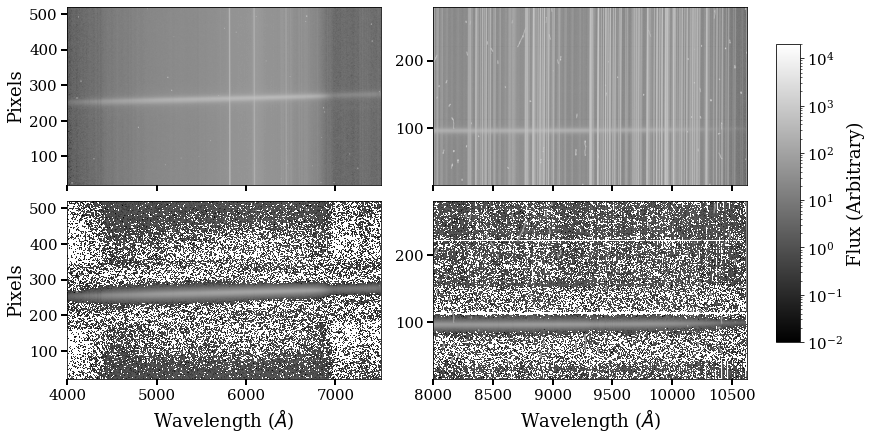

In [76]:
B058_new_blue_file = glob.glob('/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058/blue/keck_lris_blue_*/Science/spec2d*B058*.fits')
B058_new_red_file = glob.glob('/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058/red/keck_lris_red_*/Science/spec2d*B058*.fits')

#Get final data
blue_file = fits.open(B058_new_blue_file[1])
sciimg_blue = blue_file[1].data
skymod_blue = blue_file[3].data
objmod_blue = blue_file[4].data
waveimg_blue = blue_file[8].data
slits_blue = blue_file[10].data
blue_file.close()

#Wavelength solution
for j in range(len(waveimg_blue)):
    for k in range(len(waveimg_blue.T)):
        if waveimg_blue[j][k] == 0.:
            waveimg_blue[j][k] = np.nan
            
red_file = fits.open(B058_new_red_file[0])
sciimg_red = red_file[1].data
skymod_red = red_file[3].data
objmod_red = red_file[4].data
waveimg_red = red_file[8].data
slits_red = red_file[10].data
red_file.close()

for j in range(len(waveimg_red)):
    for k in range(len(waveimg_red.T)):
        if waveimg_red[j][k] == 0.:
            waveimg_red[j][k] = np.nan

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 6), sharex='col', sharey='col', constrained_layout=True)

im = ax[0,0].imshow(sciimg_blue.T, origin='lower', norm=LogNorm(vmin=0.01, vmax=20000), cmap='gray', aspect='auto', 
               extent=[np.nanmin(waveimg_blue), np.nanmax(waveimg_blue), 0, 2000])

ax[0,1].imshow(sciimg_red.T, origin='lower', norm=LogNorm(vmin=0.01, vmax=20000),
               cmap='gray', aspect='auto', extent=[np.nanmin(waveimg_red), np.nanmax(waveimg_red), 0, 1000])

ax[1,0].imshow(sciimg_blue.T - skymod_blue.T, origin='lower', norm=LogNorm(vmin=0.01, vmax=120000), cmap='gray', 
               aspect='auto', extent=[np.nanmin(waveimg_blue), np.nanmax(waveimg_blue), 0, 2000])

ax[1,1].imshow(sciimg_red.T - skymod_red.T, origin='lower', norm=LogNorm(vmin=0.01, vmax=120000), cmap='gray', aspect='auto', 
               extent=[np.nanmin(waveimg_red), np.nanmax(waveimg_red), 0, 1000])

cbar = fig.colorbar(im, ax=ax[:,1], shrink=0.8)
cbar.set_label('Flux (Arbitrary)', fontsize=18)
cbar.ax.tick_params(labelsize=15)

ax[0,0].set_ylim(20, 520)
ax[0,0].set_xlim(4000, np.nanmax(waveimg_blue))
ax[0,1].set_ylim(15, 280)
ax[0,1].set_xlim(8000, np.nanmax(waveimg_red))
ax[0,0].tick_params(length=6, width=2, labelsize=15)
ax[0,1].tick_params(length=6, width=2, labelsize=15)
ax[1,0].tick_params(length=6, width=2, labelsize=15)
ax[1,1].tick_params(length=6, width=2, labelsize=15)
ax[0,0].set_ylabel('Pixels', fontsize=18)
ax[1,0].set_ylabel('Pixels', fontsize=18)
ax[-1,0].set_xlabel('Wavelength ($\AA$)', fontsize=18)
ax[-1,1].set_xlabel('Wavelength ($\AA$)', fontsize=18)
plt.savefig('paper_skysub.pdf', bbox_inches='tight')

# Telluric correction and MAD

In [77]:
#Continuum-normalization functions (also normalizes noise)
def data_ranges(lambda_min, lambda_max, flux, wavelength, noise):
    """Return the data within the desired wavelength range.
    
    Parameters
    ----------
    lambda_min : float
        The lower bound of the wavelength range 
    lambda_max : float
        The upper bound of the wavelength range
    flux : tuple
        The flux data
    wavelength : tuple
        The wavelength data
    noise : tuple
        The noise data
        
    Returns
    -------
    wavelength_inrange : tuple
        The wavelength data within the desired wavelength range
    flux_inrange : tuple
        The flux data within the desired wavelength range
    noise_inrange : tuple
        The noise data within the desired wavelength range
    """
    
    rng = (wavelength >= lambda_min) & (wavelength <= lambda_max)
    wavelength_inrange = wavelength[rng]
    flux_inrange = flux[rng]
    noise_inrange = noise[rng]
    return wavelength_inrange, flux_inrange, noise_inrange

def poly_order(lambda_min, lambda_max):
    """Return the order of the polynomial by which to continuum-normalize the spectrum.
    
    Parameters
    ----------
    lambda_min : float
        The lower bound of the wavelength range
    lambda_max : float
        The upper bound of the wavelength range
        
    Returns
    -------
    (lambda_min/lambda_max)/100 : int
        The order of the polynomial by which to continuum-normalize the spectrum
    """
    
    return int((lambda_max - lambda_min)/100)

def continuum_normalize(lambda_min, lambda_max, flux, wavelength, noise):
    """Return the spectrum normalized by the fitted polynomial shape of the continuum.
    
    Parameters
    ----------
    lambda_min : float
        The lower bound of the wavelength range
    lambda_max : float
        The upper bound of the wavelength range
    flux : tuple
        The flux data
    wavelength: tuple
        The wavelength data
    noise : tuple
        The noise data
        
    Returns
    -------
    wavelength_inrange : tuple
        The wavelength data within the desired wavelength range
    flux_norm : tuple
        The continuum-normalized flux within the desired wavelength range
    noise_norm : tuple
        The continuum-normalized noise within the desired wavelength range
    """
    
    #Get the data in the desired wavelength range
    wavelength_inrange, flux_inrange, noise_inrange = data_ranges(lambda_min, lambda_max, flux, wavelength, noise)
    
    #Get the order of the polynomial 
    n = poly_order(lambda_min, lambda_max)
    
    #Fit an nth-order polynomial to the spectrum
    xrange = np.linspace(np.min(lambda_min), np.max(lambda_max), len(wavelength_inrange))
    polynomial_fit = np.polyfit(xrange, flux_inrange, n)
    poly_obj = np.poly1d(polynomial_fit)
    
    #Divide out the fitted polynomial to get a continuum-normalized spectrum
    flux_norm = flux_inrange/poly_obj(xrange)
    noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
    return wavelength_inrange, flux_norm, noise_norm

def lris_res(lb, lr):
    """Get wavelength dependent resolution.
    
    Parameters
    ----------
    lb, lr : Arrays of blue and red wavelengths in angstroms in vacuum.
    
    Returns
    -------
    resb, resr : Resolution in km/s
    """
    
    resb = 3.09 + 0.187*(lb - 5000.)/1000. #res in A
    resb = resb/lb*3.e5 #res in km/s
    l9 = (lr - 9000.)/1000.
    resr = 1.26 - 0.128*l9 + 0.168*l9**2 + 0.1173*l9**3
    resr = resr/lr*3.E5
    
    return resb, resr

#Blue flexure correction functions (maybe put in a class later, but not necessary yet b/c lack of automation)
#Re-jigged specutils functions
def _resample(resample_method):
    """
    Find the user preferred method of resampling the template spectrum to fit
    the observed spectrum.

    Parameters
    ----------
    resample_method: `string`
        The type of resampling to be done on the template spectrum.

    Returns
    -------
    :class:`~specutils.ResamplerBase`
        This is the actual class that will handle the resampling.
    """
    if resample_method == "flux_conserving":
        return FluxConservingResampler()

    if resample_method == "linear_interpolated":
        return LinearInterpolatedResampler()

    if resample_method == "spline_interpolated":
        return SplineInterpolatedResampler()

    return None

def _normalize_for_template_matching(observed_spectrum, template_spectrum):
    """
    Calculate a scale factor to be applied to the template spectrum so the
    total flux in both spectra will be the same.

    Parameters
    ----------
    observed_spectrum : :class:`~specutils.Spectrum1D`
        The observed spectrum.
    template_spectrum : :class:`~specutils.Spectrum1D`
        The template spectrum, which needs to be normalized in order to be
        compared with the observed spectrum.

    Returns
    -------
    `float`
        A float which will normalize the template spectrum's flux so that it
        can be compared to the observed spectrum.
    """
    num = np.nansum((observed_spectrum.flux*template_spectrum.flux)/
                 (observed_spectrum.uncertainty.array**2))
    denom = np.nansum((template_spectrum.flux/
                    observed_spectrum.uncertainty.array)**2)

    return num/denom

def _chi_square_for_templates(observed_spectrum, template_spectrum, resample_method):
    """
    Resample the template spectrum to match the wavelength of the observed
    spectrum. Then, calculate chi2 on the flux of the two spectra.

    Parameters
    ----------
    observed_spectrum : :class:`~specutils.Spectrum1D`
        The observed spectrum.
    template_spectrum : :class:`~specutils.Spectrum1D`
        The template spectrum, which will be resampled to match the wavelength
        of the observed spectrum.

    Returns
    -------
    normalized_template_spectrum : :class:`~specutils.Spectrum1D`
        The normalized spectrum template.
    chi2 : `float`
        The chi2 of the flux of the observed spectrum and the flux of the
        normalized template spectrum.
    """
    # Resample template
    fluxc_resample = _resample(resample_method)
    template_obswavelength = fluxc_resample(template_spectrum,
                                            observed_spectrum.spectral_axis)

    # Numerator
    num_right = template_obswavelength.flux.value
    num = observed_spectrum.flux.value - num_right

    # Denominator
    denom = observed_spectrum.uncertainty.array * observed_spectrum.flux.unit

    # Get chi square
    result = (num/denom)**2
    chi2 = np.nansum(result.value)

    # Create normalized template spectrum, which will be returned with
    # corresponding chi2
    normalized_template_spectrum = Spectrum1D(
        spectral_axis=template_spectrum.spectral_axis,
        flux=template_spectrum.flux)

    return normalized_template_spectrum, chi2

def template_redshift(observed_spectrum, template_spectrum, redshift):
    """
    Find the best-fit redshift for template_spectrum to match observed_spectrum using chi2.

    Parameters
    ----------
    observed_spectrum : :class:`~specutils.Spectrum1D`
        The observed spectrum.
    template_spectrum : :class:`~specutils.Spectrum1D`
        The template spectrum, which will have it's redshift calculated.
    redshift : `float`, `int`, `list`, `tuple`, 'numpy.array`
        A scalar or iterable with the redshift values to test.

    Returns
    -------
    final_redshift : `float`
        The best-fit redshift for template_spectrum to match the observed_spectrum.
    redshifted_spectrum: :class:`~specutils.Spectrum1D`
        A new Spectrum1D object which incorporates the template_spectrum with a spectral_axis
        that has been redshifted using the final_redshift.
    chi2_list : `list`
        A list with the chi2 values corresponding to each input redshift value.
    """
    chi2_min = None
    final_redshift = None
    chi2_list = []

    redshift = np.array(redshift).reshape((np.array(redshift).size,))

    # Loop which goes through available redshift values and finds the smallest chi2
    for rs in redshift:

        # Create new redshifted spectrum and run it through the chi2 method
        redshifted_spectrum = Spectrum1D(spectral_axis=template_spectrum.spectral_axis*(1+rs),
                        flux=template_spectrum.flux, uncertainty=template_spectrum.uncertainty,
                                         meta=template_spectrum.meta)
        normalized_spectral_template, chi2 = _chi_square_for_templates(observed_spectrum, redshifted_spectrum, 
                                                                       'flux_conserving')

        chi2_list.append(chi2)

        # Set new chi2_min if suitable replacement is found - added line here b/c not returning final redshifted spectrum
        if not np.isnan(chi2) and (chi2_min is None or chi2 < chi2_min):
            chi2_min = chi2
            final_redshift = rs
            final_spectrum = redshifted_spectrum

    return final_redshift, chi2_min, final_spectrum, chi2_list

def smooth_general(lris_resolution, data_resolution, wave, flux, noise):
    c = 299792.458 #speed of light in km/s
    sigma_aa_desired = lris_resolution/c*wave
    sigma_aa_original = data_resolution
    delta_sigma_aa_vector = np.sqrt(sigma_aa_desired**2 - sigma_aa_original**2)
    smoothed_flux = utils.smoothing.smoothspec(wave, flux, outwave=wave, smoothtype='lsf', resolution=delta_sigma_aa_vector, 
                                               fftsmooth=True)
    smoothed_noise = utils.smoothing.smoothspec(wave, noise, outwave=wave, smoothtype='lsf', resolution=delta_sigma_aa_vector, 
                                                fftsmooth=True)
    return smoothed_flux, smoothed_noise

def prep_data(data_path, spec_type):
    #Import co-added spectrum with no flexure correction
    data_file = fits.open(data_path)
    if spec_type == 'coadd':
        data_wave_full = data_file[1].data['wave']
        data_flux_full = data_file[1].data['flux']
        data_noise_full = data_file[1].data['ivar']
    else:
        data_wave_full = data_file[1].data['OPT_WAVE']
        data_flux_full = data_file[1].data['OPT_COUNTS']
        data_noise_full = data_file[1].data['OPT_COUNTS_IVAR']
    data_file.close()

    #Limit to useful range
    data_cut_wave = data_wave_full[(data_wave_full >= 4000) & (data_wave_full <= 6800)]
    data_cut_flux = data_flux_full[(data_wave_full >= 4000) & (data_wave_full <= 6800)]
    data_cut_noise = data_noise_full[(data_wave_full >= 4000) & (data_wave_full <= 6800)]

    return data_wave_full, data_cut_wave, data_flux_full, data_cut_flux, data_noise_full, data_cut_noise

def prep_template(template_path):
    #Import template
    template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+', 
                                names=['wavelength', 'flux', 'noise', 'weight', 'resolution'], index_col=None)
    template_flux = template_file['flux'].values[(template_file['wavelength'].values >= 4000) & \
                                                 (template_file['wavelength'].values <= 6800)]
    template_wave = template_file['wavelength'].values[(template_file['wavelength'].values >= 4000) & \
                                                       (template_file['wavelength'].values <= 6800)]
    template_noise = np.zeros(len(template_wave))
    template_resolution = template_file['resolution'].values[(template_file['wavelength'].values >= 4000) & \
                                                             (template_file['wavelength'].values <= 6800)]

    #Calculate desired resolution for data template (Keck resolution)
    resb_template, resr_template = lris_res(template_wave, np.nan)

    #Smooth the template 
    smoothed_template_flux, smoothed_template_noise = smooth_general(resb_template, template_resolution, template_wave, 
                                                                     template_flux, template_noise)
    return template_wave, smoothed_template_flux, smoothed_template_noise

def test_pre_full(data_path, template_path, z_lit, z_bound, spec_type):
    #Import data
    data_wave_full, data_cut_wave, data_flux_full, data_cut_flux, data_noise_full, data_cut_noise = prep_data(data_path, 
                                                                                                              spec_type)

    #Import smoothed template
    template_wave, smoothed_template_flux, smoothed_template_noise = prep_template(template_path)

    #Continuum normalize over whole wavelength range
    norm_data_wave, norm_data_flux, norm_data_noise = continuum_normalize(np.min(data_cut_wave), np.max(data_cut_wave), 
                                                                          data_cut_flux, data_cut_wave, data_cut_noise)
    norm_template_wave, norm_template_flux, norm_template_noise = continuum_normalize(np.min(template_wave), 
                                                                                      np.max(template_wave),
                                                                                      smoothed_template_flux, template_wave, 
                                                                                      smoothed_template_noise)

    #Put spectra into Spectrum1D objects
    data_spec = Spectrum1D(spectral_axis=norm_data_wave*u.Angstrom, flux=norm_data_flux*(u.erg/u.s/u.cm**2/u.Angstrom),
                           uncertainty=StdDevUncertainty(norm_data_noise))
    template_spec = Spectrum1D(spectral_axis=norm_template_wave*u.Angstrom, flux=norm_template_flux*(u.Lsun/u.micron))

    #Plot before
    plt.figure(figsize=(12,4))
    plt.plot(data_spec.spectral_axis, data_spec.flux, label='observed')
    plt.plot(template_spec.spectral_axis, template_spec.flux, label='template')
    plt.legend()
    plt.show()

    redshifts = np.linspace(z_lit-z_bound, z_lit+z_bound, 1000)
    tm_result = template_redshift(observed_spectrum=data_spec, template_spectrum=template_spec, redshift=redshifts)

    #Plot after
    plt.figure(figsize=(12,4))
    plt.plot(data_spec.spectral_axis, data_spec.flux, label='observed')
    plt.plot(tm_result[2].spectral_axis, tm_result[2].flux, label='redshifted template')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12,4))
    plt.plot(template_spec.spectral_axis, template_spec.flux, label='template')
    plt.plot(tm_result[2].spectral_axis, tm_result[2].flux, label='redshifted template')
    plt.legend()
    plt.show()
    return tm_result[0], tm_result[1]

def data_chunks(data_wave, data_flux, data_noise, targ_delta):
    #Chunk data
    #Turn arrays into lists
    wave_arr = list(data_wave)
    flux_arr = list(data_flux)
    noise_arr = list(data_noise)

    wave_chunks = []
    flux_chunks = []
    noise_chunks = []

    #Initialize counters
    i = wave_arr[0]
    k = 0
    for elem in wave_arr:
        elem_delta = elem - i
        if elem_delta >= targ_delta: #If difference is 220A
            end_ind = wave_arr.index(elem) + 1 #Find ending index
            wave_chunks.append(np.array(wave_arr[k:end_ind])) #Append appropriate values
            flux_chunks.append(np.array(flux_arr[k:end_ind]))
            noise_chunks.append(np.array(noise_arr[k:end_ind]))

            #Re-initialize counters
            i = wave_arr[end_ind]
            k = end_ind
    else: #Get the end of the arrays that won't be 220A wide
        wave_chunks.append(np.array(wave_arr[k:]))
        flux_chunks.append(np.array(flux_arr[k:]))
        noise_chunks.append(np.array(noise_arr[k:]))

    #Normalize chunks
    normed_data = []
    norm_wave_chunks = []
    norm_flux_chunks = []
    norm_noise_chunks = []
    for i in range(len(wave_chunks)):
        normed_data.append(continuum_normalize(np.min(wave_chunks[i]), np.max(wave_chunks[i]), flux_chunks[i], wave_chunks[i], 
                                               noise_chunks[i]))
        norm_wave_chunks.append(normed_data[i][0])
        norm_flux_chunks.append(normed_data[i][1])
        norm_noise_chunks.append(normed_data[i][2])

    return norm_wave_chunks, norm_flux_chunks, norm_noise_chunks

def template_chunks(data_wave, data_flux, data_noise, template_path, z_lit, targ_delta, overhang, position):
    #Import smoothed template
    template_wave, smoothed_template_flux, smoothed_template_noise = prep_template(template_path)

    #Get data chunks
    data_wave_chunks, data_flux_chunks, data_noise_chunks = data_chunks(data_wave, data_flux, data_noise, targ_delta)

    #Chunk template
    #Find the central wavelength in each bin
    central_wavelengths = np.zeros(len(data_wave_chunks))
    for i in range(len(data_wave_chunks)):
        central_wavelengths[i] = np.median(data_wave_chunks[i])

    if position == 'before':
        dered_central_wavelengths = central_wavelengths/(1+z_lit)
    else:
        dered_central_wavelengths = central_wavelengths

    #Get the bounds of the template chunks (with overhang)
    template_wave_bounds = []
    for i in range(len(data_wave_chunks)):
        template_wave_bounds.append([dered_central_wavelengths[i] - (np.max(data_wave_chunks[i]) - \
                                                               np.min(data_wave_chunks[i]))/2  - overhang, 
                                     dered_central_wavelengths[i] + (np.max(data_wave_chunks[i]) - \
                                                               np.min(data_wave_chunks[i]))/2 + overhang])

    #Chunk the template based on these bounds
    template_wave_chunks = []
    template_flux_chunks = []
    template_noise_chunks = []
    for i in range(len(template_wave_bounds)):
        template_wave_chunks.append(template_wave[(template_wave >= template_wave_bounds[i][0]) & \
                                                  (template_wave <= template_wave_bounds[i][-1])])
        template_flux_chunks.append(smoothed_template_flux[(template_wave >= template_wave_bounds[i][0]) & \
                                                  (template_wave <= template_wave_bounds[i][-1])])
        template_noise_chunks.append(np.zeros(len(template_wave_chunks[i])))

    #Normalize the template chunks
    normed_template_data = []
    norm_temp_wave_chunks = []
    norm_temp_flux_chunks = []
    norm_temp_noise_chunks = []
    for i in range(len(template_wave_chunks)):
        normed_template_data.append(continuum_normalize(np.min(template_wave_chunks[i]), np.max(template_wave_chunks[i]), 
                                                        template_flux_chunks[i], template_wave_chunks[i], 
                                                        template_noise_chunks[i]))
        norm_temp_wave_chunks.append(normed_template_data[i][0])
        norm_temp_flux_chunks.append(normed_template_data[i][1])
        norm_temp_noise_chunks.append(normed_template_data[i][2])

    #Get centre of each template chunk and redshift it
    temp_central_wavelengths = np.zeros(len(norm_temp_wave_chunks))
    for i in range(len(norm_temp_wave_chunks)):
        temp_central_wavelengths[i] = np.median(norm_temp_wave_chunks[i])*(1+z_lit)

    return norm_temp_wave_chunks, norm_temp_flux_chunks, norm_temp_noise_chunks, temp_central_wavelengths, central_wavelengths

def QA_chunks(data_wave_chunks, data_flux_chunks, temp_wave_chunks, temp_flux_chunks):
    #Plot
    for i in range(len(data_wave_chunks)):
        plt.figure()
        plt.plot(data_wave_chunks[i], data_flux_chunks[i], label='observed')
        plt.plot(temp_wave_chunks[i], temp_flux_chunks[i], label='template')
        plt.legend()

def chunk_redshift(data_wave, data_flux, data_noise, template_path, z_lit, targ_delta, overhang, z_test, z_bound, position):
    #Get data chunks
    data_wave_chunks, data_flux_chunks, data_noise_chunks = data_chunks(data_wave, data_flux, data_noise, targ_delta)

    #Get template_chunks 
    temp_wave_chunks, temp_flux_chunks, temp_noise_chunks, temp_central_wavelengths, central_waves = template_chunks(data_wave, 
                                                                                                                     data_flux,
                                                                                                      data_noise, template_path,
                                                                                                      z_lit, targ_delta,
                                                                                                      overhang, position)

    #Find redshifts of each chunk
    observed_chunks = []
    temp_chunks = []
    for i in range(len(data_wave_chunks)):
        observed_chunks.append(Spectrum1D(spectral_axis=data_wave_chunks[i]*u.Angstrom, 
                                          flux=data_flux_chunks[i]*(u.erg/u.s/u.cm**2/u.Angstrom), 
                                          uncertainty=InverseVariance(data_noise_chunks[i])))
        temp_chunks.append(Spectrum1D(spectral_axis=temp_wave_chunks[i]*u.Angstrom, 
                                 flux=temp_flux_chunks[i]*(u.Lsun/u.micron),
                                 uncertainty=StdDevUncertainty(temp_noise_chunks[i])))

    redshifts_chunks = np.linspace(z_test-z_bound, z_test+z_bound, 1000)
    fitted_redshift_results = []
    bestfit_redshift = np.zeros(len(data_wave_chunks))
    best_chi2 = np.zeros(len(data_wave_chunks))
    redshifted_spectra = []
    chi2 = []
    for i in range(len(data_wave_chunks)):
        fitted_redshift_results.append(template_redshift(observed_spectrum=observed_chunks[i], 
                                                            template_spectrum=temp_chunks[i],
                                                            redshift=redshifts_chunks))
        bestfit_redshift[i] = fitted_redshift_results[i][0]
        best_chi2[i] = fitted_redshift_results[i][1]
        redshifted_spectra.append(fitted_redshift_results[i][2])
        chi2.append(fitted_redshift_results[i][3])
    return bestfit_redshift, best_chi2, redshifted_spectra, chi2

def fit_errors(bestfit_redshift, central_wavelengths):
    c = 299792.458 #speed of light in km/s
    #Calculate errors in Angstroms
    errors_A = bestfit_redshift*central_wavelengths 

    #Fit a straight line to the errors
    fit = np.polyfit(central_wavelengths, errors_A, 1)
    fit_z = np.polyfit(central_wavelengths, bestfit_redshift, 1)
    fit_kms = np.polyfit(central_wavelengths, errors_A/central_wavelengths*c, 1)

    error_func = np.poly1d(fit)
    error_func_z = np.poly1d(fit_z)
    error_func_kms = np.poly1d(fit_kms)
    return fit, fit_z, fit_kms, error_func, error_func_z, error_func_kms, errors_A

def QA_fit(bestfit_redshift, central_wavelengths):
    fit, fit_z, fit_kms, error_func, error_func_z, error_func_kms, errors_A = fit_errors(bestfit_redshift, central_wavelengths)

    c = 299792.458 #speed of light in km/s
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
    fig.set_tight_layout(True)
    #Plot in z
    ax[0].plot(central_wavelengths, bestfit_redshift, linestyle='None', marker='.', markersize=30, mew=2, mec='w', color='k',
               alpha=0.8)
    ax[0].plot(central_wavelengths, error_func_z(central_wavelengths), color='k')
    ax[0].tick_params(length=6, width=2, labelsize=12)
    ax[0].set_xlabel('Wavelength ($\AA$)', fontsize=15)
    ax[0].set_ylabel('Error (z)', fontsize=15)

    #Plot in Angstroms
    ax[1].plot(central_wavelengths, errors_A, linestyle='None', marker='.', markersize=30, mew=2, mec='w', color='k', alpha=0.8)
    ax[1].plot(central_wavelengths, error_func(central_wavelengths), color='k')
    ax[1].tick_params(length=6, width=2, labelsize=12)
    ax[1].set_xlabel('Wavelength ($\AA$)', fontsize=15)
    ax[1].set_ylabel('Error ($\Delta\AA$)', fontsize=15)

    #Plot in km/s
    ax[2].plot(central_wavelengths, errors_A/central_wavelengths*c, linestyle='None', marker='.', markersize=30, mew=2, mec='w',
               color='k', alpha=0.8)
    ax[2].plot(central_wavelengths, error_func_kms(central_wavelengths), color='k')
    ax[2].tick_params(length=6, width=2, labelsize=12)
    ax[2].set_xlabel('Wavelength ($\AA$)', fontsize=15)
    ax[2].set_ylabel('Error ($\Delta$ km/s)', fontsize=15)

def flexure_function(fit, z_lit, wave):
    #Solve coefficients
    c = fit[0]
    d = fit[1]

    a = d
    b = (c - z_lit)/(1+z_lit)

    corr_factor = (b*wave + a)/(1 + b)
    wave_corr = wave - corr_factor

    #Check if monotonic
    print('Montonic: ', np.all(np.diff(wave_corr) > 0))
    return corr_factor, wave_corr, a, b

def flexure_QA(wave, wave_corr):
    plt.figure(figsize=(8,7))
    plt.plot(wave, label='original', lw=3)
    plt.plot(wave_corr, label='corrected', linestyle='dashed')
    plt.legend()
    plt.ylabel('Wavelength ($\AA$)')
    plt.xlabel('Pixel')

def dered_corr(data_path, template_path, wave_corr, z_lit, z_bound, spec_type):
    #Get data
    data_wave_full, data_cut_wave, data_flux_full, data_cut_flux, data_noise_full, data_cut_noise = prep_data(data_path,
                                                                                                             spec_type)

    #Get template
    template_wave, smoothed_template_flux, smoothed_template_noise = prep_template(template_path)

    #Find redshift of new, corrected spectrum and de-redshift it to match the template
    #Continuum-norm over whole blue range
    norm_wave_corr, norm_corr_flux, norm_corr_noise = continuum_normalize(np.min(wave_corr), np.max(wave_corr), data_cut_flux, 
                                                                          wave_corr, data_cut_noise)
    norm_template_wave, norm_template_flux, norm_template_noise = continuum_normalize(np.min(template_wave), 
                                                                                      np.max(template_wave), 
                                                                                      smoothed_template_flux, template_wave, 
                                                                                      smoothed_template_noise)

    #Plot before
    plt.figure(figsize=(12,4))
    plt.plot(norm_wave_corr, norm_corr_flux, label='observed')
    plt.plot(norm_template_wave, norm_template_flux, label='template')
    plt.legend()

    #Find new redshift of whole spectrum
    corr_spec = Spectrum1D(spectral_axis=norm_wave_corr*u.Angstrom, flux=norm_corr_flux*(u.erg/u.s/u.cm**2/u.Angstrom),
                           uncertainty=StdDevUncertainty(norm_corr_noise))
    template_spec = Spectrum1D(spectral_axis=norm_template_wave*u.Angstrom, flux=norm_template_flux*(u.Lsun/u.micron))

    pre_redshifts = np.linspace(z_lit-z_bound, z_lit+z_bound, 1000)
    tm_result_corr = template_redshift(observed_spectrum=corr_spec, template_spectrum=template_spec, redshift=pre_redshifts)

    #Plot after
    plt.figure(figsize=(12,4))
    plt.plot(corr_spec.spectral_axis, corr_spec.flux, label='observed')
    plt.plot(tm_result_corr[2].spectral_axis, tm_result_corr[2].flux, label='redshifted template')
    plt.legend()
    #plt.savefig('debug_after_corr.png', bbox_inches='tight')

    plt.figure(figsize=(12,4))
    plt.plot(template_spec.spectral_axis, template_spec.flux, label='template')
    plt.plot(tm_result_corr[2].spectral_axis, tm_result_corr[2].flux, label='redshifted template')
    plt.legend()

    #De-redshift data
    dered_wave = norm_wave_corr/(1+z_lit)

    plt.figure(figsize=(12,4))
    plt.plot(dered_wave, norm_corr_flux, label='de-redshifted data')
    plt.plot(norm_template_wave, norm_template_flux, label='template')
    plt.legend()
    #plt.savefig('debug_dered.png', bbox_inches='tight')
    return tm_result_corr, dered_wave

#Red flexure correction functions (no class for now)
def read_1dspec(filename):
    file = fits.open(filename)
    data = file[1].data
    file.close()
    
    wave = data['OPT_WAVE']
    sky_flux = data['OPT_COUNTS_SKY']
    return wave, sky_flux

def read_skymod(filename):
    file = fits.open(filename)
    sky_flux = file[0].data
    wave = file[1].data
    file.close()
    return wave, sky_flux
    
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]
        
def gaussian(x, a, x0, sigma, d):
    return a*np.exp(-(x-x0)**2/(2*sigma**2)) + d

def data_resolution(sky_wave, sky_flux):
    #Find FWHM of 4 lines across the spectrum and take the mean to find the resolution 
    line1 = [5575, 5585]
    line2 = [6300, 6305]
    line3 = [8346, 8348]
    line4 = [9377, 9380]

    line1_wave, line1_flux, line1_noise = continuum_normalize(line1[0], line1[-1], sky_flux, sky_wave, np.zeros_like(sky_flux))
    n_line1 = len(line1_wave)
    mean_line1 = np.mean(line1_wave)
    std_line1 = np.std(line1_wave)
    popt_line1, pcov_line1 = curve_fit(gaussian, line1_wave, line1_flux, p0=[np.max(line1_flux), mean_line1, std_line1, 0])
    FWHM_line1 = 2*np.sqrt(2*np.log(2))*np.abs(popt_line1[2])

    line2_wave, line2_flux, line2_noise = continuum_normalize(line2[0], line2[-1], sky_flux, sky_wave, np.zeros_like(sky_flux))
    n_line2 = len(line2_wave)
    mean_line2 = np.mean(line2_wave)
    std_line2 = np.std(line2_wave)
    popt_line2, pcov_line2 = curve_fit(gaussian, line2_wave, line2_flux, p0=[np.max(line2_flux), mean_line2, std_line2, 0])
    FWHM_line2 = 2*np.sqrt(2*np.log(2))*np.abs(popt_line2[2])

    line3_wave, line3_flux, line3_noise = continuum_normalize(line3[0], line3[-1], sky_flux, sky_wave, np.zeros_like(sky_flux))
    n_line3 = len(line3_wave)
    mean_line3 = np.mean(line3_wave)
    std_line3 = np.std(line3_wave)
    popt_line3, pcov_line3 = curve_fit(gaussian, line3_wave, line3_flux, p0=[np.max(line3_flux), mean_line3, std_line3, 0])
    FWHM_line3 = 2*np.sqrt(2*np.log(2))*np.abs(popt_line3[2])

    line4_wave, line4_flux, line4_noise = continuum_normalize(line4[0], line4[-1], sky_flux, sky_wave, np.zeros_like(sky_flux))
    n_line4 = len(line4_wave)
    mean_line4 = np.mean(line4_wave)
    std_line4 = np.std(line4_wave)
    popt_line4, pcov_line4 = curve_fit(gaussian, line4_wave, line4_flux, p0=[np.max(line4_flux), mean_line4, std_line4, 0])
    FWHM_line4 = 2*np.sqrt(2*np.log(2))*np.abs(popt_line4[2])
    
    R_red = np.mean((FWHM_line1, FWHM_line2, FWHM_line3, FWHM_line4))
    return R_red

def smooth_red(sky_wave, sky_flux):
    desired_blue_res, desired_red_res = lris_res(sky_wave[sky_wave <= 7000], sky_wave[sky_wave > 7000])
    desired_res = np.concatenate((desired_blue_res, desired_red_res))
    c = 299792.458 #speed of light
    
    #Smooth red 
    R_red = data_resolution(sky_wave, sky_flux)
    in_sigma_kms_red = (R_red/sky_wave)*c
    smoothed_sky_flux, smoothed_sky_noise = smooth_general(desired_res, in_sigma_kms_red/c*sky_wave, sky_wave, sky_flux, 
                                                           np.zeros_like(sky_flux))
    return smoothed_sky_flux, smoothed_sky_noise

def sky_centroids(sky_wave, smoothed_sky_flux, smoothed_sky_noise):
    #Normalize sky model
    sky_norm_wave, sky_norm_flux, sky_norm_noise = continuum_normalize(np.min(sky_wave), np.max(sky_wave), smoothed_sky_flux, 
                                                                       sky_wave, smoothed_sky_noise)
    
    #Find centroids of skylines in model
    centroids = [7843, 7916, 7995.5, 8347, 8467, 8829.5, 8922, 9378, 9442, 9794]
    sky_bounds = [[7835, 7850], [7908, 7920], [7990, 8000], [8340, 8353], [8460, 8475], [8820, 8835], [8915, 8930], 
                      [9370, 9385], [9435, 9447], [9785, 9799]]

    sky = Spectrum1D(spectral_axis=sky_norm_wave*u.Angstrom, flux=sky_norm_flux*u.ct)
    regions_sky = []
    for i in range(len(sky_bounds)):
        regions_sky.append(SpectralRegion(sky_bounds[i][0]*u.Angstrom, sky_bounds[i][-1]*u.Angstrom))

    sky_cents = centroid(sky, regions_sky)
    return sky_cents

def centroid_offsets(targ_bounds, data_wave, data_flux, sky_cents):
    regions = SpectralRegion(targ_bounds[0][0]*u.Angstrom,targ_bounds[0][-1]*u.Angstrom)
    for i in range(1, len(targ_bounds)):
        regions += SpectralRegion(targ_bounds[i][0]*u.Angstrom, targ_bounds[i][-1]*u.Angstrom)

    #Normalize data
    targ_norm_wave, targ_norm_flux, targ_norm_noise = continuum_normalize(np.min(data_wave), np.max(data_wave), data_flux, 
                                                                          data_wave, np.zeros(len(data_flux)))
    
    
    #Find offsets
    target = Spectrum1D(spectral_axis=targ_norm_wave*u.Angstrom, flux=targ_norm_flux*u.ct)
    sub_spec = extract_region(target, regions)
    offsets = np.zeros(len(sky_cents))
    nearest_waves = np.zeros(len(sky_cents))
    for i, sub in enumerate(sub_spec):
        an_disp = sub.flux.max()
        an_ampl = sub.flux.min()
        an_mean = sub.spectral_axis[sub.flux.argmax()]
        nearest_waves[i] = an_mean.value
        an_stdv = np.sqrt(np.sum((sub.spectral_axis - an_mean)**2) / (len(sub.spectral_axis) - 1))

        plt.figure()
        plt.scatter(an_mean.value, an_disp.value, marker='o', color='#e41a1c', s=100, label='data')
        plt.scatter(sky_cents[i], an_disp.value, marker='o', color='k', s=100, label='archive')
        plt.vlines([an_mean.value - an_stdv.value, an_mean.value + an_stdv.value],
                    sub.flux.min().value, sub.flux.max().value,
                    color='#377eb8', ls='--', lw=2)
        g_init = ( models.Const1D(an_disp) +
                  models.Gaussian1D(amplitude=(an_ampl - an_disp),
                                mean=an_mean, stddev=an_stdv) )
        g_fit = fit_lines(sub, g_init)
        line_fit = g_fit(sub.spectral_axis)
        plt.plot(sub.spectral_axis, sub.flux, color='#e41a1c', lw=2)
        plt.plot(sub.spectral_axis, line_fit, color='#377eb8', lw=2)

        plt.axvline(an_mean.value, color='#e41a1c', ls='--', lw=2)
        plt.legend()
        offsets[i] = an_mean.value - sky_cents[i].value
    return nearest_waves, offsets

def offset_fit(nearest_waves, offsets):
    c = 299792.458 #speed of light
    fit = np.polyfit(nearest_waves, offsets, 1)
    fit_kms = np.polyfit(nearest_waves, offsets/nearest_waves*c, 1)

    fit_func = np.poly1d(fit)
    fit_func_kms = np.poly1d(fit_kms)
    return fit, fit_kms, fit_func, fit_func_kms

def QA_offset_fit(nearest_waves, offsets):
    fit, fit_kms, fit_func, fit_func_kms = offset_fit(nearest_waves, offsets)
    c = 299792.458 #speed of light
    
    #Plot
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
    fig.set_tight_layout(True)
    
    #In Angstroms
    ax[0].plot(nearest_waves, offsets, linestyle='None', marker='.', markersize=30, mew=2, mec='w', alpha=0.8, color='k')
    ax[0].plot(nearest_waves, fit_func(nearest_waves), color='k', alpha=0.8)
    ax[0].tick_params(length=6, width=2, labelsize=12)
    ax[0].set_xlabel('Wavelength ($\AA$)', fontsize=15)
    ax[0].set_ylabel('Error ($\AA$)', fontsize=15)
    
    #In km/s
    ax[1].plot(nearest_waves, offsets/nearest_waves*c, linestyle='None', marker='.', markersize=30, mew=2, mec='w', 
             alpha=0.8, color='k')
    ax[1].plot(nearest_waves, fit_func_kms(nearest_waves), color='k', alpha=0.8)
    ax[1].tick_params(length=6, width=2, labelsize=12)
    ax[1].set_xlabel('Wavelength ($\AA$)', fontsize=20)
    ax[1].set_ylabel('Error (km/s)', fontsize=20)
    
def fit_interp(data_wave, data_flux, data_noise, nearest_waves, fit_func):
    
    #Interpolate fits over wavelength range
    error_func = interp1d(nearest_waves, fit_func(nearest_waves), fill_value='extrapolate')
    corr_factor = error_func(data_wave)
    
    #Add correction factor to wavelength array
    wave_corr = data_wave - corr_factor
    
    #Make sure new wavelength arrays are monotonically increasing
    plt.figure(figsize=(8,7))
    plt.plot(data_wave, label='original', lw=3)
    plt.plot(wave_corr, label='corrected', linestyle='dashed')
    plt.xlabel('Pixel')
    plt.legend()
    plt.ylabel('Wavelength ($\AA$)')

    print('Monotonic: ', np.all(np.diff(wave_corr) > 0))
    return wave_corr

In [78]:
import numpy as np
import matplotlib.pyplot as plt
import astropy.io.fits as fits
import sys
import glob
from sedpy.observate import air2vac
from prospect import utils
from scipy.interpolate import interp1d
import scipy.optimize as op
from scipy.stats import chisquare
import pandas as pd

font = {'family':'serif',
        'weight':'normal',
        'size':20
}
plt.rc('font',**font)

#Alexa's wavelength-dependent resolution function
def lris_res(lb, lr):
    """Get wavelength dependent resolution.
    
    Parameters
    ----------
    lb, lr : Arrays of blue and red wavelengths in angstroms in vacuum.
    
    Returns
    -------
    resb, resr : Resolution in km/s
    """
    
    resb = 3.09 + 0.187*(lb - 5000.)/1000. #res in A
    resb = resb/lb*3.e5 #res in km/s
    l9 = (lr - 9000.)/1000.
    resr = 1.26 - 0.128*l9 + 0.168*l9**2 + 0.1173*l9**3
    resr = resr/lr*3.E5
    
    return resb, resr
    
    
def normalize(wavelength, flux):
    """Return a normalized spectrum using a 4th-order polynomial (used old continuum-normalization code
    as a model).
    
    Parameters
    ----------
    wavelength : tuple
        Wavelength array
    flux : tuple
        Flux array
        
    Returns
    -------
    flux_norm : tuple
        Normalized flux
    """
    
    #Fit a 4th-order polynomial to the spectrum
    lambda_min = np.min(wavelength)
    lambda_max = np.min(wavelength)
    xrange = np.linspace(np.min(lambda_min), np.max(lambda_max), len(wavelength))
    polynomial_fit = np.polyfit(xrange, flux, 4)
    poly_obj = np.poly1d(polynomial_fit)
    
    #Divide out the fitted polynomial to get a continuum-normalized spectrum
    flux_norm = flux/poly_obj(xrange)
    
    return flux_norm
    
    
def minimization(f, correction_template_flux, correction_gal_flux):
	"""Minimization for scipy.optimize.minimize to find the scale factor between the template and target spectra.
	
	Parameters
	----------
	f : float
		Initial guess for scale factor
	correction_template_flux : tuple
		Flux array over minimization range for the template
	correction_gal_flux : tuple
		Flux array over minimization range for target
		
	Returns
	-------
	np.max(np.abs(correction_gal_flux - Tf)) : float
		The maximum absolute difference between the target flux and scaled template flux
	"""
	
	#Scale the template flux 
	Tf = 1 + f*(correction_template_flux - 1)
	
	#Minimize
	return np.max(np.abs(correction_gal_flux - Tf))
    
    
def Tf(f, T0):
    """Return the scaled template spectrum.
    
    Parameters
    ----------
    f : float
        Scale parameter
    T0 : tuple
        Template atmospheric transmission spectrum
    
    Returns
    -------
    1 + f*(T0 - 1) : tuple
        Scaled template spectrum
    """
    
    return 1 + f*(T0 - 1)

def telluric_correction(blue_path, red_path, template_wave, template_flux, target_blue_wave, target_red_wave):
    """Return the tellurically-corrected flux and corresponding wavelength for a reduced object.

    Parameters
    ----------
    blue_path : str
        Path to the blue coadded spectrum
    red_path : str
        Path to the red coadded spectrum

    Returns
    -------
    total_target_wave : tuple
        Wavelength array
    telluric_corrected_flux : tuple
        Tellurically-corrected flux array
    """

    #Import co-added target spectra
    blue_coadd1d = fits.open(blue_path)
    blue_dat = blue_coadd1d[1].data
    blue_coadd1d.close()

    red_coadd1d = fits.open(red_path)
    red_dat = red_coadd1d[1].data
    red_coadd1d.close()

    #Get wavelengths and fluxes for target and template
    #target_blue_wave = blue_dat['wave']
    #target_red_wave = red_dat['wave']
    target_blue_flux = blue_dat['flux']
    target_red_flux = red_dat['flux']
    target_blue_ivar = blue_dat['ivar']
    target_red_ivar = red_dat['ivar']
    target_noise = 1/np.sqrt(np.concatenate((target_blue_ivar, target_red_ivar)))

    template_blue_wave = template_wave[(template_wave >= np.min(target_blue_wave)) & (template_wave <= np.max(target_blue_wave))]
    template_red_wave = template_wave[(template_wave >= np.min(target_red_wave)) & (template_wave <= np.max(target_red_wave))]
    template_blue_flux = template_flux[(template_wave >= np.min(target_blue_wave)) & (template_wave <= np.max(target_blue_wave))]
    template_red_flux = template_flux[(template_wave >= np.min(target_red_wave)) & (template_wave <= np.max(target_red_wave))]

    #Get resolution using wavelength ranges from target object
    resb_template, resr_template = lris_res(template_blue_wave, template_red_wave)

    #Concatenate into one wavelength range
    total_template_res = np.concatenate((resb_template, resr_template))
    total_template_wave = np.concatenate((template_blue_wave, template_red_wave))
    total_template_flux = np.concatenate((template_blue_flux, template_red_flux))
    total_target_wave = np.concatenate((target_blue_wave, target_red_wave))
    total_target_flux = np.concatenate((target_blue_flux, target_red_flux))

    #Convert telluric resolution to km/s
    c = 299792.458 #speed of light
    R = 20000 #instrument resolution
    inval = total_template_wave/R
    in_sigma = inval/2.*np.sqrt(2.*np.log(2))
    in_sigma_kms = (in_sigma/total_template_wave)*c

    #Smooth template spectrum
    sigma_aa_desired = total_template_res/c*total_template_wave
    sigma_aa_original = in_sigma_kms/c*total_template_wave
    delta_sigma_aa_vector = np.sqrt(sigma_aa_desired**2 - sigma_aa_original**2)
    smoothed_template_flux = utils.smoothing.smoothspec(total_template_wave, total_template_flux, outwave=total_template_wave, smoothtype='lsf', resolution=delta_sigma_aa_vector, fftsmooth=True)

    #Re-grid template spectrum by interpolating onto target wavelength grid
    regrid_template_flux = np.interp(total_target_wave, total_template_wave, smoothed_template_flux)

    #Normalize the target and template spectra over 9250-9650A
    normrange_wave = total_target_wave[(total_target_wave >= 9250) & (total_target_wave <= 9650)]
    normrange_target_flux = total_target_flux[(total_target_wave >= 9250) & (total_target_wave <= 9650)]
    normrange_template_flux = regrid_template_flux[(total_target_wave >= 9250) & (total_target_wave <= 9650)]
    normed_template_flux = normalize(normrange_wave, normrange_template_flux)
    normed_target_flux = normalize(normrange_wave, normrange_target_flux)

    #Do the minimization over 9320-9380A
    correction_wave = normrange_wave[(normrange_wave >= 9320) & (normrange_wave <= 9380)]
    correction_template_flux = normed_template_flux[(normrange_wave >= 9320) & (normrange_wave <= 9380)]
    correction_target_flux = normed_target_flux[(normrange_wave >= 9320) & (normrange_wave <= 9380)]

    x0 = 1 #Initial guess
    res = op.minimize(minimization, x0, args=(correction_template_flux, correction_target_flux), method='Nelder-Mead', tol=1e-6)
    #print(res)

    #Get the chi-squared value for the fit
    corrected_template_flux = Tf(res.x, correction_template_flux)
    residuals = ((correction_target_flux - corrected_template_flux)/correction_target_flux)*100
    cdist = np.sort(residuals)
    chisq_val, p_val = chisquare(cdist)

    #Scale the template spectrum by the best-fit scale factor 
    scaled_template_flux = Tf(res.x, regrid_template_flux)

    return total_target_wave, scaled_template_flux, chisq_val, total_target_flux

def best_template(blue_path, red_path, template_wave, template_fluxes, target_blue_wave, target_red_wave):
    scaled_dat = []
    for i in range(len(template_fluxes)):
        for j in range(len(template_fluxes[i])):
            for k in range(len(template_fluxes[i][j])):
                for l in range(len(template_fluxes[i][j][k])):
                    scaled_dat.append(telluric_correction(blue_path, red_path, template_wave, 
                                                          template_fluxes[i][j][k][l], target_blue_wave, target_red_wave))
    scaled_dat = np.array(scaled_dat)
    scaled_wave = scaled_dat[:,0]
    scaled_flux = scaled_dat[:,1]
    chisquares = scaled_dat[:,2]
    target_flux = scaled_dat[:,3]
    
    best_scaled_template = scaled_flux[np.argmin(chisquares)]
    tell_flux = target_flux[np.argmin(chisquares)]/best_scaled_template
    tell_wave = scaled_wave[np.argmin(chisquares)]
    targ_flux = target_flux[np.argmin(chisquares)]
    return best_scaled_template, tell_flux, tell_wave, targ_flux

#Tellurically-correct new spectra
def telluric_correction_routine(blue_path, red_path, target_blue_wave, target_red_wave):
    #Import telluric grid
    file = '/Applications/anaconda3/lib/python3.8/site-packages/pypeit/data/telluric/TelFit_MaunaKea_3100_26100_R20000.fits'
    hdul = fits.open(file)
    header0 = hdul[0].header
    data0 = hdul[0].data #flux
    header1 = hdul[1].header
    data1 = hdul[1].data #wavelength
    hdul.close()
    template_wave = data1*10 #Convert from nm to A
    template_fluxes = data0
                    
    #Scale the template spectra
    scaled_template, tell_flux, tell_wave, targ_flux = best_template(blue_path, red_path, template_wave, template_fluxes, target_blue_wave, target_red_wave)
    return tell_flux, tell_wave, scaled_template, targ_flux

## B058 old

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:322: RankWarning: Polyfit may be poorly conditioned
  norm_data_wave, norm_data_flux, norm_data_noise = continuum_normalize(np.min(data_cut_wave), np.max(data_cut_wave),
<ipython-input-77-3315732f0d94>:324: RankWarning: Polyfit may be poorly conditioned
  norm_template_wave, norm_template_flux, norm_template_noise = continuum_normalize(np.min(template_wave),
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)


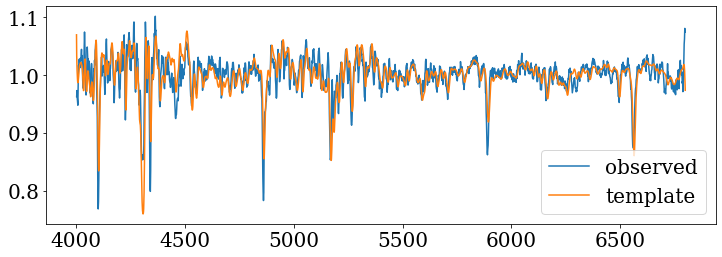

/Applications/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


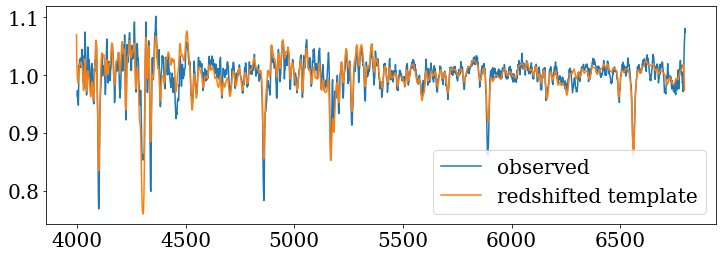

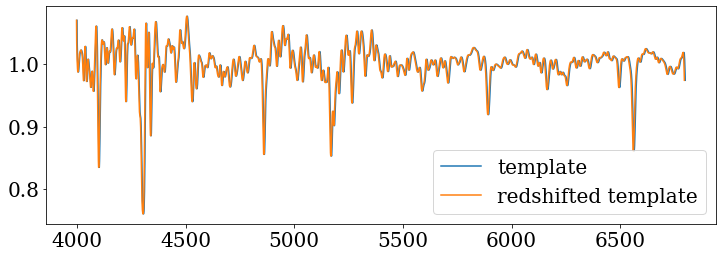

-0.0005858448448448454 26000.057961940256


In [79]:
#Blue flexure
B058_old_flex_path = '/Users/chloecheng/Documents/Research/IMF/old_B058/blue/keck_lris_blue_B/B058_old_blue_coadd1d.fits'
B058_old_template_path = '/Users/chloecheng/packages/alf/models/mock_b058_old_template.dat'

#Test finding redshift of entire spectrum
B058_old_z_lit = -0.000741
B058_old_test_z, B058_old_test_chi = test_pre_full(B058_old_flex_path, B058_old_template_path, B058_old_z_lit, 0.005, 'coadd')
print(B058_old_test_z, B058_old_test_chi)

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)


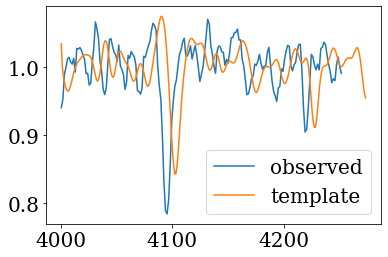

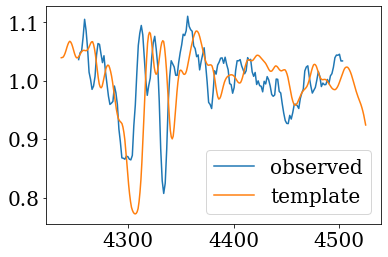

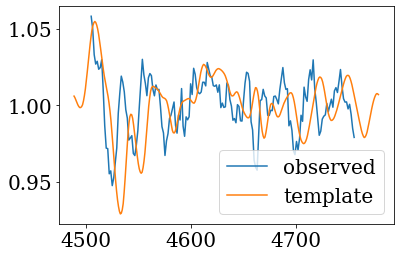

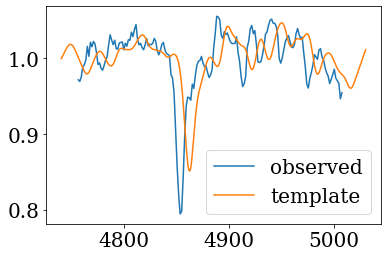

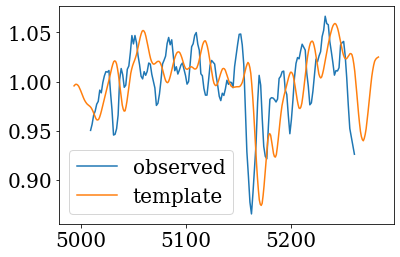

...

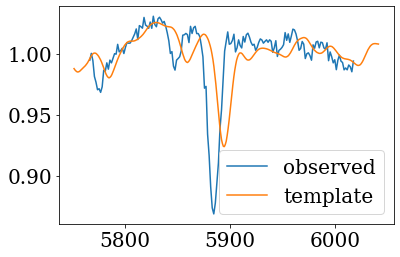

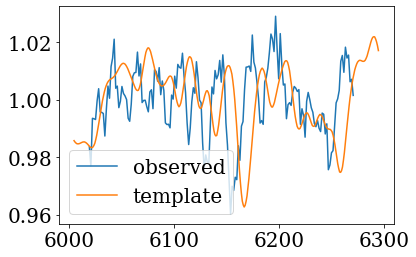

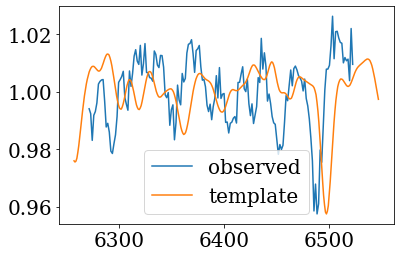

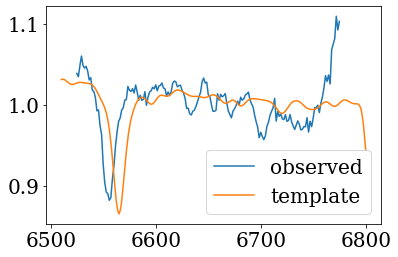

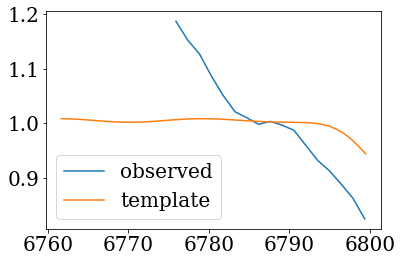

In [80]:
#Measure redshift in chunks
B058_old_noflex_path = '/Users/chloecheng/Documents/Research/IMF/old_B058_noflex/blue/keck_lris_blue_B/B058_old_blue_coadd1d.fits'
B058_old_wave_full, B058_old_cut_wave, B058_old_flux_full, B058_old_cut_flux, B058_old_noise_full, B058_old_cut_noise = prep_data(B058_old_noflex_path, 
                                                                                                         'coadd')
B058_old_norm_blue_wave_chunks, B058_old_norm_blue_flux_chunks, B058_old_norm_blue_noise_chunks = data_chunks(B058_old_cut_wave, B058_old_cut_flux, 
                                                                                                  B058_old_cut_noise, 250)
B058_old_norm_template_wave_chunks, B058_old_norm_template_flux_chunks, B058_old_norm_template_noise_chunks, \
B058_old_template_central_wavelengths, B058_old_central_wavelengths = template_chunks(B058_old_cut_wave, B058_old_cut_flux, B058_old_cut_noise, 
                                                                              B058_old_template_path, B058_old_z_lit, 250, 20, 'before')
QA_chunks(B058_old_norm_blue_wave_chunks, B058_old_norm_blue_flux_chunks, B058_old_norm_template_wave_chunks, B058_old_norm_template_flux_chunks)

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/Applications/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Applications/anaconda3/lib/python3.8/site-packages/specutils/manipulation/resample.py:201: RuntimeWarning: invalid value encountered in multiply
  out_variance = np.sum(pixel_uncer * resample_grid**2, axis=-1) / np.sum(


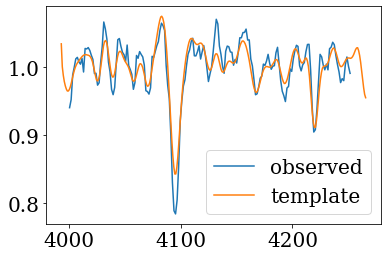

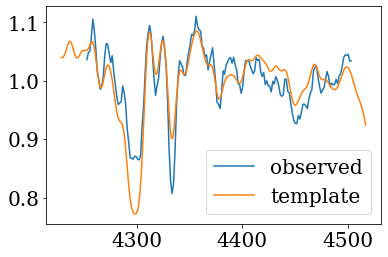

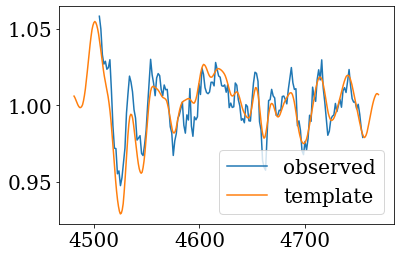

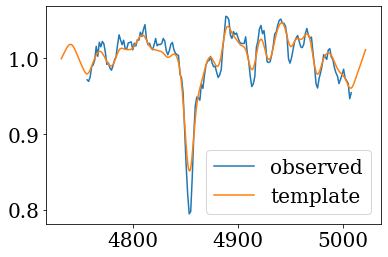

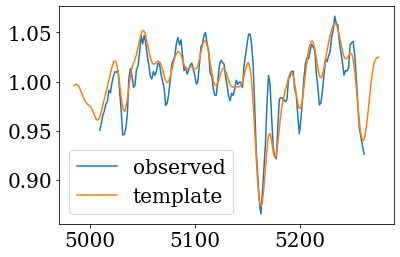

...

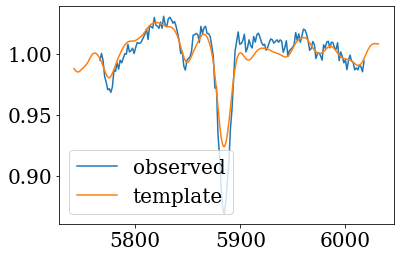

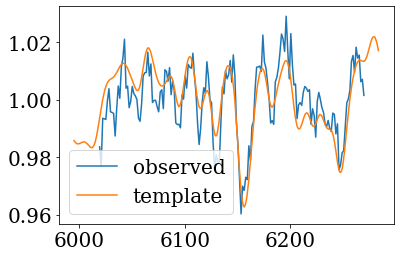

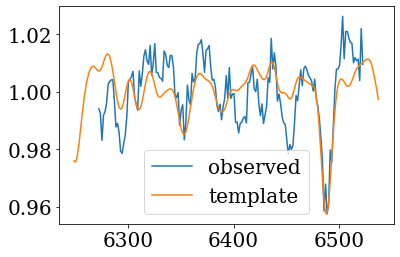

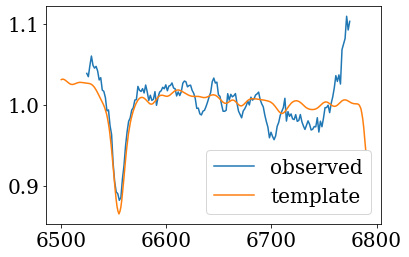

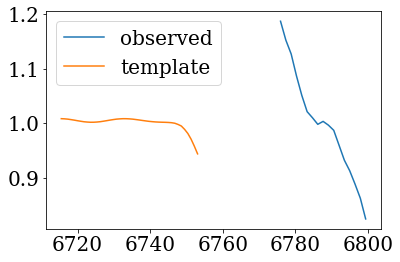

In [81]:
B058_old_bestfit_redshift, B058_old_best_chi2, B058_old_redshifted_spectra, B058_old_chi2 = chunk_redshift(B058_old_cut_wave, B058_old_cut_flux, 
                                                                                           B058_old_cut_noise, B058_old_template_path, 
                                                                                           B058_old_z_lit, 250, 20, -0.001828, 0.005,
                                                                                           'before')
B058_old_redshifted_waves = []
B058_old_redshifted_fluxes = []
for i in range(len(B058_old_redshifted_spectra)):
    B058_old_redshifted_waves.append(B058_old_redshifted_spectra[i].spectral_axis)
    B058_old_redshifted_fluxes.append(B058_old_redshifted_spectra[i].flux)
QA_chunks(B058_old_norm_blue_wave_chunks, B058_old_norm_blue_flux_chunks, B058_old_redshifted_waves, B058_old_redshifted_fluxes)

Montonic:  True


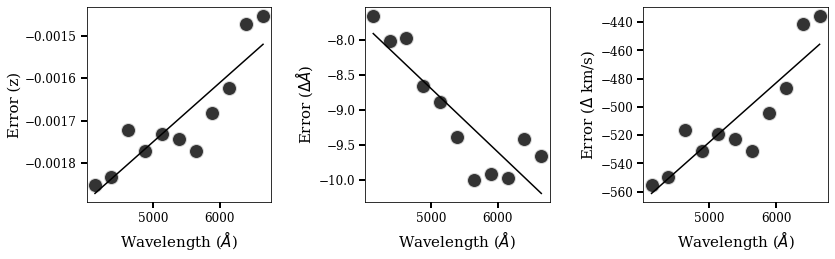

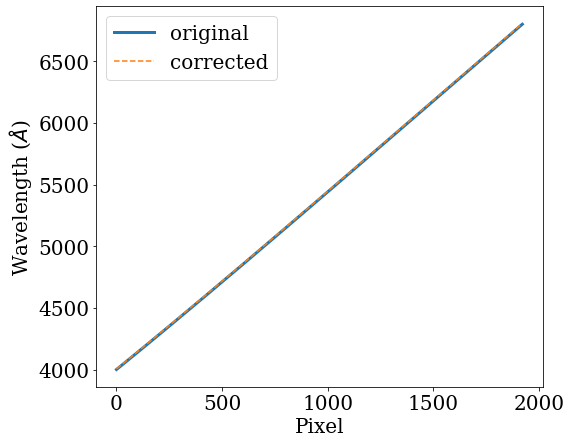

In [82]:
B058_old_blue_fit, B058_old_blue_fit_z, B058_old_blue_fit_kms, B058_old_blue_error_func, B058_old_blue_error_func_z, B058_old_blue_error_func_kms, \
B058_old_blue_errors_A = fit_errors(B058_old_bestfit_redshift[:-1], B058_old_template_central_wavelengths[:-1])
QA_fit(B058_old_bestfit_redshift[:-1], B058_old_template_central_wavelengths[:-1])
B058_old_blue_corr_factor, B058_old_blue_wave_corr, B058_old_a, B058_old_b = flexure_function(B058_old_blue_fit, B058_old_z_lit, B058_old_cut_wave)
flexure_QA(B058_old_cut_wave, B058_old_blue_wave_corr)

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:582: RankWarning: Polyfit may be poorly conditioned
  norm_wave_corr, norm_corr_flux, norm_corr_noise = continuum_normalize(np.min(wave_corr), np.max(wave_corr), data_cut_flux,
<ipython-input-77-3315732f0d94>:584: RankWarning: Polyfit may be poorly conditioned
  norm_template_wave, norm_template_flux, norm_template_noise = continuum_normalize(np.min(template_wave),
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/Applications/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:486: RuntimeWarning: in

-0.0007359949949949955


<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/A

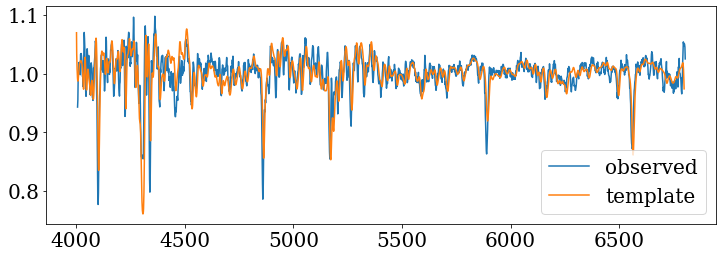

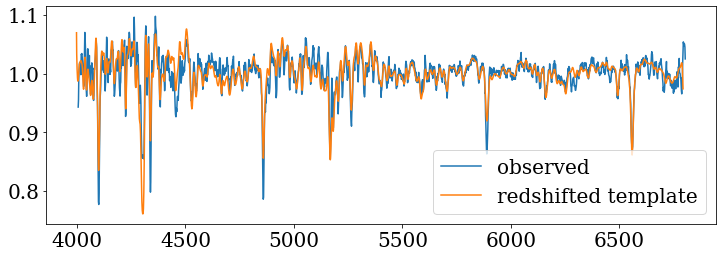

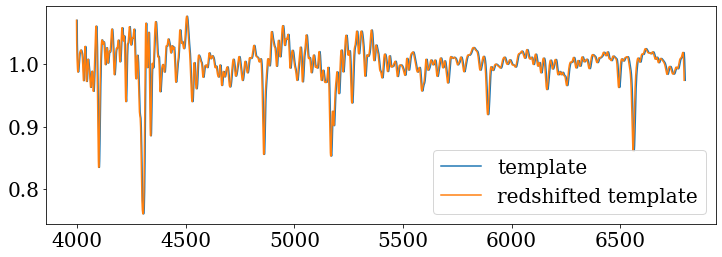

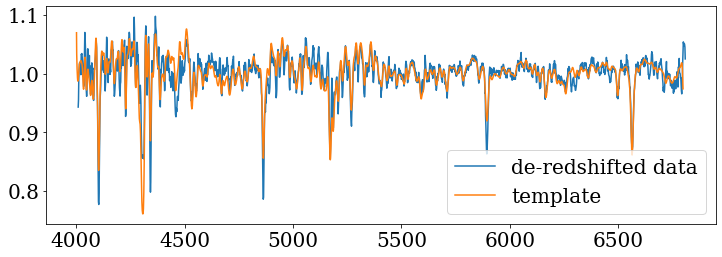

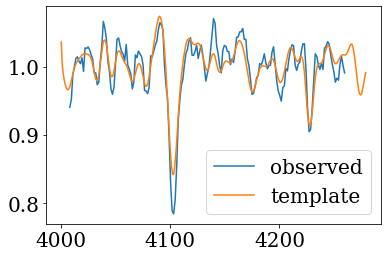

...

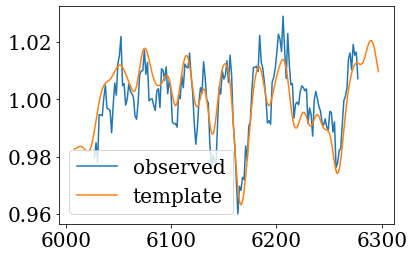

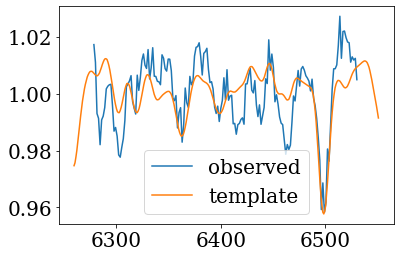

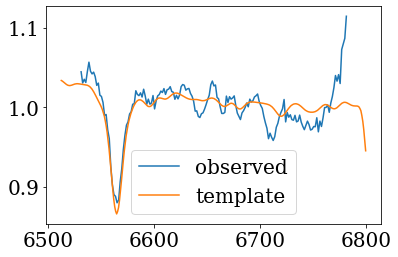

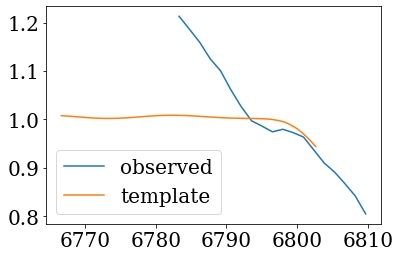

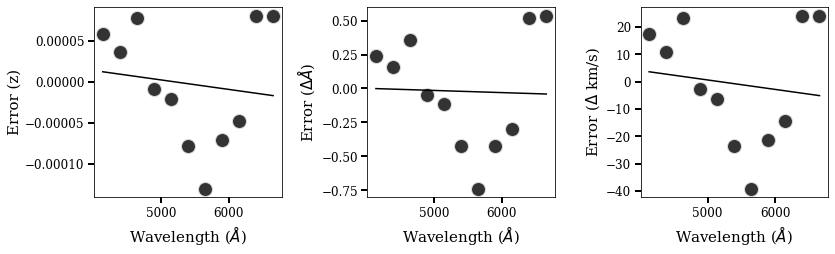

In [83]:
#Re-do redshifting to make sure correction worked
B058_old_tm_result_corr, B058_old_dered_wave = dered_corr(B058_old_noflex_path, B058_old_template_path, B058_old_blue_wave_corr, B058_old_z_lit, 0.005, 
                                                  'coadd')
print(B058_old_tm_result_corr[0])
B058_old_norm_blue_wave_chunks_corr, B058_old_norm_blue_flux_chunks_corr, B058_old_norm_blue_noise_chunks_corr = data_chunks(B058_old_dered_wave,
                                                                                                                 B058_old_cut_flux,
                                                                                                                 B058_old_cut_noise,
                                                                                                                 250)
B058_old_norm_template_wave_chunks_corr, B058_old_norm_template_flux_chunks_corr, B058_old_norm_template_noise_chunks_corr, \
B058_old_template_central_wavelengths_corr, B058_old_central_wavelengths_corr = template_chunks(B058_old_dered_wave, B058_old_cut_flux, 
                                                                                        B058_old_cut_noise, B058_old_template_path, 
                                                                                        B058_old_z_lit, 250, 20, 'after')
QA_chunks(B058_old_norm_blue_wave_chunks_corr, B058_old_norm_blue_flux_chunks_corr,B058_old_norm_template_wave_chunks_corr, 
          B058_old_norm_template_flux_chunks_corr)
B058_old_bestfit_redshift_corr, B058_old_best_chi2_corr, B058_old_redshifted_spectra_corr, B058_old_chi2_corr = chunk_redshift(B058_old_dered_wave, 
                                                                                                               B058_old_cut_flux, 
                                                                                                               B058_old_cut_noise, 
                                                                                                               B058_old_template_path,
                                                                                                               B058_old_z_lit, 250, 
                                                                                                               20, 0, 5e-4, 'after')
B058_old_redshifted_waves_corr = []
B058_old_redshifted_fluxes_corr = []
for i in range(len(B058_old_redshifted_spectra_corr)):
    B058_old_redshifted_waves_corr.append(B058_old_redshifted_spectra_corr[i].spectral_axis)
    B058_old_redshifted_fluxes_corr.append(B058_old_redshifted_spectra_corr[i].flux)
QA_chunks(B058_old_norm_blue_wave_chunks_corr, B058_old_norm_blue_flux_chunks_corr, B058_old_redshifted_waves_corr, 
          B058_old_redshifted_fluxes_corr)
QA_fit(B058_old_bestfit_redshift_corr[:-1], B058_old_central_wavelengths_corr[:-1])
B058_old_blue_fit_corr, B058_old_blue_fit_z_corr, B058_old_blue_fit_kms_corr, B058_old_blue_error_func_corr, \
B058_old_blue_error_func_z_corr, B058_old_blue_error_func_kms_corr, B058_old_blue_errors_A_corr\
= fit_errors(B058_old_bestfit_redshift_corr[:-1], B058_old_central_wavelengths_corr[:-1])

In [84]:
#Final corrected wavelength
B058_old_blue_finalcorr_factor, B058_old_blue_final_corr_wave, B058_old_final_a, B058_old_final_b = flexure_function(B058_old_blue_fit, B058_old_z_lit, B058_old_wave_full)

Montonic:  True


<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/Applications/anaconda3/lib/python3.8/site-packages/numpy/lib/polynomial.py:627: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
/Applications/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:47: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
<ipython-input-77-3315732f0d94>:702: RankWarning: Polyfit may be poorly conditioned
  sky_norm_wave, sky_norm_flux, sky_norm_noise = continuum_normalize(np.min(sky_wave), np.max(sky_wave), smoothed_sky_flux,
<ipython-input-77-3315732f0d94>:724: RankWarning: Polyfit may be poorly conditioned
  targ_norm_wave, targ_norm_flux, targ_norm_noise = continuum_normalize(np.min(data_wave), np.max(data_wave), data_flux,


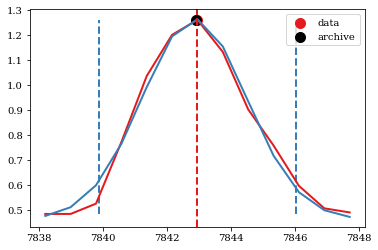

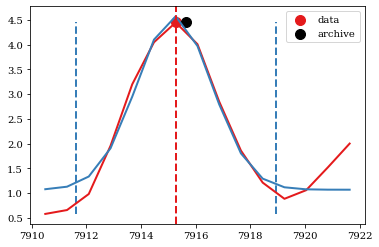

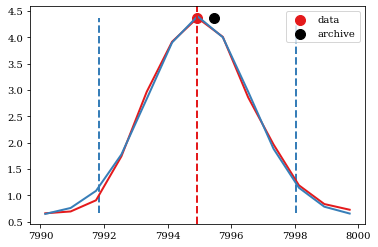

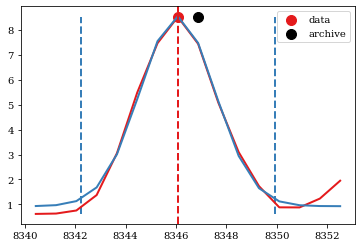

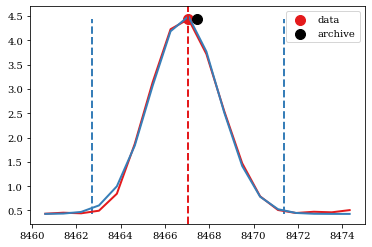

...

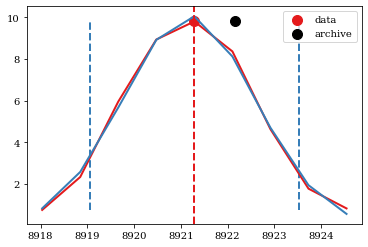

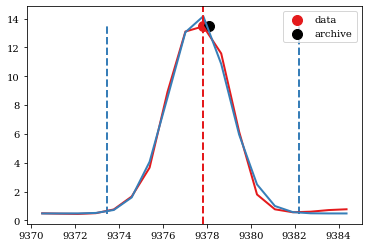

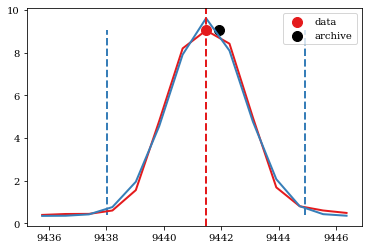

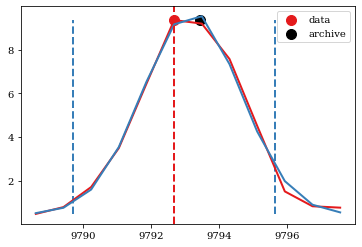

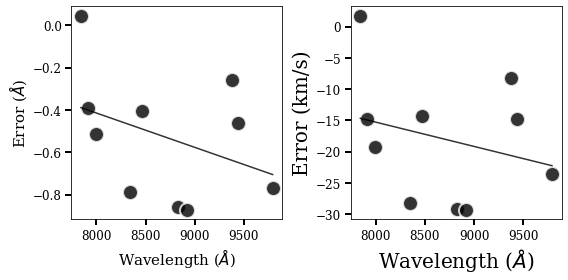

In [87]:
B058_old_red_file = glob.glob('/Users/chloecheng/Documents/Research/IMF/old_B058/red/keck_lris_red_*/Science/spec1d*B058*.fits')[0]
sky_paranal_filename = '/Applications/anaconda3/lib/python3.8/site-packages/pypeit/data/sky_spec/paranal_sky.fits'

B058_old_waves_1d_red, B058_old_fluxes_1d_red = read_1dspec(B058_old_red_file)
sky_paranal_wave, sky_paranal_flux = read_skymod(sky_paranal_filename)

#Smooth the sky model
B058_old_R_red = data_resolution(sky_paranal_wave, sky_paranal_flux)
B058_old_smoothed_sky_flux, B058_old_smoothed_sky_noise = smooth_red(sky_paranal_wave, sky_paranal_flux)

#Find sky centroids 
B058_old_sky_cents = sky_centroids(sky_paranal_wave, B058_old_smoothed_sky_flux, B058_old_smoothed_sky_noise)

#Get offsets between data and model
B058_old_red_targ_bounds = [[7838, 7848], [7910, 7922], [7990, 8000], [8340, 8353], [8460, 8475], [8823, 8833], [8918, 8925], 
                   [9370, 9385], [9435, 9447], [9788, 9798]]
B058_old_nearest_waves, B058_old_offsets = centroid_offsets(B058_old_red_targ_bounds, B058_old_waves_1d_red, B058_old_fluxes_1d_red, B058_old_sky_cents)

#Fit the errors
B058_old_red_fit, B058_old_red_fit_kms, B058_old_red_fit_func, B058_old_red_fit_func_kms = offset_fit(B058_old_nearest_waves, B058_old_offsets)
QA_offset_fit(B058_old_nearest_waves, B058_old_offsets)

Monotonic:  True


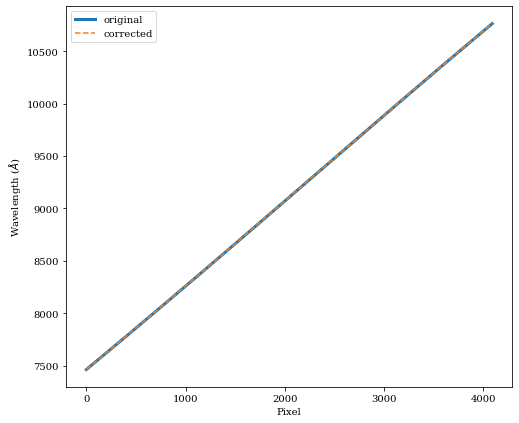

In [88]:
#Import co-added spectra
B058_old_red_coadd = fits.open('/Users/chloecheng/Documents/Research/IMF/old_B058/red/keck_lris_red_D/B058_old_red_coadd1d.fits')
B058_old_red_coadd_wave = B058_old_red_coadd[1].data['wave']
B058_old_red_coadd_flux = B058_old_red_coadd[1].data['flux']
B058_old_red_coadd_noise = 1/np.sqrt(B058_old_red_coadd[1].data['ivar'])
B058_old_red_unc = B058_old_red_coadd[1].data['ivar']
B058_old_red_coadd.close()

#Correct the wavelength
B058_old_red_wave_corr = fit_interp(B058_old_red_coadd_wave, B058_old_red_coadd_flux, B058_old_red_coadd_noise, B058_old_nearest_waves, 
                                B058_old_red_fit_func)

Monotonic:  True


<ipython-input-77-3315732f0d94>:724: RankWarning: Polyfit may be poorly conditioned
  targ_norm_wave, targ_norm_flux, targ_norm_noise = continuum_normalize(np.min(data_wave), np.max(data_wave), data_flux,
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)


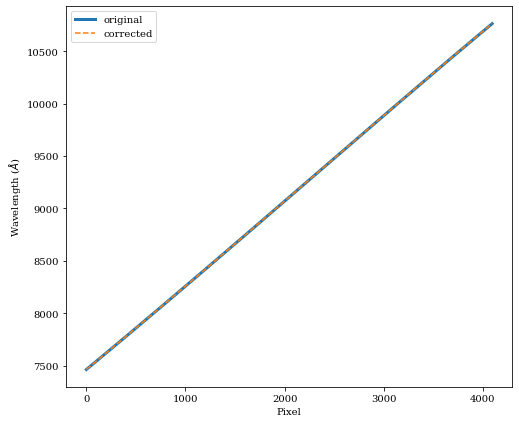

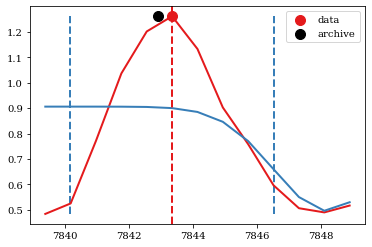

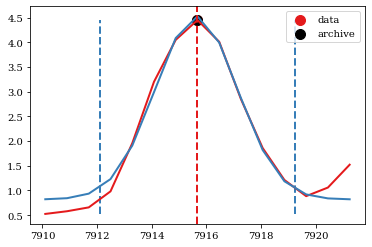

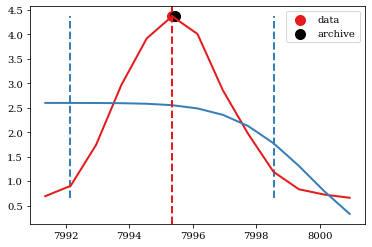

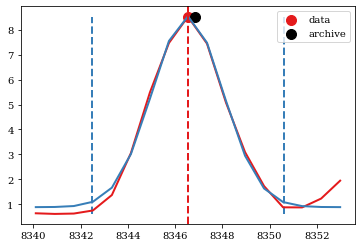

...

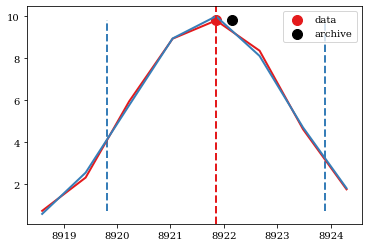

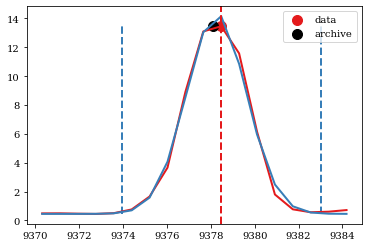

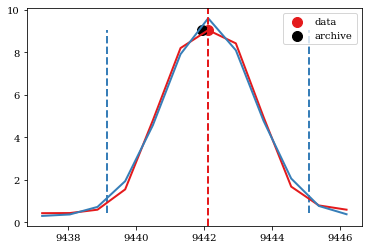

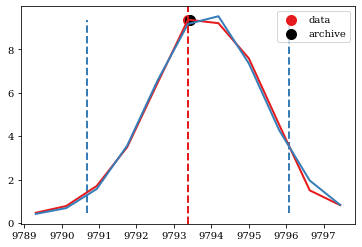

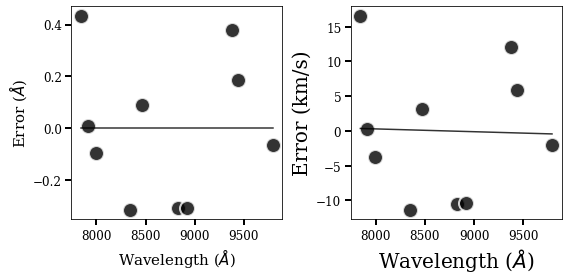

In [89]:
#Re-do to check if correction worked
B058_old_waves_1d_red_corr = fit_interp(B058_old_waves_1d_red, B058_old_fluxes_1d_red, np.zeros_like(B058_old_fluxes_1d_red), 
                                    B058_old_nearest_waves, B058_old_red_fit_func)

B058_old_red_targ_bounds_corr = [[7839, 7849], [7910, 7922], [7991, 8001], [8340, 8353], [8460, 8475], [8824, 8835], [8918, 8925], 
                   [9370, 9385], [9437, 9447], [9789, 9798]]
B058_old_nearest_waves_corr, B058_old_offsets_corr = centroid_offsets(B058_old_red_targ_bounds_corr, B058_old_waves_1d_red_corr, 
                                                              B058_old_fluxes_1d_red, B058_old_sky_cents)

B058_old_red_fit_corr, B058_old_red_fit_corr_kms, B058_old_red_fit_func_corr, \
B058_old_red_fit_func_corr_kms = offset_fit(B058_old_nearest_waves_corr, B058_old_offsets_corr)
QA_offset_fit(B058_old_nearest_waves_corr, B058_old_offsets_corr)

In [90]:
#Telluric correction
B058_old_blue_path = '/Users/chloecheng/Documents/Research/IMF/old_B058_noflex/blue/keck_lris_blue_B/B058_old_blue_coadd1d.fits'
B058_old_red_path = '/Users/chloecheng/Documents/Research/IMF/old_B058/red/keck_lris_red_D/B058_old_red_coadd1d.fits'
B058_old_tell_flux, B058_old_tell_wave, B058_old_scaled_template, B058_old_targ_flux = telluric_correction_routine(B058_old_blue_path, 
                                                                                                   B058_old_red_path, 
                                                                                                   B058_old_blue_final_corr_wave, 
                                                                                                   B058_old_red_wave_corr)
B058_old_total_corrected_wave = np.concatenate((B058_old_blue_final_corr_wave, B058_old_red_wave_corr))
B058_old_total_noise = np.concatenate((1/np.sqrt(B058_old_noise_full), B058_old_red_coadd_noise))

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

In [91]:
B058_old_total_flux = np.concatenate((B058_old_flux_full, B058_old_red_coadd_flux))
B058_old_total_unc = np.concatenate((B058_old_noise_full, B058_old_red_unc))

## B058 new

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:322: RankWarning: Polyfit may be poorly conditioned
  norm_data_wave, norm_data_flux, norm_data_noise = continuum_normalize(np.min(data_cut_wave), np.max(data_cut_wave),
<ipython-input-77-3315732f0d94>:324: RankWarning: Polyfit may be poorly conditioned
  norm_template_wave, norm_template_flux, norm_template_noise = continuum_normalize(np.min(template_wave),
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)


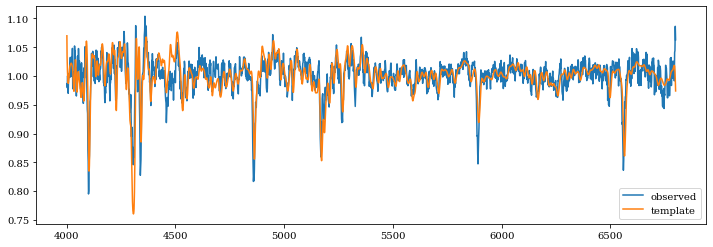

/Applications/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


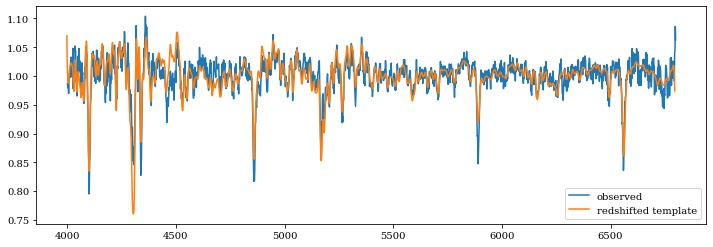

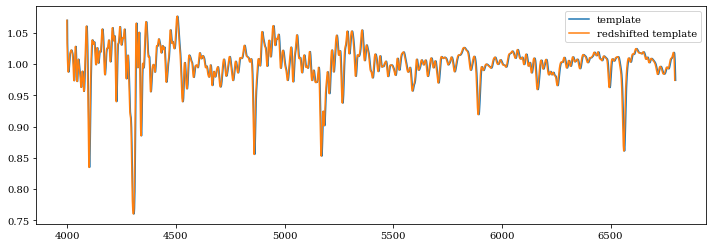

-0.0005858448448448454 8842.412074136297


In [92]:
#Blue flexure
B058_flex_path = '/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058/blue/keck_lris_blue_A/B058_blue_coadd1d.fits'
B058_template_path = '/Users/chloecheng/packages/alf/models/mock_b058_old_template.dat'

#Test finding redshift of entire spectrum
B058_z_lit = -0.000741
B058_test_z, B058_test_chi = test_pre_full(B058_flex_path, B058_template_path, B058_z_lit, 0.005, 'coadd')
print(B058_test_z, B058_test_chi)

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)


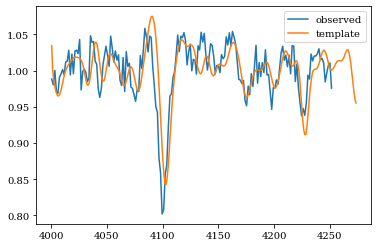

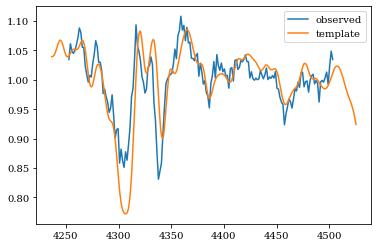

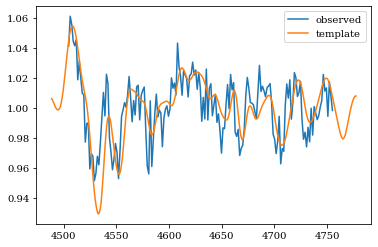

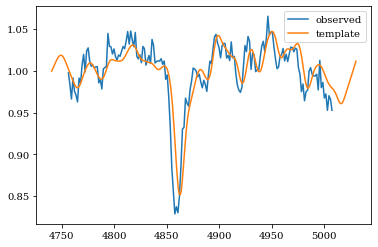

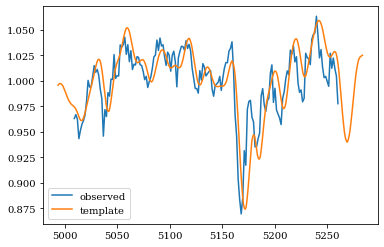

...

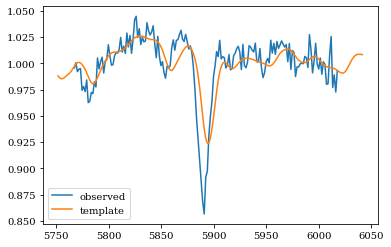

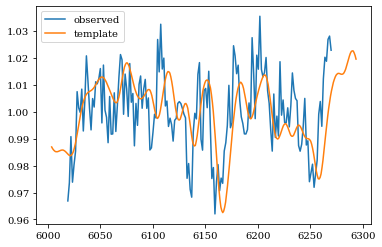

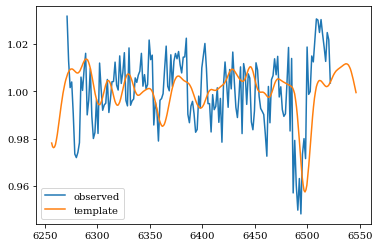

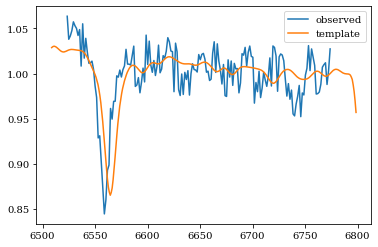

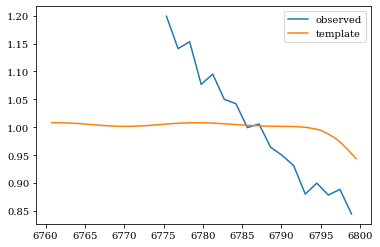

In [93]:
#Measure redshift in chunks
B058_noflex_path = '/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058_noflex/blue/keck_lris_blue_A/B058_blue_coadd1d.fits'
B058_wave_full, B058_cut_wave, B058_flux_full, B058_cut_flux, B058_noise_full, B058_cut_noise = prep_data(B058_noflex_path, 
                                                                                                         'coadd')
B058_norm_blue_wave_chunks, B058_norm_blue_flux_chunks, B058_norm_blue_noise_chunks = data_chunks(B058_cut_wave, B058_cut_flux, 
                                                                                                  B058_cut_noise, 250)
B058_norm_template_wave_chunks, B058_norm_template_flux_chunks, B058_norm_template_noise_chunks, \
B058_template_central_wavelengths, B058_central_wavelengths = template_chunks(B058_cut_wave, B058_cut_flux, B058_cut_noise, 
                                                                              B058_template_path, B058_z_lit, 250, 20, 'before')
QA_chunks(B058_norm_blue_wave_chunks, B058_norm_blue_flux_chunks, B058_norm_template_wave_chunks, B058_norm_template_flux_chunks)

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)


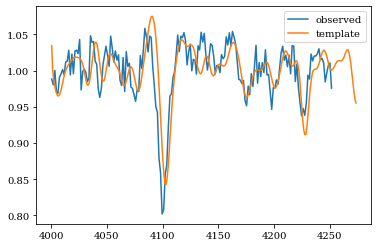

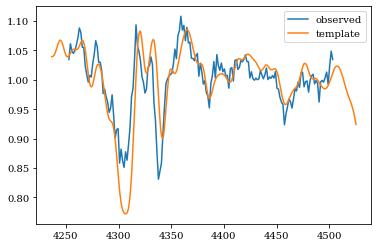

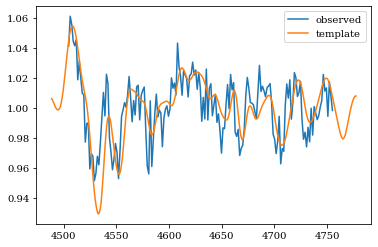

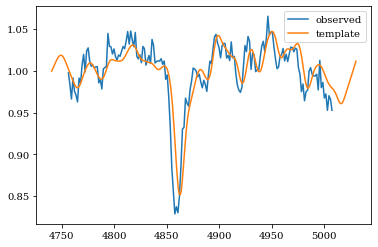

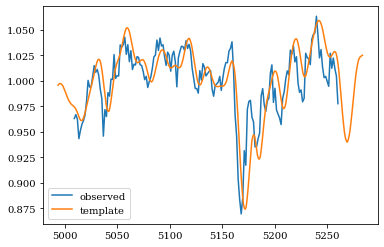

...

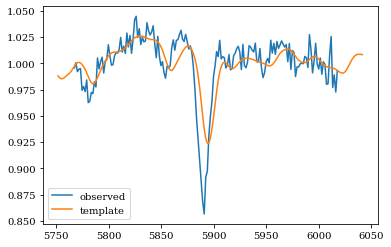

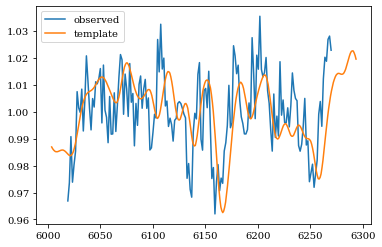

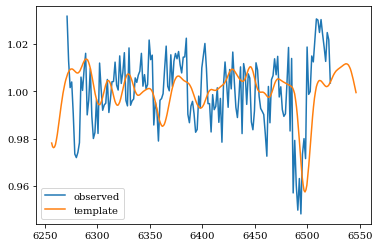

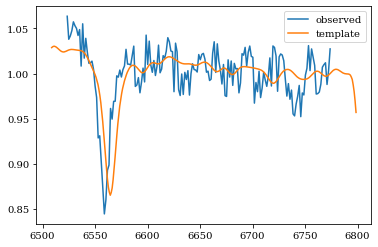

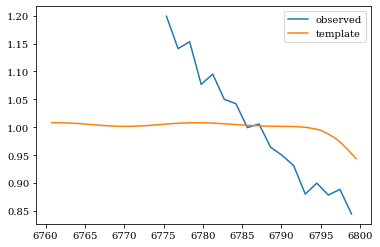

In [94]:
#Measure redshift in chunks
B058_noflex_path = '/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058_noflex/blue/keck_lris_blue_A/B058_blue_coadd1d.fits'
B058_wave_full, B058_cut_wave, B058_flux_full, B058_cut_flux, B058_noise_full, B058_cut_noise = prep_data(B058_noflex_path, 
                                                                                                         'coadd')
B058_norm_blue_wave_chunks, B058_norm_blue_flux_chunks, B058_norm_blue_noise_chunks = data_chunks(B058_cut_wave, B058_cut_flux, 
                                                                                                  B058_cut_noise, 250)
B058_norm_template_wave_chunks, B058_norm_template_flux_chunks, B058_norm_template_noise_chunks, \
B058_template_central_wavelengths, B058_central_wavelengths = template_chunks(B058_cut_wave, B058_cut_flux, B058_cut_noise, 
                                                                              B058_template_path, B058_z_lit, 250, 20, 'before')
QA_chunks(B058_norm_blue_wave_chunks, B058_norm_blue_flux_chunks, B058_norm_template_wave_chunks, B058_norm_template_flux_chunks)

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/Applications/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Applications/anaconda3/lib/python3.8/site-packages/specutils/manipulation/resample.py:201: RuntimeWarning: invalid value encountered in multiply
  out_variance = np.sum(pixel_uncer * resample_grid**2, axis=-1) / np.sum(


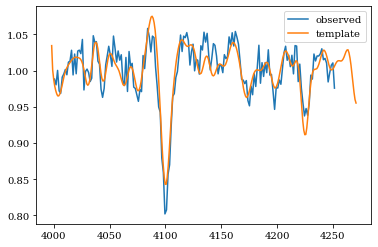

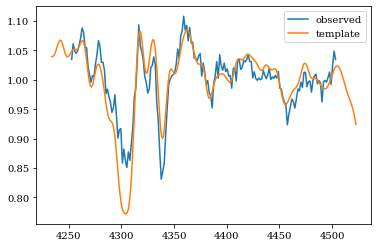

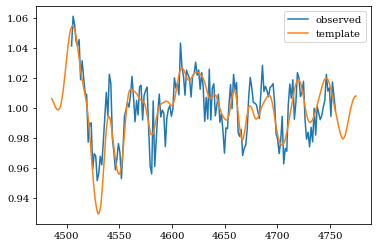

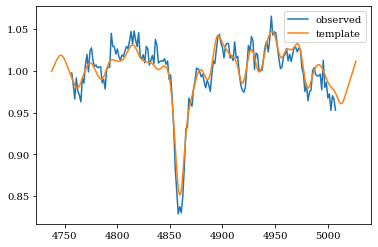

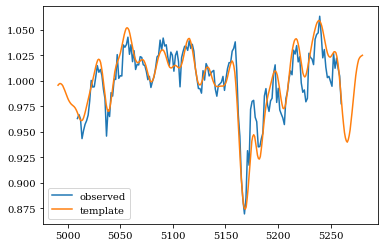

...

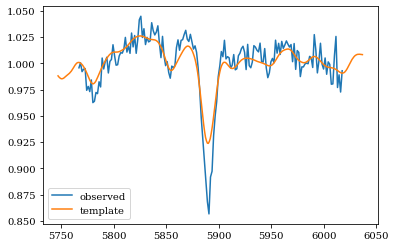

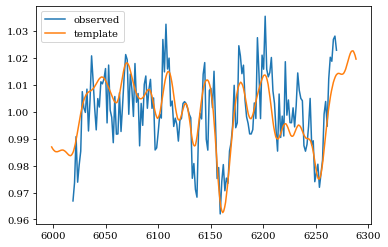

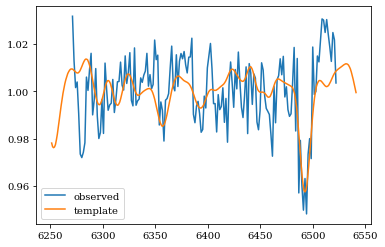

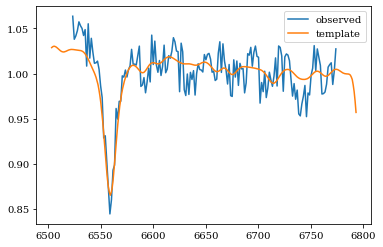

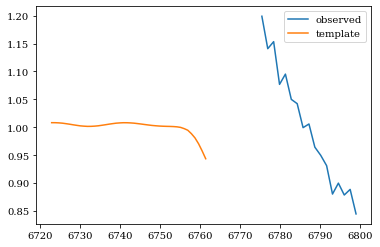

In [95]:
B058_bestfit_redshift, B058_best_chi2, B058_redshifted_spectra, B058_chi2 = chunk_redshift(B058_cut_wave, B058_cut_flux, 
                                                                                           B058_cut_noise, B058_template_path, 
                                                                                           B058_z_lit, 250, 20, -0.00061, 0.005,
                                                                                           'before')
B058_redshifted_waves = []
B058_redshifted_fluxes = []
for i in range(len(B058_redshifted_spectra)):
    B058_redshifted_waves.append(B058_redshifted_spectra[i].spectral_axis)
    B058_redshifted_fluxes.append(B058_redshifted_spectra[i].flux)
QA_chunks(B058_norm_blue_wave_chunks, B058_norm_blue_flux_chunks, B058_redshifted_waves, B058_redshifted_fluxes)

Montonic:  True


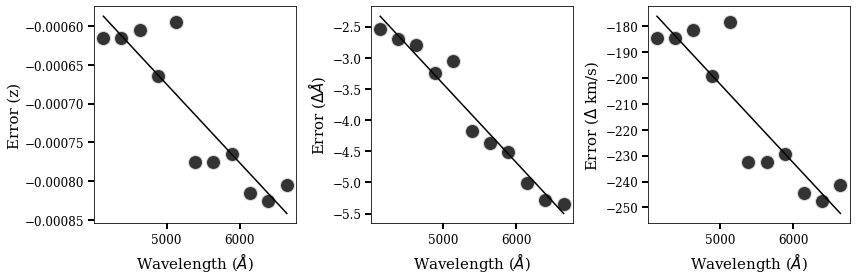

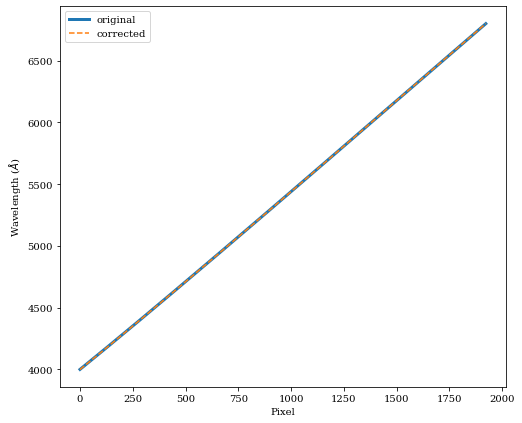

In [96]:
B058_blue_fit, B058_blue_fit_z, B058_blue_fit_kms, B058_blue_error_func, B058_blue_error_func_z, B058_blue_error_func_kms, \
B058_blue_errors_A = fit_errors(B058_bestfit_redshift[:-1], B058_template_central_wavelengths[:-1])
QA_fit(B058_bestfit_redshift[:-1], B058_template_central_wavelengths[:-1])
B058_blue_corr_factor, B058_blue_wave_corr, B058_a, B058_b = flexure_function(B058_blue_fit, B058_z_lit, B058_cut_wave)
flexure_QA(B058_cut_wave, B058_blue_wave_corr)

<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:582: RankWarning: Polyfit may be poorly conditioned
  norm_wave_corr, norm_corr_flux, norm_corr_noise = continuum_normalize(np.min(wave_corr), np.max(wave_corr), data_cut_flux,
<ipython-input-77-3315732f0d94>:584: RankWarning: Polyfit may be poorly conditioned
  norm_template_wave, norm_template_flux, norm_template_noise = continuum_normalize(np.min(template_wave),
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/Applications/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:486: RuntimeWarning: in

-0.0007259849849849858


<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
<ipython-input-77-3315732f0d94>:295: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  template_file = pd.read_csv(template_path, skiprows=6,  sep='\t|\s+',
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/A

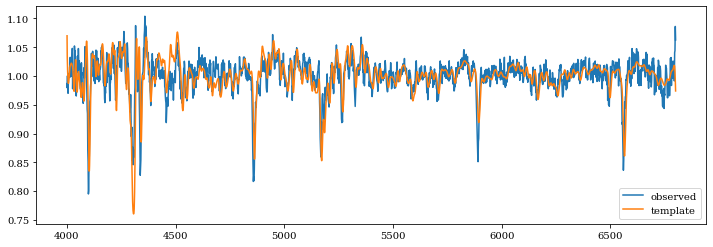

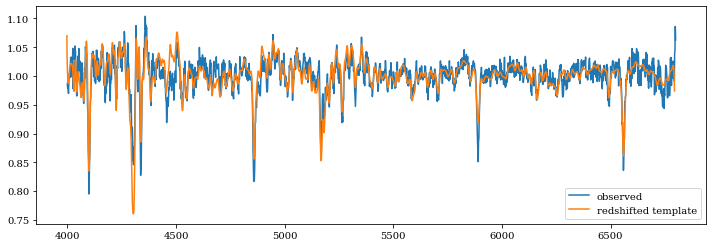

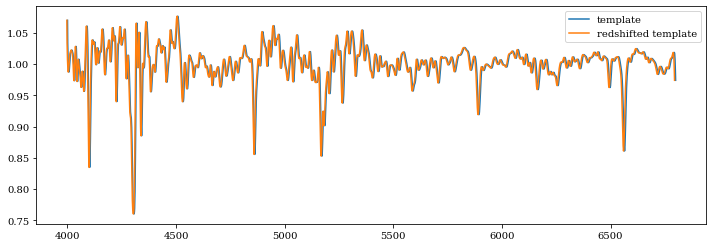

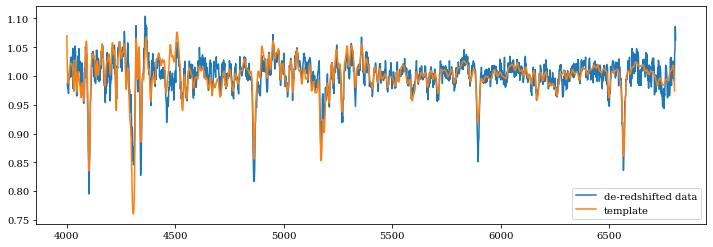

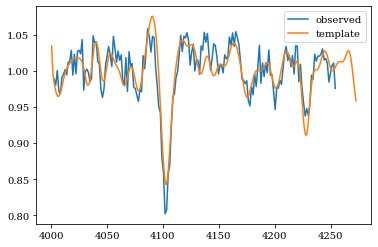

...

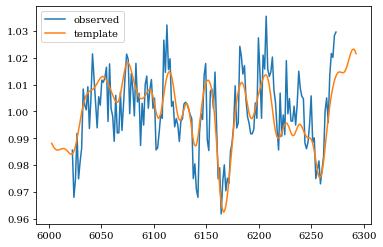

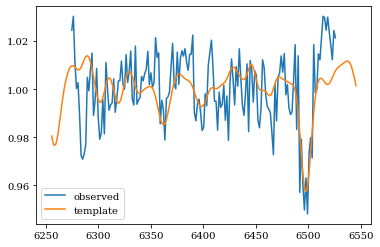

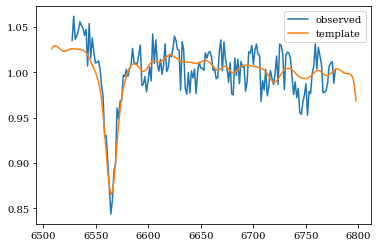

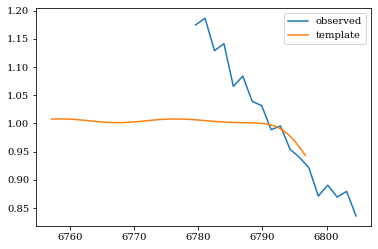

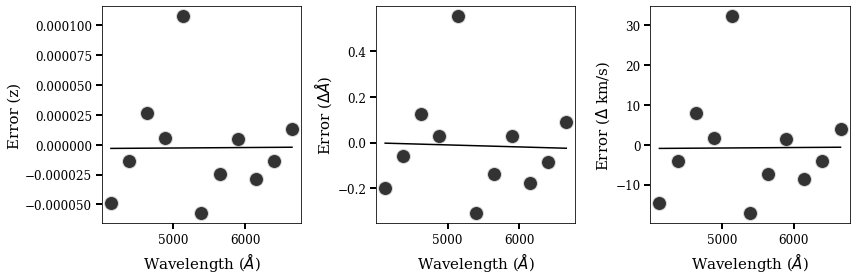

In [97]:
#Re-do redshifting to make sure correction worked
B058_tm_result_corr, B058_dered_wave = dered_corr(B058_noflex_path, B058_template_path, B058_blue_wave_corr, B058_z_lit, 0.005, 
                                                  'coadd')
print(B058_tm_result_corr[0])
B058_norm_blue_wave_chunks_corr, B058_norm_blue_flux_chunks_corr, B058_norm_blue_noise_chunks_corr = data_chunks(B058_dered_wave,
                                                                                                                 B058_cut_flux,
                                                                                                                 B058_cut_noise,
                                                                                                                 250)
B058_norm_template_wave_chunks_corr, B058_norm_template_flux_chunks_corr, B058_norm_template_noise_chunks_corr, \
B058_template_central_wavelengths_corr, B058_central_wavelengths_corr = template_chunks(B058_dered_wave, B058_cut_flux, 
                                                                                        B058_cut_noise, B058_template_path, 
                                                                                        B058_z_lit, 250, 20, 'after')
QA_chunks(B058_norm_blue_wave_chunks_corr, B058_norm_blue_flux_chunks_corr,B058_norm_template_wave_chunks_corr, 
          B058_norm_template_flux_chunks_corr)
B058_bestfit_redshift_corr, B058_best_chi2_corr, B058_redshifted_spectra_corr, B058_chi2_corr = chunk_redshift(B058_dered_wave, 
                                                                                                               B058_cut_flux, 
                                                                                                               B058_cut_noise, 
                                                                                                               B058_template_path,
                                                                                                               B058_z_lit, 250, 
                                                                                                               20, 0, 
                                                                                                               5e-4, 'after')
B058_redshifted_waves_corr = []
B058_redshifted_fluxes_corr = []
for i in range(len(B058_redshifted_spectra_corr)):
    B058_redshifted_waves_corr.append(B058_redshifted_spectra_corr[i].spectral_axis)
    B058_redshifted_fluxes_corr.append(B058_redshifted_spectra_corr[i].flux)
QA_chunks(B058_norm_blue_wave_chunks_corr, B058_norm_blue_flux_chunks_corr, B058_redshifted_waves_corr, 
          B058_redshifted_fluxes_corr)
QA_fit(B058_bestfit_redshift_corr[:-1], B058_central_wavelengths_corr[:-1])
B058_blue_fit_corr, B058_blue_fit_z_corr, B058_blue_fit_kms_corr, B058_blue_error_func_corr, B058_blue_error_func_z_corr, \
B058_blue_error_func_kms_corr, B058_blue_errors_A_corr = fit_errors(B058_bestfit_redshift_corr[:-1], 
                                                                    B058_central_wavelengths_corr[:-1])

In [98]:
#Final corrected wavelength
B058_blue_finalcorr_factor, B058_blue_final_corr_wave, B058_final_a, B058_final_b = flexure_function(B058_blue_fit, B058_z_lit, B058_wave_full)

Montonic:  True


<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
/Applications/anaconda3/lib/python3.8/site-packages/numpy/lib/polynomial.py:627: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
/Applications/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:47: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
<ipython-input-77-3315732f0d94>:702: RankWarning: Polyfit may be poorly conditioned
  sky_norm_wave, sky_norm_flux, sky_norm_noise = continuum_normalize(np.min(sky_wave), np.max(sky_wave), smoothed_sky_flux,
<ipython-input-77-3315732f0d94>:724: RankWarning: Polyfit may be poorly conditioned
  targ_norm_wave, targ_norm_flux, targ_norm_noise = continuum_normalize(np.min(data_wave), np.max(data_wave), data_flux,


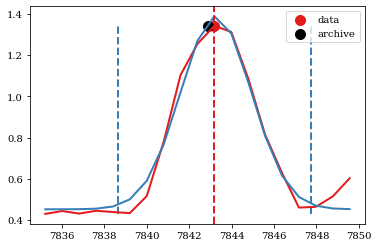

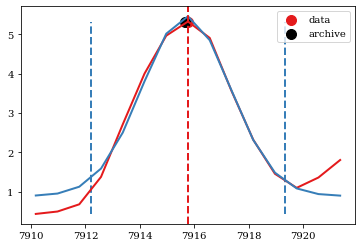

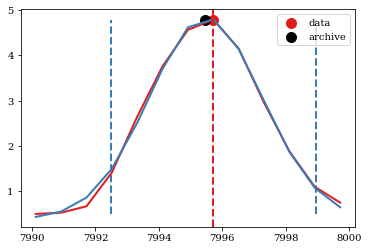

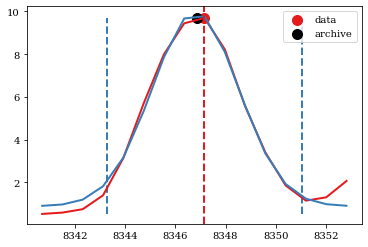

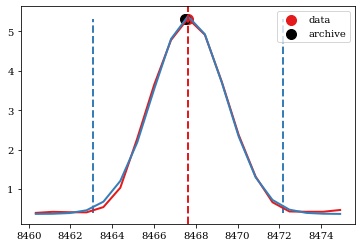

...

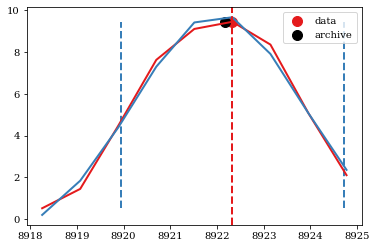

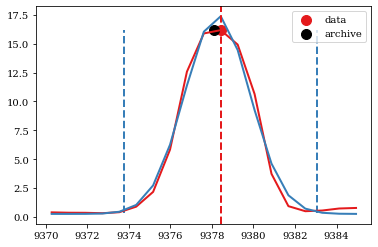

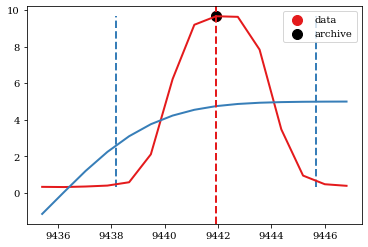

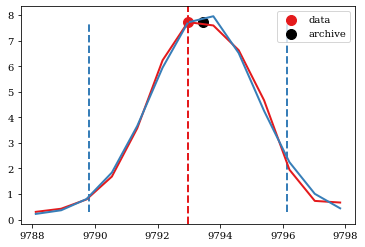

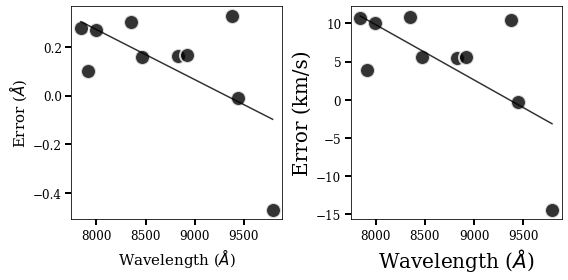

In [99]:
B058_red_file = glob.glob('/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058/red/keck_lris_red_*/Science/spec1d*B058*.fits')[0]
sky_paranal_filename = '/Applications/anaconda3/lib/python3.8/site-packages/pypeit/data/sky_spec/paranal_sky.fits'

B058_waves_1d_red, B058_fluxes_1d_red = read_1dspec(B058_red_file)
sky_paranal_wave, sky_paranal_flux = read_skymod(sky_paranal_filename)

#Smooth the sky model
B058_R_red = data_resolution(sky_paranal_wave, sky_paranal_flux)
B058_smoothed_sky_flux, B058_smoothed_sky_noise = smooth_red(sky_paranal_wave, sky_paranal_flux)

#Find sky centroids 
B058_sky_cents = sky_centroids(sky_paranal_wave, B058_smoothed_sky_flux, B058_smoothed_sky_noise)

#Get offsets between data and model
B058_red_targ_bounds = [[7835, 7850], [7910, 7922], [7990, 8000], [8340, 8353], [8460, 8475], [8823, 8833], [8918, 8925], 
                   [9370, 9385], [9435, 9447], [9788, 9798]]
B058_nearest_waves, B058_offsets = centroid_offsets(B058_red_targ_bounds, B058_waves_1d_red, B058_fluxes_1d_red, B058_sky_cents)

#Fit the errors
B058_red_fit, B058_red_fit_kms, B058_red_fit_func, B058_red_fit_func_kms = offset_fit(B058_nearest_waves, B058_offsets)
QA_offset_fit(B058_nearest_waves, B058_offsets)

Monotonic:  True


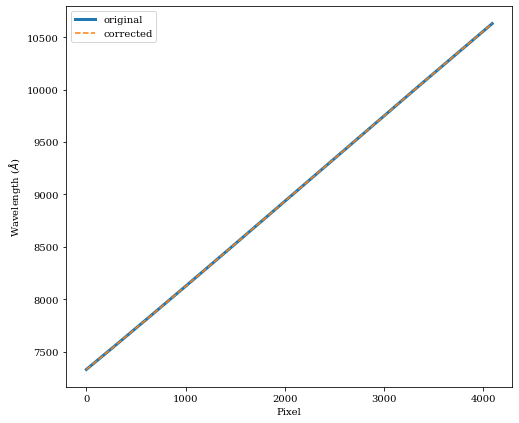

In [100]:
#Import co-added spectra
B058_red_coadd = fits.open('/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058/red/keck_lris_red_B/B058_red_coadd1d.fits')
B058_red_coadd_wave = B058_red_coadd[1].data['wave']
B058_red_coadd_flux = B058_red_coadd[1].data['flux']
B058_red_coadd_noise = 1/np.sqrt(B058_red_coadd[1].data['ivar'])
B058_red_unc = B058_red_coadd[1].data['ivar']
B058_red_coadd.close()

#Correct the wavelength
B058_red_wave_corr = fit_interp(B058_red_coadd_wave, B058_red_coadd_flux, B058_red_coadd_noise, B058_nearest_waves, 
                                B058_red_fit_func)

Monotonic:  True


<ipython-input-77-3315732f0d94>:724: RankWarning: Polyfit may be poorly conditioned
  targ_norm_wave, targ_norm_flux, targ_norm_noise = continuum_normalize(np.min(data_wave), np.max(data_wave), data_flux,
<ipython-input-77-3315732f0d94>:91: RuntimeWarning: divide by zero encountered in true_divide
  noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)


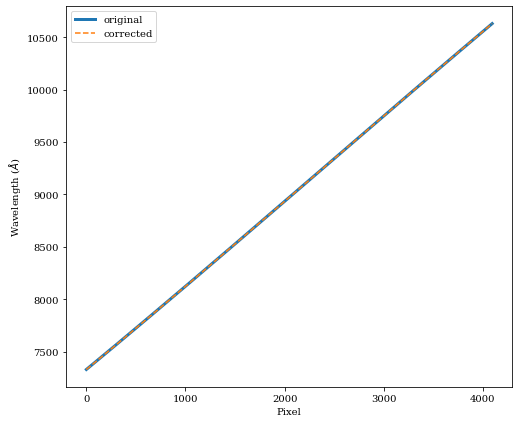

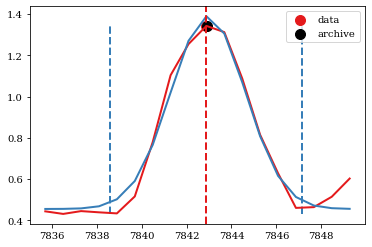

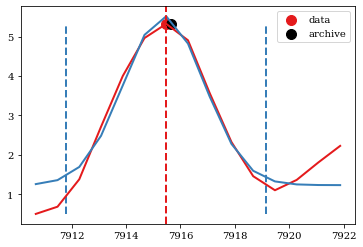

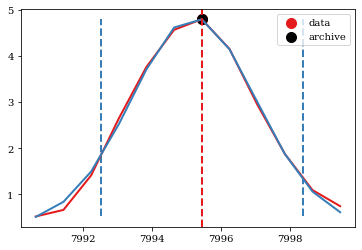

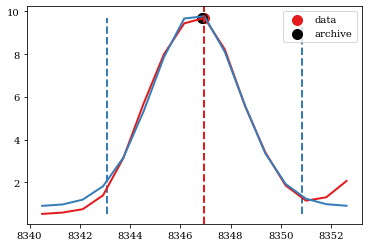

...

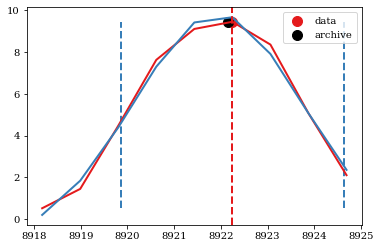

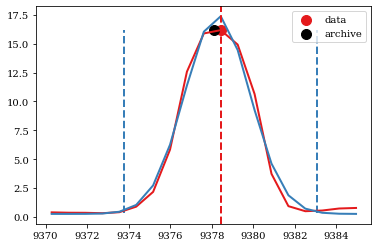

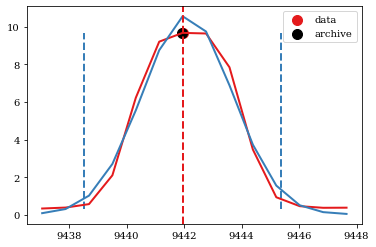

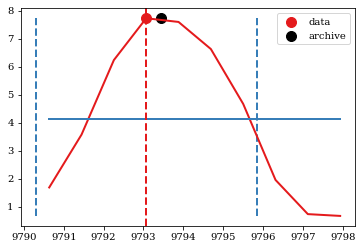

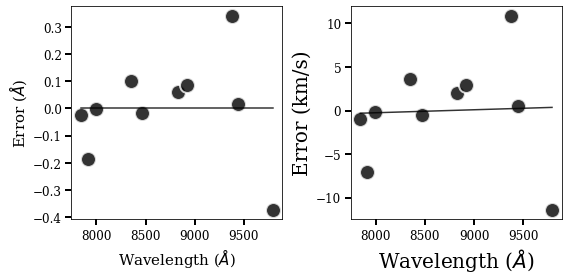

In [101]:
#Re-do to check if correction worked
B058_waves_1d_red_corr = fit_interp(B058_waves_1d_red, B058_fluxes_1d_red, np.zeros_like(B058_fluxes_1d_red), 
                                    B058_nearest_waves, B058_red_fit_func)

B058_red_targ_bounds_corr = [[7835, 7850], [7910, 7922], [7990, 8000], [8340, 8353], [8460, 8475], [8824, 8835], [8918, 8925], 
                   [9370, 9385], [9437, 9448], [9790, 9798]]
B058_nearest_waves_corr, B058_offsets_corr = centroid_offsets(B058_red_targ_bounds_corr, B058_waves_1d_red_corr, 
                                                              B058_fluxes_1d_red, B058_sky_cents)

B058_red_fit_corr, B058_red_fit_corr_kms, B058_red_fit_func_corr, \
B058_red_fit_func_corr_kms = offset_fit(B058_nearest_waves_corr, B058_offsets_corr)
QA_offset_fit(B058_nearest_waves_corr, B058_offsets_corr)

In [102]:
#Telluric correction
B058_blue_path = '/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058_noflex/blue/keck_lris_blue_A/B058_blue_coadd1d.fits'
B058_red_path = '/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058/red/keck_lris_red_B/B058_red_coadd1d.fits'
B058_tell_flux, B058_tell_wave, B058_scaled_template, B058_targ_flux = telluric_correction_routine(B058_blue_path, 
                                                                                                   B058_red_path, 
                                                                                                   B058_blue_final_corr_wave, 
                                                                                                   B058_red_wave_corr)
B058_total_corrected_wave = np.concatenate((B058_blue_final_corr_wave, B058_red_wave_corr))
B058_total_noise = np.concatenate((1/np.sqrt(B058_noise_full), B058_red_coadd_noise))
B058_total_flux = np.concatenate((B058_flux_full, B058_red_coadd_flux))

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Polyfit may be poorly conditioned
  normed_template_flux = normalize(normrange_wave, normrange_template_flux)
<ipython-input-78-68a66f502c01>:186: RankWarning: Polyfit may be poorly conditioned
  normed_target_flux = normalize(normrange_wave, normrange_target_flux)
<ipython-input-78-68a66f502c01>:185: RankWarning: Po

In [103]:
B058_total_unc = np.concatenate((B058_noise_full, B058_red_unc))

In [104]:
#Normalize
correction_range = [9320, 9380]
O3 = [5000, 6700]
NaI = [8100, 8300]
WF = [9850, 10000]

#New B058
#Pre-telluric correction
norm_wave_B058_new_raw_correction, norm_flux_B058_new_raw_correction, noise = continuum_normalize(correction_range[0], 
                                                                                           correction_range[-1], 
                                                                                           B058_total_flux,
                                                                                           B058_total_corrected_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_raw_O3, norm_flux_B058_new_raw_O3, noise = continuum_normalize(O3[0], O3[-1], B058_total_flux, 
                                                                           B058_total_corrected_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_raw_NaI, norm_flux_B058_new_raw_NaI, noise = continuum_normalize(NaI[0], NaI[-1], B058_total_flux, 
                                                                             B058_total_corrected_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_raw_WF, norm_flux_B058_new_raw_WF, noise = continuum_normalize(WF[0], WF[-1], B058_total_flux, 
                                                                           B058_total_corrected_wave, 
                                                                                           B058_total_noise)

#Good
#Post-telluric correction 
norm_wave_B058_new_good_tell_correction, norm_flux_B058_new_good_tell_correction, noise = continuum_normalize(correction_range[0], 
                                                                                                       correction_range[-1], 
                                                                                                       B058_tell_flux, 
                                                                                                       B058_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_good_tell_O3, norm_flux_B058_new_good_tell_O3, noise = continuum_normalize(O3[0], O3[-1], B058_tell_flux, 
                                                                                       B058_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_good_tell_NaI, norm_flux_B058_new_good_tell_NaI, noise = continuum_normalize(NaI[0], NaI[-1], B058_tell_flux, 
                                                                                         B058_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_good_tell_WF, norm_flux_B058_new_good_tell_WF, noise = continuum_normalize(WF[0], WF[-1], B058_tell_flux, 
                                                                                       B058_tell_wave, 
                                                                                           B058_total_noise)

#Scaled templates
norm_wave_B058_new_good_scale_correction, norm_flux_B058_new_good_scale_correction, noise = continuum_normalize(correction_range[0], 
                                                                                                         correction_range[-1], 
                                                                                                         B058_scaled_template, 
                                                                                                         B058_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_good_scale_O3, norm_flux_B058_new_good_scale_O3, noise = continuum_normalize(O3[0], O3[-1], B058_scaled_template, 
                                                                                         B058_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_good_scale_NaI, norm_flux_B058_new_good_scale_NaI, noise = continuum_normalize(NaI[0], NaI[-1], 
                                                                                           B058_scaled_template, B058_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_new_good_scale_WF, norm_flux_B058_new_good_scale_WF, noise = continuum_normalize(WF[0], WF[-1], B058_scaled_template, 
                                                                                         B058_tell_wave, 
                                                                                           B058_total_noise)

#Old B058
#Pre-telluric correction
norm_wave_B058_old_raw_correction, norm_flux_B058_old_raw_correction, noise = continuum_normalize(correction_range[0], 
                                                                                           correction_range[-1], 
                                                                                           B058_old_total_flux, 
                                                                                           B058_old_total_corrected_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_raw_O3, norm_flux_B058_old_raw_O3, noise = continuum_normalize(O3[0], O3[-1], B058_old_total_flux, 
                                                                           B058_total_corrected_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_raw_NaI, norm_flux_B058_old_raw_NaI, noise = continuum_normalize(NaI[0], NaI[-1], B058_old_total_flux, 
                                                                             B058_total_corrected_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_raw_WF, norm_flux_B058_old_raw_WF, noise = continuum_normalize(WF[0], WF[-1], B058_old_total_flux, 
                                                                           B058_total_corrected_wave, 
                                                                                           B058_total_noise)

#Good
#Post-telluric correction 
norm_wave_B058_old_good_tell_correction, norm_flux_B058_old_good_tell_correction, noise = continuum_normalize(correction_range[0], \
                                                                                                       correction_range[-1], 
                                                                                                       B058_old_tell_flux, 
                                                                                                       B058_old_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_good_tell_O3, norm_flux_B058_old_good_tell_O3, noise = continuum_normalize(O3[0], O3[-1], B058_old_tell_flux, 
                                                                                       B058_old_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_good_tell_NaI, norm_flux_B058_old_good_tell_NaI, noise = continuum_normalize(NaI[0], NaI[-1], B058_old_tell_flux, 
                                                                                         B058_old_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_good_tell_WF, norm_flux_B058_old_good_tell_WF, noise = continuum_normalize(WF[0], WF[-1], B058_old_tell_flux, 
                                                                                       B058_old_tell_wave, 
                                                                                           B058_total_noise)

#Scaled templates
norm_wave_B058_old_good_scale_correction, norm_flux_B058_old_good_scale_correction, noise = continuum_normalize(correction_range[0], 
                                                                                                         correction_range[-1], 
                                                                                                         B058_old_scaled_template,
                                                                                                         B058_old_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_good_scale_O3, norm_flux_B058_old_good_scale_O3, noise = continuum_normalize(O3[0], O3[-1], B058_old_scaled_template,
                                                                                         B058_old_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_good_scale_NaI, norm_flux_B058_old_good_scale_NaI, noise = continuum_normalize(NaI[0], NaI[-1], 
                                                                                           B058_old_scaled_template, 
                                                                                           B058_old_tell_wave, 
                                                                                           B058_total_noise)
norm_wave_B058_old_good_scale_WF, norm_flux_B058_old_good_scale_WF, noise = continuum_normalize(WF[0], WF[-1], 
                                                                                         B058_old_scaled_template, 
                                                                                         B058_old_tell_wave, 
                                                                                           B058_total_noise)

<ipython-input-104-e79c556481dc>:14: RankWarning: Polyfit may be poorly conditioned
  norm_wave_B058_new_raw_O3, norm_flux_B058_new_raw_O3, noise = continuum_normalize(O3[0], O3[-1], B058_total_flux,
<ipython-input-104-e79c556481dc>:31: RankWarning: Polyfit may be poorly conditioned
  norm_wave_B058_new_good_tell_O3, norm_flux_B058_new_good_tell_O3, noise = continuum_normalize(O3[0], O3[-1], B058_tell_flux,
<ipython-input-104-e79c556481dc>:47: RankWarning: Polyfit may be poorly conditioned
  norm_wave_B058_new_good_scale_O3, norm_flux_B058_new_good_scale_O3, noise = continuum_normalize(O3[0], O3[-1], B058_scaled_template,
<ipython-input-104-e79c556481dc>:64: RankWarning: Polyfit may be poorly conditioned
  norm_wave_B058_old_raw_O3, norm_flux_B058_old_raw_O3, noise = continuum_normalize(O3[0], O3[-1], B058_old_total_flux,
<ipython-input-104-e79c556481dc>:81: RankWarning: Polyfit may be poorly conditioned
  norm_wave_B058_old_good_tell_O3, norm_flux_B058_old_good_tell_O3, noise = contin

In [105]:
B058_new_file = fits.open('/Users/chloecheng/Documents/Research/IMF/LRIS_2016oct/2016oct28/B058/blue/keck_lris_blue_A/B058_blue_coadd1d.fits')
B058_new_airmass = np.round(B058_new_file[0].header['AIRMASS'], 2)
B058_new_file.close()
B058_old_file = fits.open('/Users/chloecheng/Documents/Research/IMF/old_B058/blue/keck_lris_blue_B/B058_old_blue_coadd1d.fits')
B058_old_airmass = np.round(B058_old_file[0].header['AIRMASS'], 2)
B058_old_file.close()

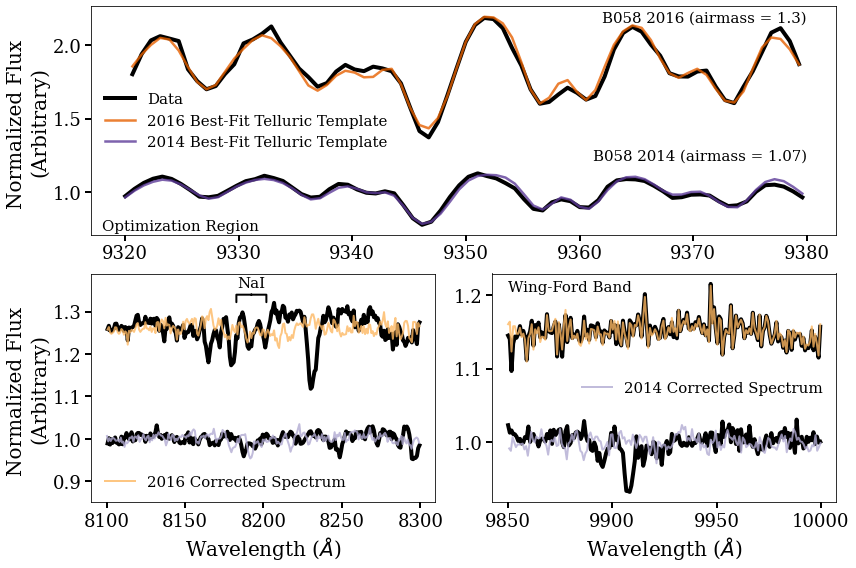

In [106]:
fig = plt.figure(figsize=(12, 8))
fig.set_tight_layout(True)
ax1 = fig.add_subplot(2,1,1)
ax3 = fig.add_subplot(2,2,3)
ax4 = fig.add_subplot(2,2,4)

ax1.plot(norm_wave_B058_new_raw_correction, norm_flux_B058_new_raw_correction+0.85, color='k', lw=4, label='Data')
ax1.plot(norm_wave_B058_new_good_scale_correction, norm_flux_B058_new_good_scale_correction+0.85, color='#e66101', lw=2.5, alpha=0.8, 
         label='2016 Best-Fit Telluric Template')
ax1.text(9380, 2.23, 'B058 2016 (airmass = %s)' %B058_new_airmass, fontsize=15, va='top', ha='right')
ax1.text(9380, 1.2, 'B058 2014 (airmass = %s)' %B058_old_airmass, fontsize=15, va='bottom', ha='right')

ax1.plot(norm_wave_B058_old_raw_correction, norm_flux_B058_old_raw_correction, color='k', lw=4)
ax1.plot(norm_wave_B058_old_good_scale_correction, norm_flux_B058_old_good_scale_correction, color='#5e3c99', lw=2.5, alpha=0.8, 
         label='2014 Best-Fit Telluric Template')

ax3.plot(norm_wave_B058_new_raw_NaI, norm_flux_B058_new_raw_NaI+0.26, color='k', lw=4)
ax3.plot(norm_wave_B058_new_good_tell_NaI, norm_flux_B058_new_good_tell_NaI+0.26, color='#fdb863', lw=2, alpha=0.8, 
           label='2016 Corrected Spectrum')

ax3.plot(norm_wave_B058_old_raw_NaI, norm_flux_B058_old_raw_NaI, color='k', lw=4)
ax3.plot(norm_wave_B058_old_good_tell_NaI, norm_flux_B058_old_good_tell_NaI, color='#b2abd2', lw=2, alpha=0.8)

ax3.annotate('NaI', xy=((8182.3+8202.3)/2, 1.34), xytext=((8182.3+8202.3)/2, 1.35), xycoords='data', 
            fontsize=15, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=1.0, lengthB=0.5', lw=2.0))
ax3.set_ylim(0.85, 1.39)

ax4.plot(norm_wave_B058_new_raw_WF, norm_flux_B058_new_raw_WF+0.15, color='k', lw=4)
ax4.plot(norm_wave_B058_new_good_tell_WF, norm_flux_B058_new_good_tell_WF+0.15, color='#fdb863', lw=2, alpha=0.8)

ax4.plot(norm_wave_B058_old_raw_WF, norm_flux_B058_old_raw_WF, color='k', lw=4)
ax4.plot(norm_wave_B058_old_good_tell_WF, norm_flux_B058_old_good_tell_WF, color='#b2abd2', lw=2, alpha=0.8, label='2014 Corrected Spectrum')

ax1.tick_params(length=6, width=2, labelsize=18)
ax3.tick_params(length=6, width=2, labelsize=18)
ax4.tick_params(length=6, width=2, labelsize=18)

ax1.set_ylabel('Normalized Flux \n(Arbitrary)', fontsize=20)
ax3.set_xlabel('Wavelength ($\AA$)', fontsize=20)
ax3.set_ylabel('Normalized Flux \n(Arbitrary)', fontsize=20)
ax4.set_xlabel('Wavelength ($\AA$)', fontsize=20)

ax1.legend(fontsize=15, frameon=False, framealpha=0)
ax3.legend(fontsize=15, frameon=False, framealpha=0)
ax4.legend(fontsize=15, frameon=False, framealpha=0)

ax1.text(9318, 0.72, 'Optimization Region', fontsize=15, ha='left', va='bottom')
ax4.text(9850, 1.22, 'Wing-Ford Band', fontsize=15, ha='left', va='top')
plt.savefig('paper_telluric.pdf', bbox_inches='tight')

In [107]:
#Alf fits to get velz for B058 (to convert to rest wavelength)
b058_new = Alf('/Users/chloecheng/packages/alf/results/B058_new_vIK', read_mcmc=True)
b058_old = Alf('/Users/chloecheng/packages/alf/results/B058_old_vIK', read_mcmc=True)

b058_old.normalize_spectra()
b058_new.normalize_spectra()

b058_old.get_total_met()
b058_old.abundance_correct(m11=True)

b058_new.get_total_met()
b058_new.abundance_correct(m11=True)

b058_old_velz = b058_old.results['velz'][5] #should be in km/s
b058_new_velz = b058_new.results['velz'][5]

c = 299792.458 #speed of light in km/s

In [108]:
#Convert wavelengths to rest wavelengths
new_b058_tell_wave_rest = B058_tell_wave/(1. + b058_new_velz/c)
old_b058_tell_wave_rest = B058_old_tell_wave/(1. + b058_old_velz/c)

In [109]:
#Continuum-normalization code from before
def data_ranges(lambda_min, lambda_max, flux, wavelength, noise):
    """Return the data within the desired wavelength range.
    
    Parameters
    ----------
    lambda_min : float
        The lower bound of the wavelength range
    lambda_max : float
        The upper bound of the wavelength range
    flux : tuple
        The flux data
    wavelength: tuple
        The wavelength data
    noise : tuple
        The noise in the spectra
        
    Returns
    -------
    wavelength_inrange : tuple
        The wavelength data within the desired wavelength range
    flux_inrange : tuple
        The flux data within the desired wavelength range
    noise_inrange : tuple
        The noise data within the desired wavelength range
    """
    
    rng = (wavelength >= lambda_min) & (wavelength <= lambda_max)
    wavelength_inrange = wavelength[rng]
    flux_inrange = flux[rng]
    noise_inrange = noise[rng]
    return wavelength_inrange, flux_inrange, noise_inrange

def poly_order(lambda_min, lambda_max):
    """Return the order of the polynomial by which to continuum-normalize the spectrum.
    
    Parameters
    ----------
    lambda_min : float
        The lower bound of the wavelength range
    lambda_max : float
        The upper bound of the wavelength range
        
    Returns
    -------
    (lambda_min/lambda_max)/100 : int
        The order of the polynomial by which to continuum-normalize the spectrum
    """
    
    return int((lambda_max - lambda_min)/100)

def continuum_normalize(lambda_min, lambda_max, flux, wavelength, noise):
    """Return the spectrum normalized by the fitted polynomial shape of the continuum.
    
    Parameters
    ----------
    lambda_min : float
        The lower bound of the wavelength range
    lambda_max : float
        The upper bound of the wavelength range
    flux : tuple
        The flux data
    wavelength: tuple
        The wavelength data
    noise : tuple
        The noise data
        
    Returns
    -------
    wavelength_inrange : tuple
        The wavelength data within the desired wavelength range
    flux_norm : tuple
        The continuum-normalized flux within the desired wavelength range
    noise_norm : tuple
        The continuum-normalized noise within the desired wavelength range
    """
    
    #Get the data in the desired wavelength range
    wavelength_inrange, flux_inrange, noise_inrange = data_ranges(lambda_min, lambda_max, flux, wavelength, noise)
    
    #Get the order of the polynomial 
    n = poly_order(lambda_min, lambda_max)
    
    #Fit an nth-order polynomial to the spectrum
    xrange = np.linspace(np.min(lambda_min), np.max(lambda_max), len(wavelength_inrange))
    polynomial_fit = np.polyfit(xrange, flux_inrange, n)
    poly_obj = np.poly1d(polynomial_fit)
    print(flux_inrange/poly_obj(xrange))
    
    #Divide out the fitted polynomial to get a continuum-normalized spectrum
    flux_norm = flux_inrange/poly_obj(xrange)
    noise_norm = 1/np.sqrt(noise_inrange)/poly_obj(xrange)
    return wavelength_inrange, flux_norm, noise_norm

In [122]:
#Split by detector and normalized flux and noise
#New
norm_wave_blue_new_b058, norm_flux_blue_new_b058, norm_noise_blue_new_b058 = continuum_normalize(3700, 6800, B058_tell_flux, new_b058_tell_wave_rest, B058_total_unc)
norm_wave_red_new_b058, norm_flux_red_new_b058, norm_noise_red_new_b058 = continuum_normalize(7700, 10500, B058_tell_flux, new_b058_tell_wave_rest, B058_total_unc)

#Old
norm_wave_blue_old_b058, norm_flux_blue_old_b058, norm_noise_blue_old_b058 = continuum_normalize(3700, 6800, B058_old_tell_flux, old_b058_tell_wave_rest, B058_old_total_unc)
norm_wave_red_old_b058, norm_flux_red_old_b058, norm_noise_red_old_b058 = continuum_normalize(7700, 10500, B058_old_tell_flux, old_b058_tell_wave_rest, B058_old_total_unc)

<ipython-input-122-dd349c38ab5c>:3: RankWarning: Polyfit may be poorly conditioned
  norm_wave_blue_new_b058, norm_flux_blue_new_b058, norm_noise_blue_new_b058 = continuum_normalize(3700, 6800, B058_tell_flux, new_b058_tell_wave_rest, B058_total_unc)


[1.15436102 1.10082577 1.08520771 ... 1.07389148 1.08961142 1.06775806]


<ipython-input-122-dd349c38ab5c>:4: RankWarning: Polyfit may be poorly conditioned
  norm_wave_red_new_b058, norm_flux_red_new_b058, norm_noise_red_new_b058 = continuum_normalize(7700, 10500, B058_tell_flux, new_b058_tell_wave_rest, B058_total_unc)


[0.98219378 0.97384962 0.97247185 ... 0.71146831 0.7701484  0.71366661]


<ipython-input-122-dd349c38ab5c>:7: RankWarning: Polyfit may be poorly conditioned
  norm_wave_blue_old_b058, norm_flux_blue_old_b058, norm_noise_blue_old_b058 = continuum_normalize(3700, 6800, B058_old_tell_flux, old_b058_tell_wave_rest, B058_old_total_unc)


[1.27693557 1.22837237 1.18184608 ... 1.06674735 1.11222075 1.1472927 ]


<ipython-input-122-dd349c38ab5c>:8: RankWarning: Polyfit may be poorly conditioned
  norm_wave_red_old_b058, norm_flux_red_old_b058, norm_noise_red_old_b058 = continuum_normalize(7700, 10500, B058_old_tell_flux, old_b058_tell_wave_rest, B058_old_total_unc)


[0.99630008 0.99038155 0.99114037 ... 0.74157468 0.7602826  0.71795608]


In [123]:
#Percent uncertainties
#New
percent_unc_blue_new_b058 = norm_noise_blue_new_b058/norm_flux_blue_new_b058*100
percent_unc_red_new_b058 = norm_noise_red_new_b058/norm_flux_red_new_b058*100

#Old
percent_unc_blue_old_b058 = norm_noise_blue_old_b058/norm_flux_blue_old_b058*100
percent_unc_red_old_b058 = norm_noise_red_old_b058/norm_flux_red_old_b058*100

In [124]:
#Compare new and old
#Interp new to old
interp_flux_blue_b058 = np.interp(norm_wave_blue_old_b058, norm_wave_blue_new_b058, norm_flux_blue_new_b058)
interp_flux_red_b058 = np.interp(norm_wave_red_old_b058, norm_wave_red_new_b058, norm_flux_red_new_b058)

interp_noise_blue_b058 = np.interp(norm_wave_blue_old_b058, norm_wave_blue_new_b058, norm_noise_blue_new_b058)
interp_noise_red_b058 = np.interp(norm_wave_red_old_b058, norm_wave_red_new_b058, norm_noise_red_new_b058)

#Residuals
blue_res_b058 = ((norm_flux_blue_old_b058 - interp_flux_blue_b058)/norm_flux_blue_old_b058)*100
red_res_b058 = ((norm_flux_red_old_b058 - interp_flux_red_b058)/norm_flux_red_old_b058)*100

#MAD
blue_mad_b058 = median_abs_deviation(np.array((norm_flux_blue_old_b058, interp_flux_blue_b058)))/norm_flux_blue_old_b058*100
red_mad_b058 = median_abs_deviation(np.array((norm_flux_red_old_b058, interp_flux_red_b058)))/norm_flux_red_old_b058*100

#MAD of noise - not sure if this is right
blue_mad_b058_noise = median_abs_deviation(np.array((norm_noise_blue_old_b058, interp_noise_blue_b058)))/norm_noise_blue_old_b058*100
red_mad_b058_noise = median_abs_deviation(np.array((norm_noise_red_old_b058, interp_noise_red_b058)))/norm_noise_red_old_b058*100

In [125]:
#Percent uncertainties comparison
#Interpolate
interp_unc_blue_b058 = np.interp(norm_wave_blue_old_b058, norm_wave_blue_new_b058, percent_unc_blue_new_b058)
interp_unc_red_b058 = np.interp(norm_wave_red_old_b058, norm_wave_red_new_b058, percent_unc_red_new_b058)

#MAD
blue_mad_b058_unc = median_abs_deviation(np.array((percent_unc_blue_old_b058, interp_unc_blue_b058)))/percent_unc_blue_old_b058*100
red_mad_b058_unc = median_abs_deviation(np.array((percent_unc_red_old_b058, interp_unc_red_b058)))/percent_unc_red_old_b058*100

In [128]:
#Quadrature for Poisson
unc_quad_sum_blue = np.sqrt(interp_unc_blue_b058**2 + percent_unc_blue_old_b058**2)
unc_quad_sum_red = np.sqrt(interp_unc_red_b058**2 + percent_unc_red_old_b058**2)

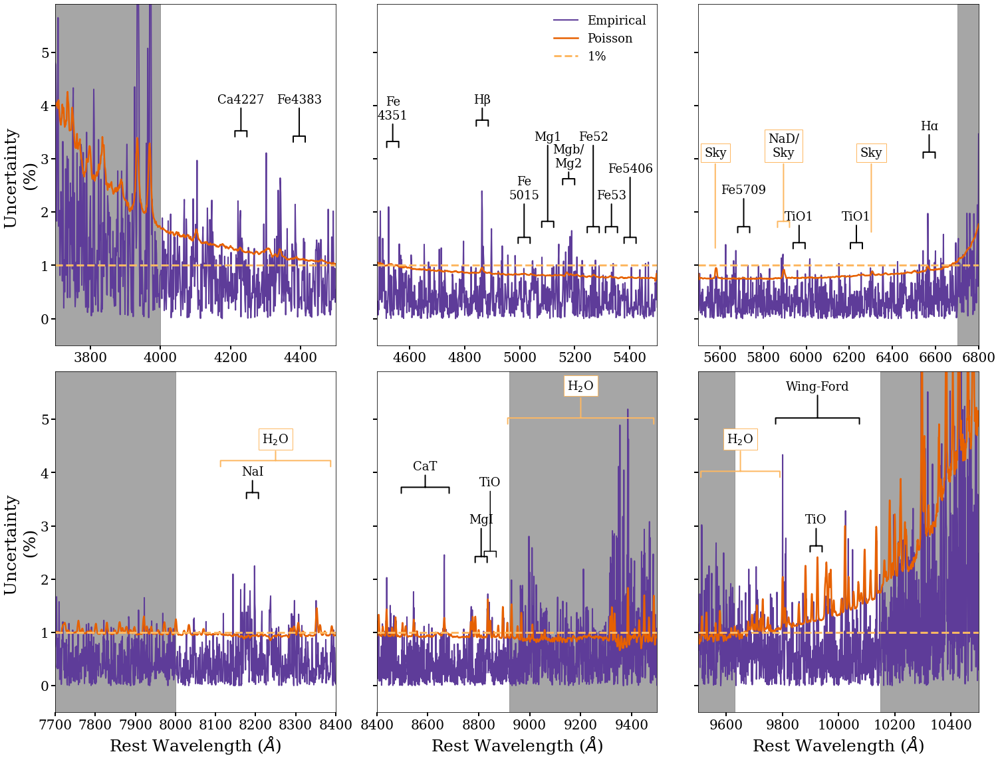

In [130]:
#Plot
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(21, 16), sharey='row')
fig.set_tight_layout(True)

ax[0,0].plot(norm_wave_blue_old_b058, blue_mad_b058, color='#5e3c99', lw=2)
ax[0,0].plot(norm_wave_blue_old_b058, unc_quad_sum_blue, color='#e66101', lw=2.5)
ax[0,0].tick_params(length=6, width=2, labelsize=20)
ax[0,0].set_xlim(3700, 4500)
ax[0,0].set_ylim(-0.5, 5.9)
ax[0,0].axhline(1, linestyle='dashed', color='#fdb863', lw=3)
ax[0,0].set_ylabel('Uncertainty \n(%)', fontsize=25)
ax[0,0].annotate('Ca4227', xy=((4223.5+4236.0)/2, 3.5), xytext=((4223.5+4236.0)/2, 4), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,0].annotate('Fe4383', xy=((4370.375+4421.625)/2, 3.4), xytext=((4370.375+4421.625)/2, 4), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,0].axvspan(3700, 4000, color='grey', alpha=0.7)

ax[0,1].plot(norm_wave_blue_old_b058, blue_mad_b058, color='#5e3c99', lw=2, label='Empirical')
ax[0,1].plot(norm_wave_blue_old_b058, unc_quad_sum_blue, color='#e66101', lw=2.5, label='Poisson')
ax[0,1].tick_params(length=6, width=2, labelsize=20)
ax[0,1].axhline(1, linestyle='dashed', color='#fdb863', lw=3, label='1%')
ax[0,1].set_xlim(4480, 5500)
ax[0,1].legend(fontsize=18, frameon=False, framealpha=0)
ax[0,1].annotate('Fe\n4351', xy=((4515.5+4560.5)/2, 3.3), xytext=((4515.5+4560.5)/2, 3.7), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,1].annotate('Hβ', xy=(4863.6, 3.7), xytext=(4863.6, 4), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,1].annotate('Fe52', xy=((5247.2+5287.2)/2, 1.7), xytext=((5247.2+5287.2)/2, 3.3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,1].annotate('Fe53', xy=((5313.6+5353.6)/2, 1.7), xytext=((5313.6+5353.6)/2, 2.2), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,1].annotate('Mgb/\nMg2', xy=((5161.6+5194.1)/2, 2.6), xytext=((5161.6+5194.1)/2, 2.8), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,1].annotate('Fe\n5015', xy=((4977.75+5054.0)/2, 1.5), xytext=((4977.75+5054.0)/2, 2.2), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,1].annotate('Mg1', xy=((5069.125+5134.125)/2, 1.8), xytext=((5069.125+5134.125)/2, 3.3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,1].annotate('Fe5406', xy=((5387.5+5415.0)/2, 1.5), xytext=((5387.5+5415.0)/2, 2.7), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))

ax[0,2].plot(norm_wave_blue_old_b058, blue_mad_b058, color='#5e3c99', lw=2)
ax[0,2].plot(norm_wave_blue_old_b058, unc_quad_sum_blue, color='#e66101', lw=2.5)
ax[0,2].tick_params(length=6, width=2, labelsize=20)
ax[0,2].axhline(1, linestyle='dashed', color='#fdb863', lw=3)
ax[0,2].set_xlim(5500, 6800)
ax[0,2].annotate('Sky', xy=(5578.5, 1.3), xytext=(5578.5, 3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', edgecolor='#fdb863'),
            arrowprops=dict(arrowstyle='-', lw=2.0, color='#fdb863'), color='k')
ax[0,2].annotate('Sky', xy=(6301.75, 1.6), xytext=(6301.75, 3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', edgecolor='#fdb863'),
            arrowprops=dict(arrowstyle='-', lw=2.0, color='#fdb863'), color='k')
ax[0,2].annotate('Fe5709', xy=((5698.375+5722.125)/2, 1.7), xytext=((5698.375+5722.125)/2, 2.3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,2].annotate('NaD/\nSky', xy=((5878.625+5911.125)/2, 1.8), xytext=((5878.625+5911.125)/2, 3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', edgecolor='#fdb863'),
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0, color='#fdb863'), color='k')
ax[0,2].annotate('TiO1', xy=((5938.375+5995.875)/2, 1.4), xytext=((5938.375+5995.875)/2, 1.8), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,2].annotate('TiO1', xy=((6191.375+6273.875)/2, 1.4), xytext=((6191.375+6273.875)/2, 1.8), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,2].annotate('Hɑ', xy=((6570), 3.1), xytext=((6570), 3.5), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[0,2].axvspan(6700, 6800, color='grey', alpha=0.7)

ax[1,0].plot(norm_wave_red_old_b058, red_mad_b058, color='#5e3c99', lw=2)
ax[1,0].plot(norm_wave_red_old_b058, unc_quad_sum_red, color='#e66101', lw=2.5)
ax[1,0].tick_params(length=6, width=2, labelsize=20)
ax[1,0].axhline(1, linestyle='dashed', color='#fdb863', lw=3)
ax[1,0].set_xlim(7700, 8400)
ax[1,0].set_ylabel('Uncertainty \n(%)', fontsize=25)
ax[1,0].set_xlabel('Rest Wavelength ($\AA$)', fontsize=25)
ax[1,0].annotate('H$_2$O', xy=(8250, 4.2), xytext=(8250, 4.5), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', edgecolor='#fdb863'),
            arrowprops=dict(arrowstyle='-[, widthB=4.6, lengthB=0.5', lw=2.0, color='#fdb863'), color='k')
ax[1,0].annotate('NaI', xy=((8182.3+8202.3)/2, 3.6), xytext=((8182.3+8202.3)/2, 3.9), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[1,0].axvspan(7700, 8000, color='grey', alpha=0.7)

ax[1,1].plot(norm_wave_red_old_b058, red_mad_b058, color='#5e3c99', lw=2)
ax[1,1].plot(norm_wave_red_old_b058, unc_quad_sum_red, color='#e66101', lw=2.5)
ax[1,1].tick_params(length=6, width=2, labelsize=20)
ax[1,1].axhline(1, linestyle='dashed', color='#fdb863', label='1%', lw=3)
ax[1,1].set_xlim(8400, 9500)
ax[1,1].set_xlabel('Rest Wavelength ($\AA$)', fontsize=25)
ax[1,1].annotate('CaT', xy=(8590, 3.7), xytext=(8590, 4), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=0.5', lw=2.0))
ax[1,1].annotate('H$_2$O', xy=(9200, 5), xytext=(9200, 5.5), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', edgecolor='#fdb863'),
            arrowprops=dict(arrowstyle='-[, widthB=6.1, lengthB=0.5', lw=2.0, color='#fdb863'), color='k')
ax[1,1].annotate('MgI', xy=((8801.9+8816.9)/2,2.4), xytext=((8801.9+8816.9)/2,3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[1,1].annotate('TiO', xy=((8835.0+8855.0)/2, 2.5), xytext=((8835.0+8855.0)/2, 3.7), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=1.5))
ax[1,1].axvspan(8920, 9500, color='grey', alpha=0.7)

ax[1,2].plot(norm_wave_red_old_b058, red_mad_b058, color='#5e3c99', lw=2)
ax[1,2].plot(norm_wave_red_old_b058, unc_quad_sum_red, color='#e66101', lw=2.5)
ax[1,2].tick_params(length=6, width=2, labelsize=20)
ax[1,2].axhline(1, linestyle='dashed', color='#fdb863', label='1%', lw=3)
ax[1,2].set_xlim(9500, 10500)
ax[1,2].set_xlabel('Rest Wavelength ($\AA$)', fontsize=25)
ax[1,2].annotate('H$_2$O', xy=(9650, 4), xytext=(9650, 4.5), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', edgecolor='#fdb863'),
            arrowprops=dict(arrowstyle='-[, widthB=3.3, lengthB=0.5', lw=2.0, color='#fdb863'), color='k')
ax[1,2].annotate('TiO', xy=((9905.0+9935.0)/2, 2.6), xytext=((9905.0+9935.0)/2, 3), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=0.5, lengthB=0.5', lw=2.0))
ax[1,2].annotate('Wing-Ford', xy=((9850+10000)/2, 5), xytext=((9850+10000)/2, 5.5), xycoords='data', 
            fontsize=18, ha='center', va='bottom',
            arrowprops=dict(arrowstyle='-[, widthB=3.5, lengthB=0.5', lw=2.0))
ax[1,2].axvspan(9500, 9630, color='grey', alpha=0.7)
ax[1,2].axvspan(10150, 10500, color='grey', alpha=0.7)
ax[1,2].set_ylim(-0.5, 5.9)
plt.savefig('paper_MAD_B058.pdf', bbox_inches='tight')